In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
from time import time

In [3]:
# PARAMETERS
INPUT_HEIGHT = 128
INPUT_WIDTH = 128

INPUT_SHAPE = (INPUT_HEIGHT, INPUT_WIDTH, 1)

latent_dims = 32

BETA_VALUE = 50



In [4]:
augmenter = tf.keras.Sequential([
        tf.keras.layers.RandomRotation(0.05, name=f"random_rotation", fill_mode="constant"),
        tf.keras.layers.RandomZoom(0.05, name=f"random_zoom", fill_mode="constant"),
        tf.keras.layers.RandomTranslation(0.1, 0.1, name=f"random_translation", fill_mode="constant"),
        tf.keras.layers.RandomCrop(INPUT_HEIGHT, INPUT_WIDTH, name=f"random_crop")
])

augmenter.summary()

I0000 00:00:1750795298.346929      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1750795298.347806      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ random_rotation (RandomRotation)     │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom (RandomZoom)             │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_translation                   │ ?                           │     0 (unbuilt) │
│ (RandomTranslation)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_crop (RandomCrop)             │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [5]:
class Preprocessor(tf.keras.Model):
    def __init__(self):
        super().__init__(name="preprocessor")
        self.augmenter = tf.keras.Sequential([
            tf.keras.layers.Resizing(INPUT_HEIGHT, INPUT_WIDTH, name=f"{self.name}_resizer"),
            tf.keras.layers.Rescaling(scale=1./255, name=f"{self.name}_rescaler"),
        ], name=f"{self.name}_augmenter")

    def call(self, inputs):
        return self.augmenter(inputs)


In [11]:
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Lambda, Reshape, Conv2DTranspose, BatchNormalization

In [12]:
class Encoder(tf.keras.layers.Layer):
  def __init__(self, latent_dims):
    super().__init__(name="encoder")

    self.latent_dims = latent_dims

    # layers
    self.preprocess = Preprocessor()
    # 128 x 128 x 1
    self.conv1 = Conv2D(filters=32, kernel_size=3, strides=1, padding='same', activation='relu', name='encoder_conv1')
    self.bnorm1 = BatchNormalization(name="encoder_bnorm1")
    self.mpool1 = MaxPool2D(name='encoder_mpool1')

    # 64 x 64 x 32
    self.conv2 = Conv2D(filters=64, kernel_size=3, strides=1, padding='same', activation='relu', name='encoder_conv2')
    self.bnorm2 = BatchNormalization(name="encoder_bnorm2")
    self.mpool2 = MaxPool2D(name='encoder_mpool2')

    # 32 x 32 x 64
    self.conv3 = Conv2D(filters=128, kernel_size=3, strides=1, padding='same', activation='relu', name='encoder_conv3')
    self.bnorm3 = BatchNormalization(name="encoder_bnorm3")
    self.mpool3 = MaxPool2D(name='encoder_mpool3')

    # 16 x 16 x 128
    self.conv4 = Conv2D(filters=256, kernel_size=3, strides=1, padding='same', activation='relu', name='encoder_conv4')
    self.bnorm4 = BatchNormalization(name="encoder_bnorm4")
    self.mpool4 = MaxPool2D(name='encoder_mpool4')

    # 8 x 8 x 256
    self.conv5 = Conv2D(filters=512, kernel_size=3, strides=1, padding='same', activation='relu', name='encoder_conv5')
    self.bnorm5 = BatchNormalization(name="encoder_bnorm5")
    self.mpool5 = MaxPool2D(name='encoder_mpool5')

    # 4 x 4 x 512
    self.flatten = Flatten(name='encoder_flatten')

    self.dense1 = Dense(2 * self.latent_dims, name='encoder_dense1')
    # 2 x self.latent_dims


    self.logvar = Dense(self.latent_dims, name='encoder_logvar')
    self.mu = Dense(self.latent_dims, name='encoder_mu')
    self.sigma = Lambda(lambda x: tf.exp(0.5*x), name='encoder_sigma')
    self.logvar_clip = Lambda(lambda x: tf.clip_by_value(x, -20.0, 5.0), name='logvar_clip')


  def encode(self, inputs, preprocess=True):
    # print the shape of the input
    # print(f"Shape of input to encoder: {inputs.shape}")
    p = self.preprocess(inputs) if preprocess else inputs
    x=self.conv1(p); x=self.bnorm1(x); x=self.mpool1(x)
    x=self.conv2(x); x=self.bnorm2(x);  x=self.mpool2(x)
    x=self.conv3(x); x=self.bnorm3(x);  x=self.mpool3(x)
    x=self.conv4(x); x=self.bnorm4(x);  x=self.mpool4(x)
    x=self.conv5(x); x=self.bnorm5(x);  x=self.mpool5(x)
    x=self.flatten(x)
    x=self.dense1(x)
    # print(f"Shape of output from encoder: {x.shape}")

    logvar = self.logvar(x)
    logvar = self.logvar_clip(logvar)

    return self.mu(x), logvar, self.sigma(logvar), p


  def call(self, inputs):
    return self.encode(inputs)

  def summary(self, input_shape):
    x = tf.keras.layers.Input(shape=input_shape)
    model = tf.keras.Model(inputs=[x], outputs=self.call(x))
    return model.summary()

In [13]:
class Decoder(tf.keras.Model):
    def __init__(self, latent_dims):
        super().__init__(name='decoder')

        self.latent_dims = latent_dims

        # layers
        self.dense1 = Dense(4 * 4 * 512, activation='relu', name='decoder_dense1')
        self.reshape1 = Reshape((4, 4, 512), name='decoder_reshape1')

        # 4 x 4 x 512 -> 8 x 8 x 256
        self.convT1 = Conv2DTranspose(filters=256, kernel_size=3, strides=2, padding='same', activation='relu', name='decoder_convT1')
        self.bnorm1 = BatchNormalization(name="decoder_bnorm1")

        # 8 x 8 x 256 -> 16 x 16 x 128
        self.convT2 = Conv2DTranspose(filters=128, kernel_size=3, strides=2, padding='same', activation='relu', name='decoder_convT2')
        self.bnorm2 = BatchNormalization(name="decoder_bnorm2")

        # 16 x 16 x 128 -> 32 x 32 x 64
        self.convT3 = Conv2DTranspose(filters=64, kernel_size=3, strides=2, padding='same', activation='relu', name='decoder_convT3')
        self.bnorm3 = BatchNormalization(name="decoder_bnorm3")

        # 32 x 32 x 64 -> 64 x 64 x 32
        self.convT4 = Conv2DTranspose(filters=32, kernel_size=3, strides=2, padding='same', activation='relu', name='decoder_convT4')
        self.bnorm4 = BatchNormalization(name="decoder_bnorm4")

        # 64 x 64 x 32 -> 128 x 128 x 1
        self.convT5 = Conv2DTranspose(filters=1, kernel_size=3, strides=2, padding='same', activation='sigmoid', name='decoder_convT5')


        # binary output
        # self.binaryOutput = Lambda(lambda x: tf.cast(x > 0.5, tf.float32), name="decoder_binary_lambda")

    def decode(self, z):
        x = self.dense1(z)
        x = self.reshape1(x)

        x = self.convT1(x)
        x = self.convT2(x)
        x = self.convT3(x)
        x = self.convT4(x)
        x = self.convT5(x)
        # x = self.binaryOutput(x)


        return x

    def call(self, inputs):
        return self.decode(inputs)

    def summary(self, input_shape):
        x = tf.keras.layers.Input(shape=input_shape)
        model = tf.keras.Model(inputs=[x], outputs=self.call(x))
        return model.summary()

In [14]:
encoder = Encoder(latent_dims=latent_dims) # Example latent_dims
print("Encoder Summary:")
encoder.summary(input_shape=INPUT_SHAPE)

decoder = Decoder(latent_dims=latent_dims)
print("\nDecoder Summary:")
decoder.summary(input_shape=(latent_dims,))

Encoder Summary:


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 1)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ preprocessor              │ (None, 128, 128, 1)    │              0 │ input_layer[0][0]      │
│ (Preprocessor)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_conv1 (Conv2D)    │ (None, 128, 128, 32)   │            320 │ preprocessor[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_bnorm1            │ (None, 128, 128, 32)   │            128 │ encoder_conv1[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_mpool1            │ (None, 64, 64, 32)     │              0 │ encoder_bnorm1[0][0]   │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_conv2 (Conv2D)    │ (None, 64, 64, 64)     │         18,496 │ encoder_mpool1[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_bnorm2            │ (None, 64, 64, 64)     │            256 │ encoder_conv2[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_mpool2            │ (None, 32, 32, 64)     │              0 │ encoder_bnorm2[0][0]   │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_conv3 (Conv2D)    │ (None, 32, 32, 128)    │         73,856 │ encoder_mpool2[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_bnorm3            │ (None, 32, 32, 128)    │            512 │ encoder_conv3[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_mpool3            │ (None, 16, 16, 128)    │              0 │ encoder_bnorm3[0][0]   │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_conv4 (Conv2D)    │ (None, 16, 16, 256)    │        295,168 │ encoder_mpool3[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_bnorm4            │ (None, 16, 16, 256)    │          1,024 │ encoder_conv4[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_mpool4            │ (None, 8, 8, 256)      │              0 │ encoder_bnorm4[0][0]   │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_conv5 (Conv2D)    │ (None, 8, 8, 512)      │      1,180,160 │ encoder_mpool4[0][0]   │
├──────────────────────

 Total params: 2,100,480 (8.01 MB)

 Trainable params: 2,098,496 (8.01 MB)

 Non-trainable params: 1,984 (7.75 KB)


Decoder Summary:


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder_dense1 (Dense)               │ (None, 8192)                │         270,336 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder_reshape1 (Reshape)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder_convT1 (Conv2DTranspose)     │ (None, 8, 8, 256)           │       1,179,904 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder_convT2 (Conv2DTranspose)     │ (None, 16, 16, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder_convT3 (Conv2DTranspose)     │ (None, 32, 32, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder_convT4 (Conv2DTranspose)     │ (None, 64, 64, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder_convT5 (Conv2DTranspose)     │ (None, 128, 128, 1)         │             289 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,837,825 (7.01 MB)

 Trainable params: 1,837,825 (7.01 MB)

 Non-trainable params: 0 (0.00 B)

In [7]:
class ReconstructionLoss(tf.keras.layers.Layer):
  def __init__(self):
    super(ReconstructionLoss, self).__init__(name="reconstruction_loss")
    self.epsilon = tf.keras.backend.epsilon() # Get a small epsilon value


  def call(self, inputs):
    x = inputs[0]
    recon_x = inputs[1]

    recon_x = tf.clip_by_value(recon_x, self.epsilon, 1.0 - self.epsilon)


      
    tf.debugging.check_numerics(x, 'recons x contains NaN or Inf')
    tf.debugging.check_numerics(recon_x, 'reconx contains NaN or Inf')


    recon_loss = tf.reduce_sum(tf.keras.losses.binary_crossentropy(x, recon_x), axis=[1,2])
    recon_loss = tf.reduce_mean(recon_loss)

    self.add_loss(recon_loss)

    return recon_loss

In [8]:
class KLLoss(tf.keras.layers.Layer):
  def __init__(self, beta=1.0):
    super(KLLoss, self).__init__()
    self.beta = beta
    print("Beta set at", self.beta)

  def call(self, inputs):
    mu = inputs[0]
    logvar = inputs[1]
    
      
    tf.debugging.check_numerics(mu, 'mu klloss contains NaN or Inf') 
    tf.debugging.check_numerics(logvar, 'logvar klloss contains NaN or Inf')

    kl_loss = -0.5 * tf.reduce_sum(1 + logvar - tf.square(mu) - tf.exp(logvar), axis=1)
    kl_loss = kl_loss * self.beta

    self.add_loss(kl_loss)
    return kl_loss

In [9]:
# Sampler

class Sampler(tf.keras.layers.Layer):
  def __init__(self):
    super().__init__(name="sampler")

  def call(self, inputs):
    mu = inputs[0]
    sigma = inputs[1]

    batch = tf.shape(mu)[0]
    dim = tf.shape(mu)[1]
    epsilon = tf.random.normal(shape=(batch, dim))

    # reparameterize
    output =  mu + tf.multiply(sigma, epsilon)

    # print(f"Shape of output from sampler: {output.shape}")
    return output



In [20]:
class BVAE(tf.keras.Model):
  def __init__(self, latent_dims):
    super().__init__(name="bvae")

    self.latent_dims = latent_dims

    # layers
    self.encoder = Encoder(self.latent_dims)
    self.decoder = Decoder(self.latent_dims)

    self.sampler = Sampler()

    self.reconstruction_loss = ReconstructionLoss()
    self.kl_loss = KLLoss(beta=BETA_VALUE)

    # trackers
    self.loss_tracker = tf.keras.metrics.Mean(name="loss")
    self.reconstruction_loss_tracker = tf.keras.metrics.Mean(name="reconstruction_loss")
    self.kl_loss_tracker = tf.keras.metrics.Mean(name="kl_loss")

  def get_config(self):
    config = super().get_config()
    config.update({
        "latent_dims": self.latent_dims,
    })
    return config

  @classmethod
  def from_config(cls, config):
    # Extract latent_dims from the config
      latent_dims = config.pop('latent_dims')
      # Remove other keys added by Keras during saving if they are not needed for __init__
      config.pop('name', None)
      config.pop('trainable', None)
      config.pop('dtype', None)
      # Create an instance of the class using the extracted latent_dims
      return cls(latent_dims=latent_dims, **config)



  def call(self, inputs):
    mu, logvar, sigma, x = self.encoder(inputs)

    tf.debugging.check_numerics(mu, 'Encoder mu contains NaN or Inf')
    tf.debugging.check_numerics(logvar, 'Encoder logvar contains NaN or Inf')
    tf.debugging.check_numerics(sigma, 'Encoder sigma contains NaN or Inf')
    tf.debugging.check_numerics(x, 'Preprocessor output contains NaN or Inf')


    # print(mu, logvar, x)
    z = self.sampler([mu, sigma])
    # print(f"Shape of z: {z.shape}")
    recon_x = self.decoder(z)

    kl_loss = self.kl_loss([mu, logvar])
    reconstruction_loss = self.reconstruction_loss([x, recon_x])

    return recon_x, kl_loss, reconstruction_loss

  @property
  def metrics(self):
      return [
          self.loss_tracker,
          self.reconstruction_loss_tracker,
          self.kl_loss_tracker,
      ]

  def train_step(self, data):
    # print(f"Shape of input data in train_step: {data.shape}")

    with tf.GradientTape() as tape:
      recon_x, kl_loss, reconstruction_loss = self(data)
      total_loss = reconstruction_loss + kl_loss

      # update the trackers
      self.loss_tracker.update_state(total_loss)
      self.reconstruction_loss_tracker.update_state(reconstruction_loss)
      self.kl_loss_tracker.update_state(kl_loss)

      # gradients
      grads = tape.gradient(total_loss, self.trainable_weights)
      self.optimizer.apply_gradients(zip(grads, self.trainable_weights))

    return {
        m.name: m.result() for m in self.metrics
    }

  def test_step(self, data):
    recon_x, kl_loss, reconstruction_loss = self(data)
    total_loss = reconstruction_loss + kl_loss
    self.loss_tracker.update_state(total_loss)
    self.reconstruction_loss_tracker.update_state(reconstruction_loss)
    self.kl_loss_tracker.update_state(kl_loss)
    return {
        m.name: m.result() for m in self.metrics
    }

  def encode(self, inputs, preprocess=True):
    return self.encoder.encode(inputs, preprocess=preprocess)

  def decode(self, inputs):
    return self.decoder.decode(inputs)

  def sample(self, mu, sigma):
    return self.sampler([mu, sigma])

  def calculate_reconstruction_loss(self, inputs):
    return self.reconstruction_loss(inputs)

  def calculate_kl_loss(self, inputs):
    return self.kl_loss(inputs)






In [16]:
class BetaVaeParameterUpdater(tf.keras.callbacks.Callback):
  def __init__(self, delta, limit):
    super().__init__()
    self.delta = delta
    self.limit = limit

  @tf.function
  def update_beta(self):
    beta = self.model.kl_loss.beta
    beta = tf.math.maximum(beta - self.delta, self.limit)

  def on_epoch_end(self, epoch, logs=None):
    self.update_beta()

In [21]:
model = BVAE(latent_dims=latent_dims)
print("latent_dims:", latent_dims)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3))



Beta set at 50
latent_dims: 32


In [ ]:
dummy_input = tf.zeros((1, INPUT_HEIGHT, INPUT_WIDTH, 1))
model(dummy_input)
model.summary()


In [15]:
images_path = "/kaggle/input/images/images"

In [16]:
images = tf.keras.utils.image_dataset_from_directory(
    images_path,
    labels="inferred",
    label_mode= "int",
    color_mode='grayscale',
    image_size=(128, 128),
    batch_size=32,
    shuffle=True, # Ensure shuffling for random split
    seed=42 # Optional: Set seed for reproducible split
)

# Calculate the size of the dataset
dataset_size = tf.data.experimental.cardinality(images).numpy()


train_size = int(0.8 * dataset_size)
test_size = dataset_size - train_size

# Split the dataset using take and skip
train_ds = images.take(train_size)
test_ds = images.skip(train_size)

aug_train_ds = train_ds.map(lambda x, y: (augmenter(x, training=True), y))
train_ds = train_ds.concatenate(aug_train_ds)

Found 1901 files belonging to 30 classes.


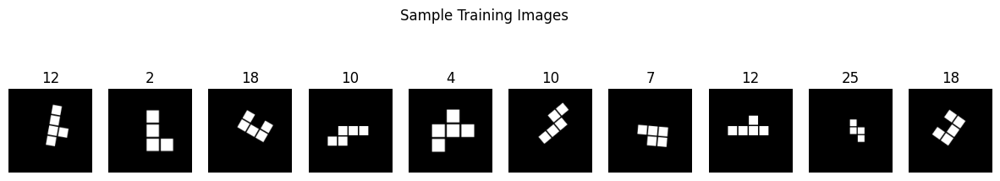

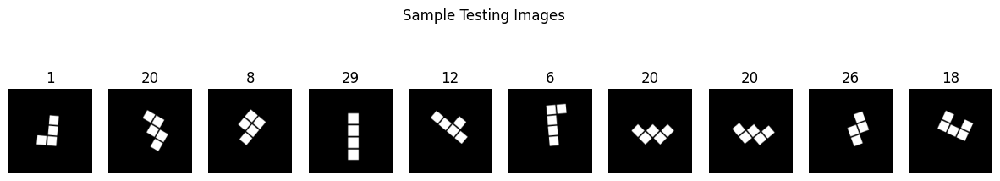

In [17]:
import matplotlib.pyplot as plt
import tensorflow as tf

def plot_dataset_samples(dataset, title, num_images=10):
    images_batch, labels_batch = next(iter(dataset.take(1)))
    plt.figure(figsize=(15, 3))
    for i in range(num_images):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(tf.squeeze(images_batch[i]).numpy(), cmap='gray')
        plt.title(str(labels_batch[i].numpy()))
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

plot_dataset_samples(train_ds, 'Sample Training Images')
plot_dataset_samples(test_ds, 'Sample Testing Images')


In [ ]:
import matplotlib.pyplot as plt

beta_updater_callback = BetaVaeParameterUpdater(delta=2e-4, limit=0.0) # Example values

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                     patience=50,
                                                     cooldown=25,
                                                     min_lr=1e-5,
                                                     min_delta=1.0,
                                                     verbose=1)

early_stop_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                           patience=100,
                                                           restore_best_weights=True,
                                                           min_delta=1.0,
                                                           verbose=1)
terminate_on_nan = tf.keras.callbacks.TerminateOnNaN()

history = model.fit(
    train_ds,
    epochs=20000, # Adjust the number of epochs as needed
    validation_data=test_ds,
    callbacks=[beta_updater_callback, early_stop_callback, terminate_on_nan] # Add the callback
)

# Plot training history (optional)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [22]:
loaded_model_path = "/kaggle/input/32dims/keras/default/1/bvae_model_ldims_32_1750793874_new.keras"
loaded_model = tf.keras.models.load_model(loaded_model_path, custom_objects={'BVAE':BVAE})

loaded_model.summary()
model = loaded_model

Beta set at 50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:393: UserWarning: `build()` was called on layer 'decoder', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Model: "bvae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ encoder (Encoder)                    │ ?                           │       2,100,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder (Decoder)                    │ ?                           │       1,837,825 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sampler (Sampler)                    │ ?                           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reconstruction_loss                  │ ?                           │               0 │
│ (ReconstructionLoss)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ kl_loss_1 (KLLoss)                   │ ?                           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,810,949 (45.06 MB)

 Trainable params: 3,936,321 (15.02 MB)

 Non-trainable params: 1,984 (7.75 KB)

 Optimizer params: 7,872,644 (30.03 MB)

In [ ]:
# save the model
model.save(f"bvae_model_ldims_{latent_dims}_{round(time())}_new.keras")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


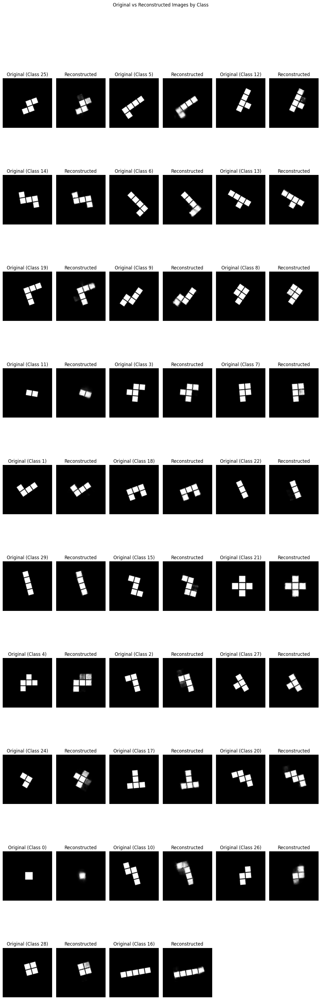

In [24]:
import matplotlib.pyplot as plt

# Get unique classes
unique_classes = np.unique([label.numpy() for _, label in test_ds.unbatch()])

# Collect one image per class
selected_images = []
selected_labels = []
for test_batch, label_batch in test_ds:
    for img, lbl in zip(test_batch, label_batch):
        lbl_val = lbl.numpy()
        if lbl_val not in selected_labels:
            selected_images.append(img)
            selected_labels.append(lbl_val)
        if len(selected_images) == len(unique_classes):
            break
    if len(selected_images) == len(unique_classes):
        break

original_images = tf.stack(selected_images)

# Ensure the model is built by passing a sample input
model.predict(original_images[:1])
reconstructed_images, _, _ = model(original_images)

# Plot with 3 pairs per row: Original - Reconstructed side by side
num_images = len(original_images)
cols = 3
rows = int(np.ceil(num_images / cols))

plt.figure(figsize=(cols * 4, rows * 4))
for idx in range(num_images):
    col_position = (idx % cols) * 2 + 1
    row_position = idx // cols

    # Original image
    plt.subplot(rows, cols * 2, row_position * cols * 2 + col_position)
    plt.imshow(tf.squeeze(original_images[idx]).numpy(), cmap='gray')
    plt.title(f"Original (Class {selected_labels[idx]})")
    plt.axis('off')

    # Reconstructed image
    plt.subplot(rows, cols * 2, row_position * cols * 2 + col_position + 1)
    plt.imshow(tf.squeeze(reconstructed_images[idx]).numpy(), cmap='gray')
    plt.title("Reconstructed")
    plt.axis('off')

plt.suptitle('Original vs Reconstructed Images by Class')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [ ]:
import matplotlib.pyplot as plt
# Select a few images from the test dataset to reconstruct
num_images_to_reconstruct = 1

# Take a batch from the test dataset
for test_batch_img, _ in test_ds.take(1):
    # Select the first `num_images_to_reconstruct` images from the batch
    to_encode_images = test_batch[:num_images_to_reconstruct]
to_encode_images

In [ ]:
to_encode_images.shape

In [ ]:
encoded_images = model.encode(to_encode_images)
mu, log, sigma, recon = encoded_images

mu

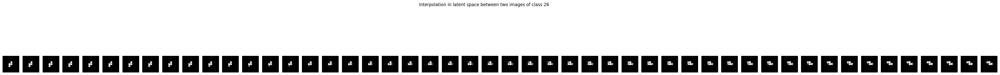

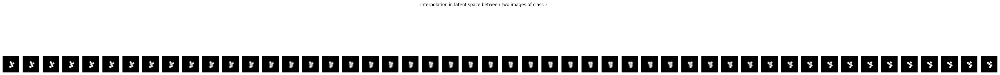

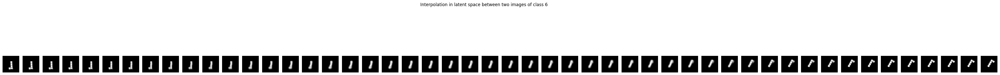

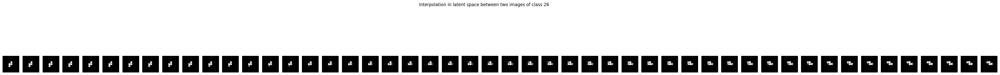

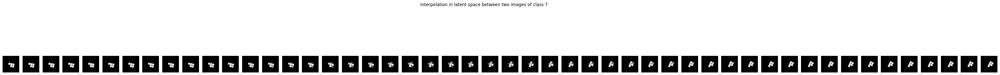

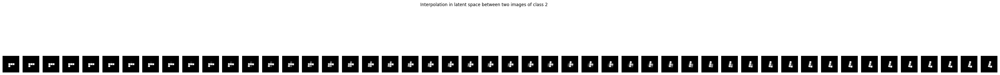

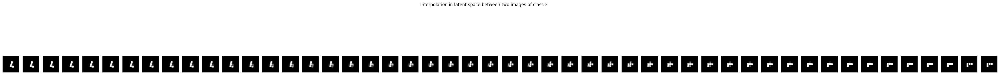

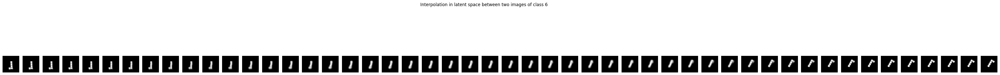

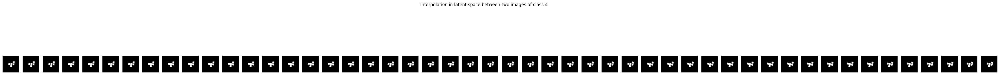

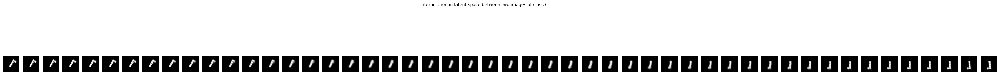

In [28]:
train_images, train_labels = next(iter(train_ds.take(1)))
train_mu, _, _, _ = model.encode(train_images)
train_latents = train_mu.numpy()
labels = train_labels.numpy()

unique_classes, counts = np.unique(labels, return_counts=True)
valid_classes = unique_classes[counts >= 2]

for _ in range(10):
    cls = np.random.choice(valid_classes)
    class_indices = np.where(labels == cls)[0]
    idx1, idx2 = np.random.choice(class_indices, size=2, replace=False)

    latent1 = train_latents[idx1]
    latent2 = train_latents[idx2]
    direction = latent2 - latent1

    steps = 50
    interpolated_latents = np.array([latent1 + (direction * t / (steps - 1)) for t in range(steps)])
    reconstructed_images = model.decode(interpolated_latents).numpy()

    plt.figure(figsize=(steps, 5))

    plt.suptitle(f'Interpolation in latent space between two images of class {cls}')
    for i in range(steps):
        plt.subplot(1, steps, i + 1)
        plt.imshow(tf.squeeze(reconstructed_images[i]), cmap='gray')
        plt.axis('off')
    plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import tensorflow as tf

# def generate_images_along_latent(model, start_latent_vector, latent_dim_index, steps=10, span=3.0):
#     images = []
#     latent_values = np.linspace(0, span, steps)

#     for value in latent_values:
#         current_latent_vector = np.copy(start_latent_vector)
#         current_latent_vector[latent_dim_index] = value

#         current_latent_vector_batch = np.expand_dims(current_latent_vector, axis=0)

#         generated_image = model.decode(current_latent_vector_batch)
#         generated_image = tf.squeeze(generated_image).numpy()

#         images.append((generated_image, value))

#     return images

# latent_dims = model.latent_dims
# random_latent_vector = np.random.normal(size=(latent_dims,))

# start_image = model.decode(np.expand_dims(random_latent_vector, axis=0))
# start_image = tf.squeeze(start_image).numpy()

# for dim_index in range(min(latent_dims, 20)):
#     print(f"Generating images by varying latent dimension {dim_index}")
#     generated_images = generate_images_along_latent(
#         model,
#         random_latent_vector,
#         dim_index,
#         steps=20,
#         span=76
#     )

#     plt.figure(figsize=(len(generated_images) * 2, 2))
#     for i, (img, value) in enumerate(generated_images):
#         plt.subplot(1, len(generated_images), i + 1)
#         plt.imshow(img, cmap='gray')
#         plt.axis('off')
#         plt.title(f'{value:.1f}')

#     plt.suptitle(f'Latent Dimension {dim_index} (Step: {30 / (10 - 1):.2f})')
#     plt.show()


In [29]:
# cosine similarity and confusion matrices
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
# all_latent_vectors

In [30]:
def curr_activation(x, a, b):
    return 1.0 / (1.0 + np.exp(-a*x+b))
a = 40.0
b = a * 0.8

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_45
Received: inputs=('Tensor(shape=(32, 128, 128, 1))', 'Tensor(shape=(32,))')
  warnings.warn(msg)


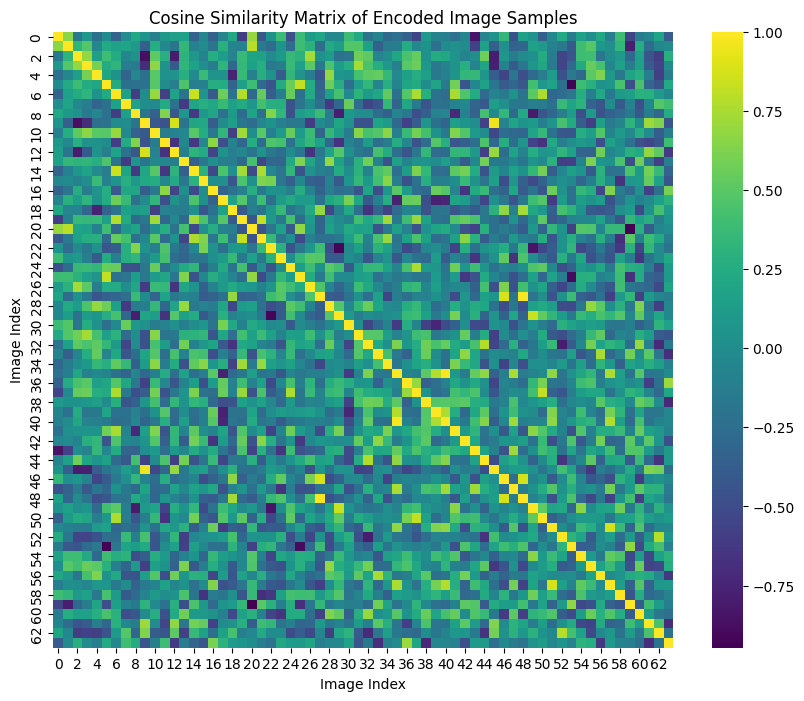

In [31]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Get a batch of images from train and test datasets
train_images_sample = next(iter(train_ds.take(1)))
test_images_sample = next(iter(test_ds.take(1)))

# Encode the image samples
train_mu, _, _, _ = model.encode(train_images_sample)
test_mu, _, _, _ = model.encode(test_images_sample)

# Concatenate the latent representations for comparison
all_latent_vectors = tf.concat([train_mu, test_mu], axis=0)

# Calculate cosine similarity between all pairs of latent vectors
similarity_matrix = cosine_similarity(all_latent_vectors.numpy())

similarity_act = curr_activation(similarity_matrix, a, b)

plt.figure(figsize=(10, 8))
sns.heatmap(similarity_matrix, annot=False, cmap='viridis', fmt=".2f") # annot=True can clutter for large matrices
plt.title('Cosine Similarity Matrix of Encoded Image Samples')
plt.xlabel('Image Index')
plt.ylabel('Image Index')
plt.show()


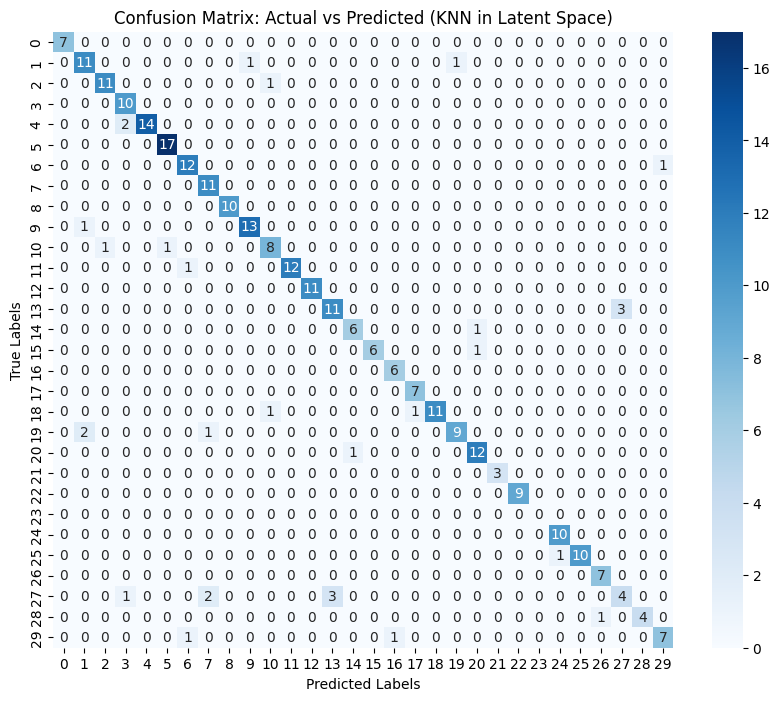

Accuracy: 0.8967
Test Sample 0:
  Image ID: 723
  True Label: 10
  Predicted Label: 10
  Neighbor IDs: [1652  254  876 1698  671]
  Neighbor Labels: [10 10 10  5 10]
  Neighbor Distances: [0.0242846  0.03019148 0.1168825  0.12313104 0.12327445]


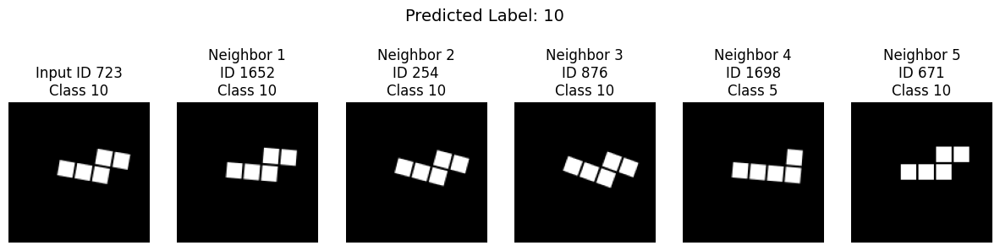

Test Sample 1:
  Image ID: 72
  True Label: 3
  Predicted Label: 3
  Neighbor IDs: [1451 1140 1805 1669  331]
  Neighbor Labels: [3 3 3 3 4]
  Neighbor Distances: [0.03625453 0.05818892 0.1397168  0.17975074 0.18691623]


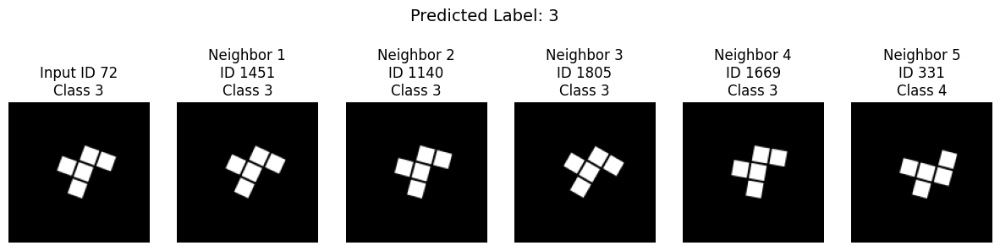

Test Sample 2:
  Image ID: 516
  True Label: 19
  Predicted Label: 1
  Neighbor IDs: [1043  218 1829 1570 1842]
  Neighbor Labels: [19 19  1  1  7]
  Neighbor Distances: [0.02840739 0.12781441 0.13854426 0.16033185 0.16115505]


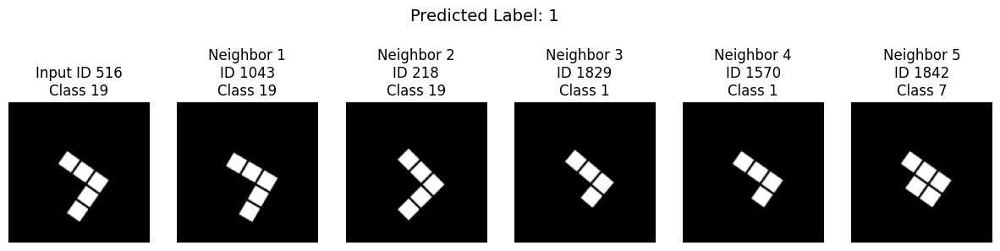

Test Sample 3:
  Image ID: 1696
  True Label: 14
  Predicted Label: 14
  Neighbor IDs: [ 710  312 1173  158  149]
  Neighbor Labels: [14 14 14 20 20]
  Neighbor Distances: [0.03768337 0.13433337 0.14062023 0.154679   0.16794437]


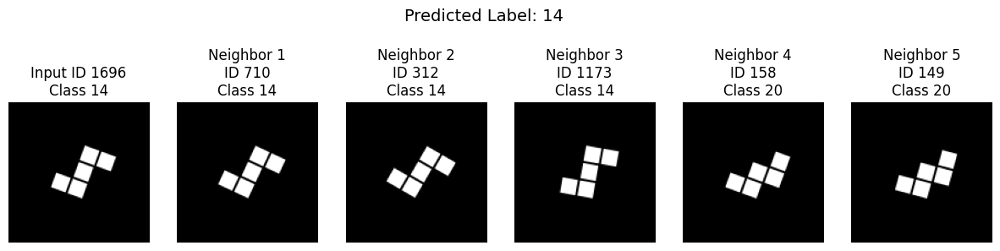

Test Sample 4:
  Image ID: 984
  True Label: 29
  Predicted Label: 29
  Neighbor IDs: [1739  920 1181 1076 1832]
  Neighbor Labels: [29 29 29 16  5]
  Neighbor Distances: [0.02832109 0.10699433 0.10701311 0.13890523 0.14160508]


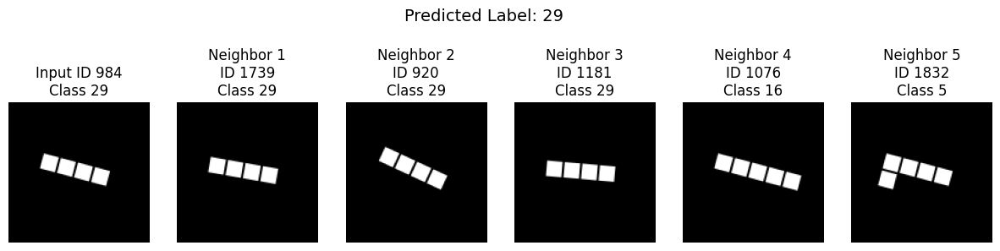

Test Sample 5:
  Image ID: 635
  True Label: 27
  Predicted Label: 13
  Neighbor IDs: [ 849  493 1751 1732   10]
  Neighbor Labels: [27 13 13 27  3]
  Neighbor Distances: [0.14936388 0.16110468 0.16654599 0.17133093 0.17546725]


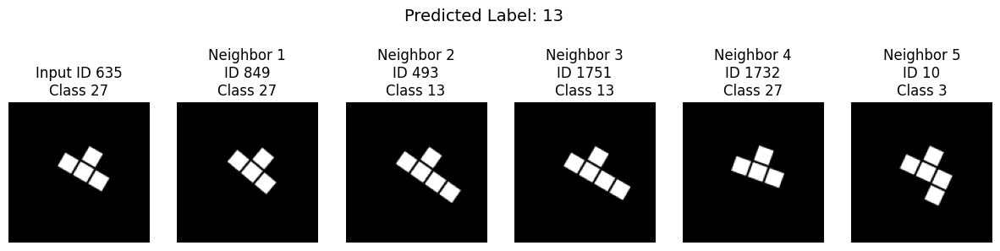

Test Sample 6:
  Image ID: 98
  True Label: 18
  Predicted Label: 18
  Neighbor IDs: [1791 1654  622  421  323]
  Neighbor Labels: [18 18 17 18  9]
  Neighbor Distances: [0.05360693 0.13681912 0.2669264  0.27391922 0.29114062]


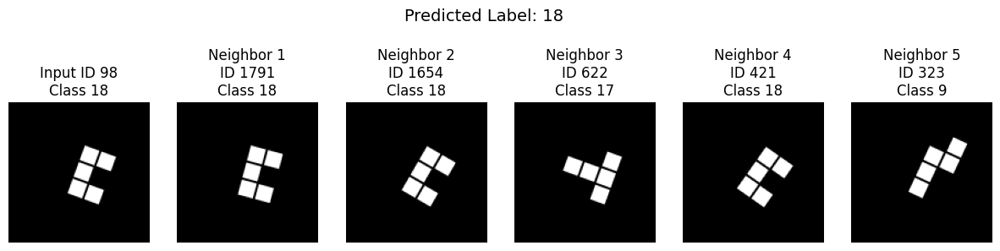

Test Sample 7:
  Image ID: 1679
  True Label: 11
  Predicted Label: 11
  Neighbor IDs: [ 871   55 1204 1202 1642]
  Neighbor Labels: [11 11 11 22 22]
  Neighbor Distances: [0.00681531 0.01452738 0.08140534 0.08982611 0.11097842]


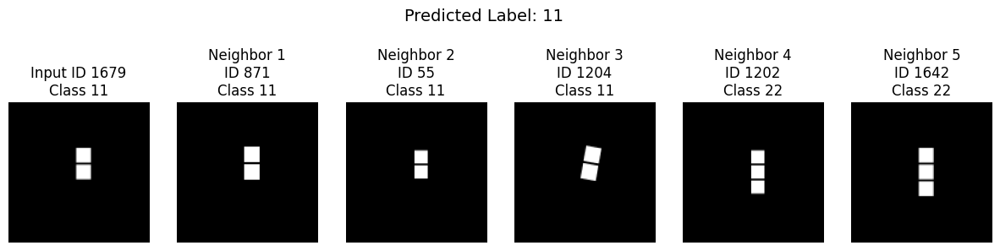

Test Sample 8:
  Image ID: 503
  True Label: 15
  Predicted Label: 15
  Neighbor IDs: [ 938 1147   31  334  641]
  Neighbor Labels: [15 15 15 15  2]
  Neighbor Distances: [0.03609574 0.03691453 0.14312351 0.16493082 0.18713236]


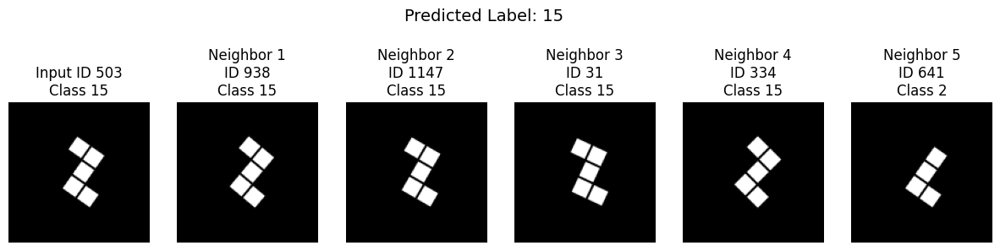

Test Sample 9:
  Image ID: 1694
  True Label: 9
  Predicted Label: 1
  Neighbor IDs: [1544 1228 1163  470 1673]
  Neighbor Labels: [ 9  6  1  7 26]
  Neighbor Distances: [0.03903997 0.04807127 0.06192434 0.09086448 0.11419994]


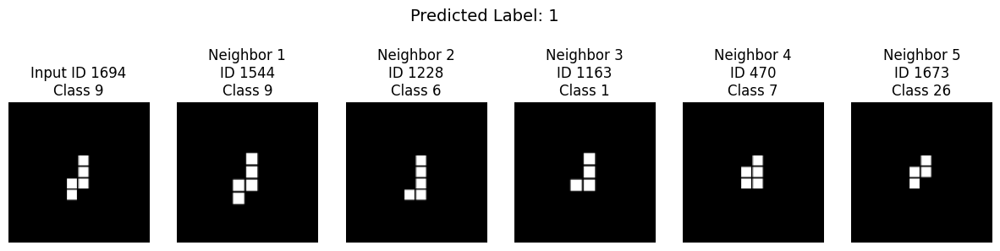

Test Sample 10:
  Image ID: 865
  True Label: 1
  Predicted Label: 1
  Neighbor IDs: [ 163  201 1552  943  457]
  Neighbor Labels: [ 1  1  1  9 14]
  Neighbor Distances: [0.02666843 0.05579275 0.10778773 0.13680929 0.1407674 ]


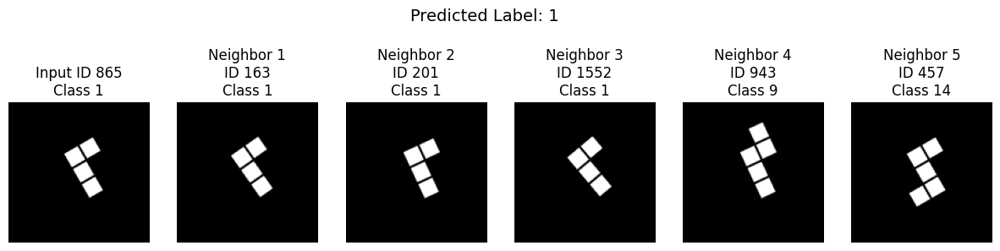

Test Sample 11:
  Image ID: 1042
  True Label: 27
  Predicted Label: 7
  Neighbor IDs: [1614   95  602 1501  397]
  Neighbor Labels: [27 27  8  7  7]
  Neighbor Distances: [0.03539312 0.04799539 0.14075714 0.151205   0.1517294 ]


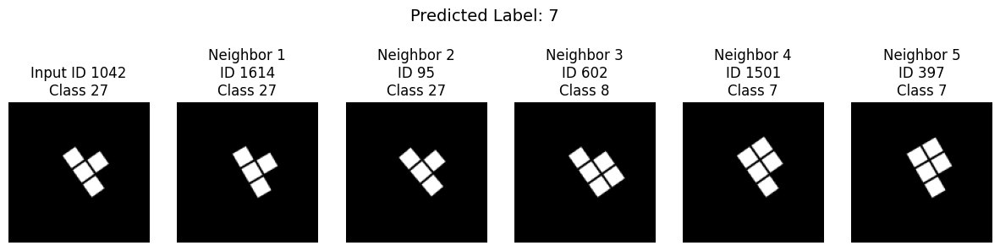

Test Sample 12:
  Image ID: 36
  True Label: 20
  Predicted Label: 20
  Neighbor IDs: [ 292  781  754 1121 1793]
  Neighbor Labels: [20 20 20 20 15]
  Neighbor Distances: [0.03071928 0.04894978 0.1227051  0.15358561 0.18671054]


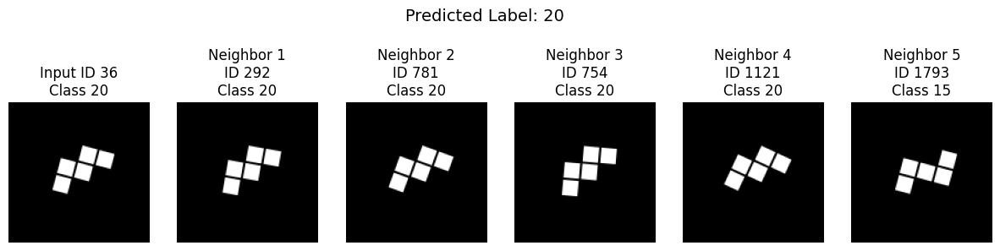

Test Sample 13:
  Image ID: 1565
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [ 715 1320   93  915 1574]
  Neighbor Labels: [9 9 9 6 9]
  Neighbor Distances: [0.02854693 0.0321784  0.09482658 0.13112462 0.13119292]


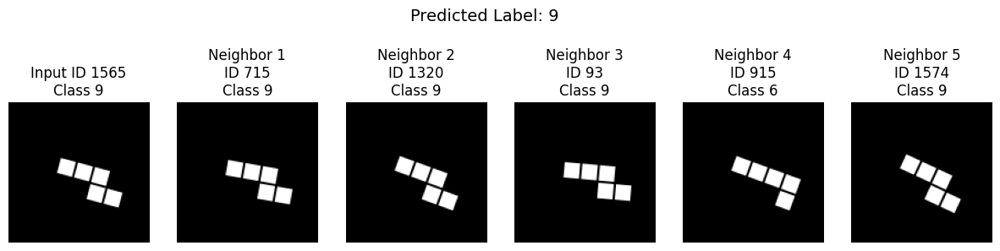

Test Sample 14:
  Image ID: 1229
  True Label: 27
  Predicted Label: 13
  Neighbor IDs: [1054 1562 1344 1312 1594]
  Neighbor Labels: [27 27  8 13 13]
  Neighbor Distances: [0.04786927 0.05334681 0.13688326 0.16292137 0.16453958]


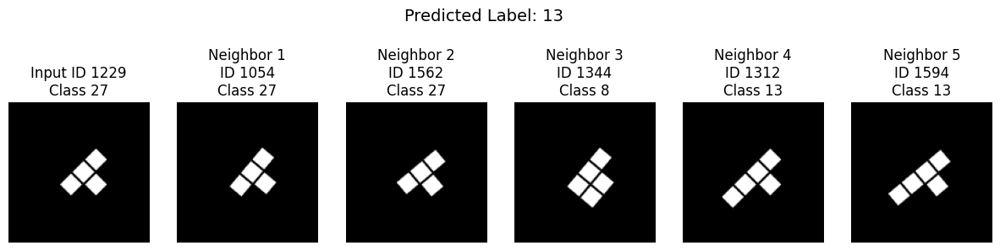

Test Sample 15:
  Image ID: 157
  True Label: 18
  Predicted Label: 18
  Neighbor IDs: [ 949  747  748 1068  360]
  Neighbor Labels: [18 18 18 17  2]
  Neighbor Distances: [0.0703631  0.07539117 0.20933735 0.29272306 0.30828393]


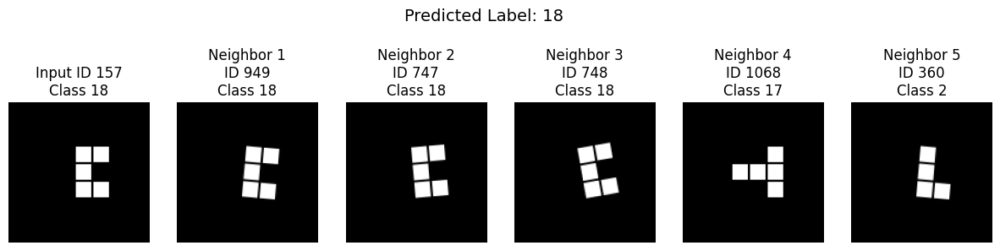

Test Sample 16:
  Image ID: 783
  True Label: 12
  Predicted Label: 12
  Neighbor IDs: [ 835 1316  399 1388   77]
  Neighbor Labels: [12 12 12 12 27]
  Neighbor Distances: [0.02218217 0.03407544 0.10209334 0.11956847 0.17295599]


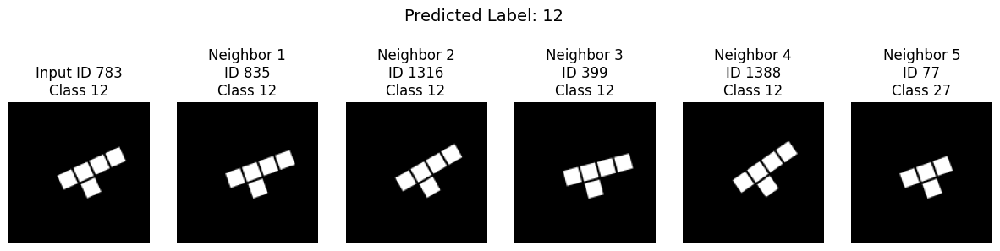

Test Sample 17:
  Image ID: 249
  True Label: 15
  Predicted Label: 15
  Neighbor IDs: [1323 1123  987 1446 1607]
  Neighbor Labels: [15 15 15 15 20]
  Neighbor Distances: [0.0218398  0.07392949 0.07882702 0.15216583 0.18715042]


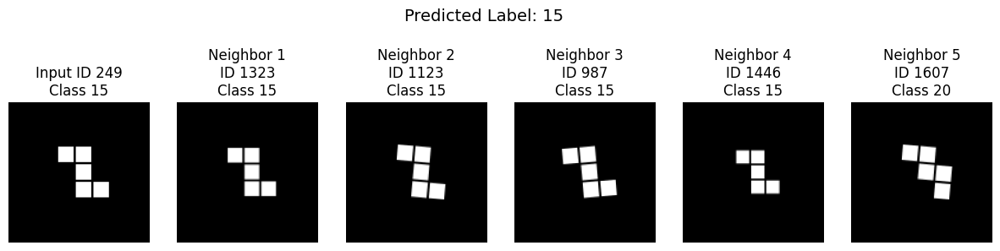

Test Sample 18:
  Image ID: 303
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [ 759  626 1420   40  270]
  Neighbor Labels: [ 5  5 10  5  5]
  Neighbor Distances: [0.0490433  0.0919615  0.12159204 0.12506676 0.14040768]


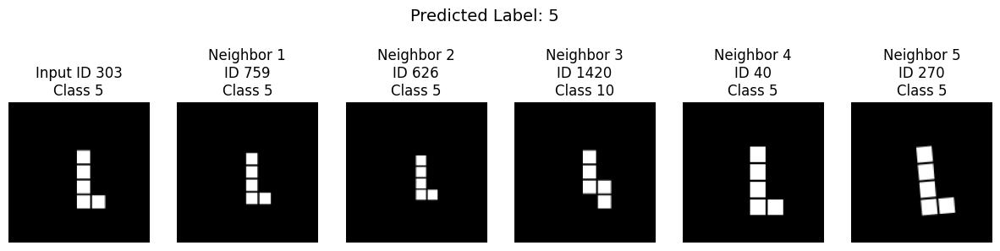

Test Sample 19:
  Image ID: 1878
  True Label: 22
  Predicted Label: 22
  Neighbor IDs: [ 106 1435  454 1429 1241]
  Neighbor Labels: [22 22 22 11 11]
  Neighbor Distances: [0.03935087 0.10837483 0.12432361 0.1475228  0.16558003]


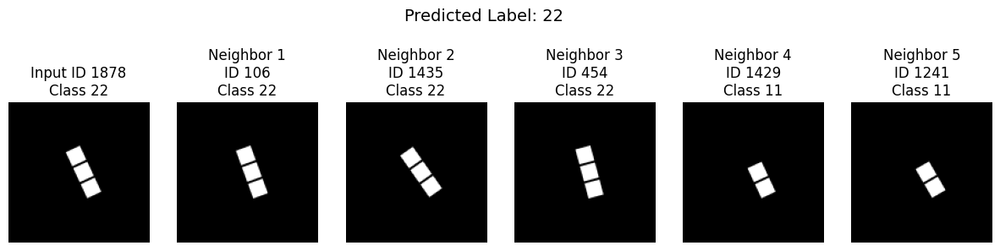

Test Sample 20:
  Image ID: 553
  True Label: 12
  Predicted Label: 12
  Neighbor IDs: [1219  802 1262 1054 1421]
  Neighbor Labels: [12 12 12 27 12]
  Neighbor Distances: [0.04086792 0.04367077 0.13484037 0.17933589 0.17950082]


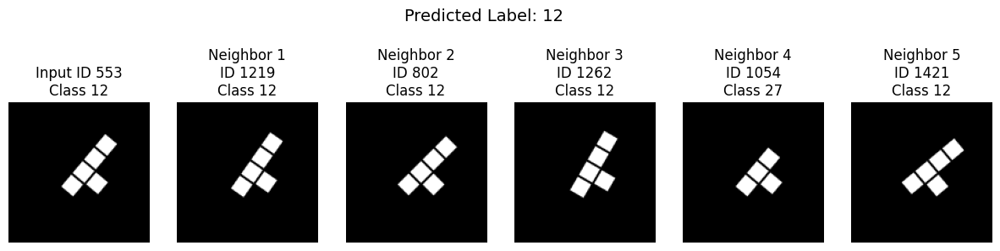

Test Sample 21:
  Image ID: 1134
  True Label: 18
  Predicted Label: 18
  Neighbor IDs: [1080  328 1711 1230 1819]
  Neighbor Labels: [18 18 18  2 18]
  Neighbor Distances: [0.03440094 0.07395446 0.15962237 0.22277832 0.23364568]


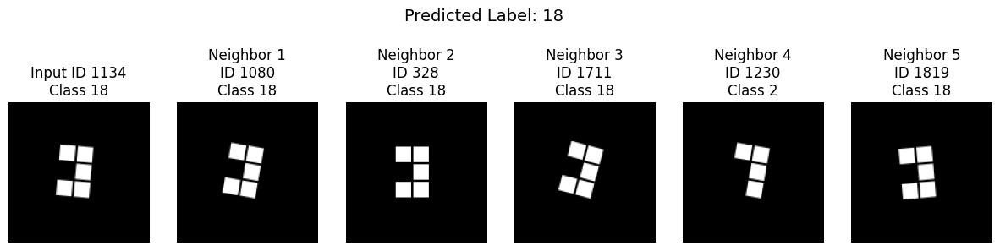

Test Sample 22:
  Image ID: 1010
  True Label: 13
  Predicted Label: 13
  Neighbor IDs: [ 379 1837  124  732  109]
  Neighbor Labels: [13 13 13 13 27]
  Neighbor Distances: [0.03403193 0.04184598 0.12740356 0.1494143  0.15714514]


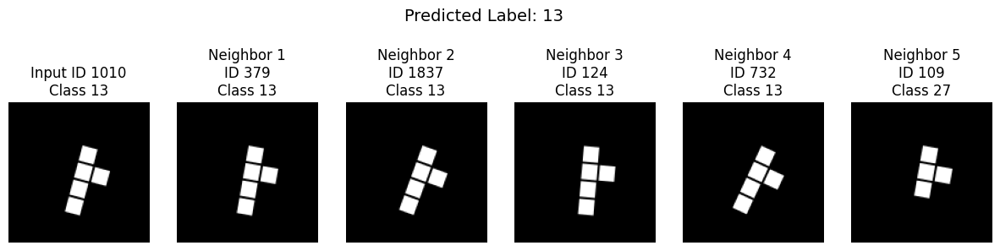

Test Sample 23:
  Image ID: 840
  True Label: 19
  Predicted Label: 19
  Neighbor IDs: [ 152  296  936 1512 1552]
  Neighbor Labels: [19 19 19 19  1]
  Neighbor Distances: [0.02524996 0.03098899 0.10223997 0.11111498 0.17355192]


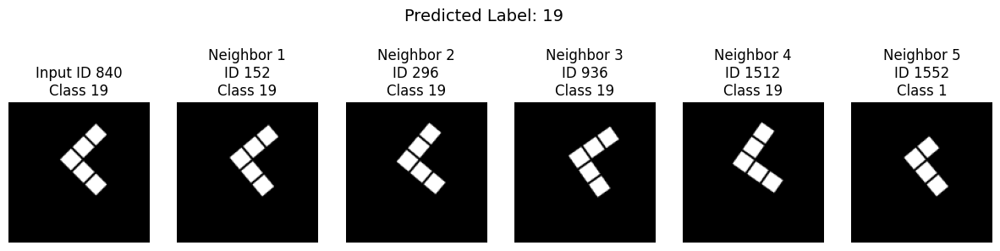

Test Sample 24:
  Image ID: 1374
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [ 629 1893 1693   96 1897]
  Neighbor Labels: [9 9 6 9 1]
  Neighbor Distances: [0.03023624 0.03029764 0.09785867 0.10154426 0.11710978]


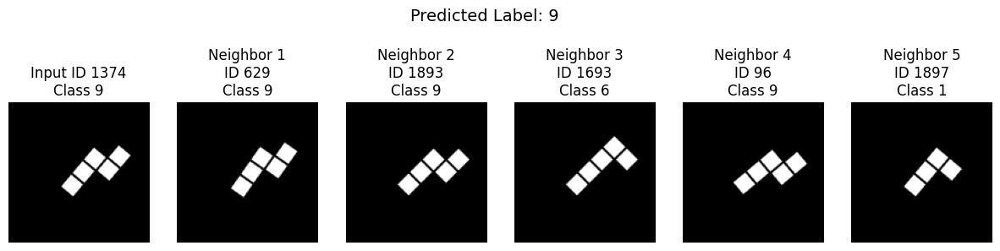

Test Sample 25:
  Image ID: 1859
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [ 857  126 1690 1796 1112]
  Neighbor Labels: [4 4 4 4 3]
  Neighbor Distances: [0.04714143 0.04779762 0.16061926 0.17793053 0.18354297]


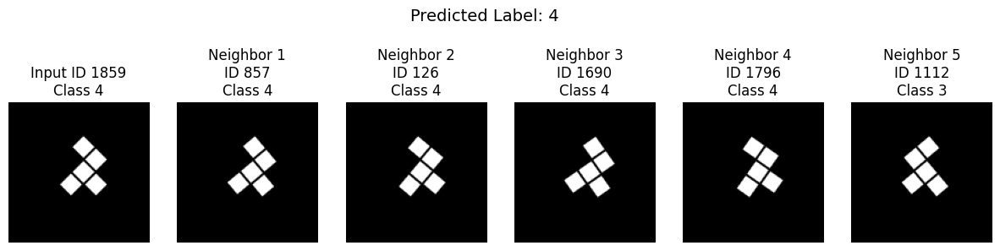

Test Sample 26:
  Image ID: 866
  True Label: 27
  Predicted Label: 13
  Neighbor IDs: [1732 1751   46  744  642]
  Neighbor Labels: [27 13 13  8 12]
  Neighbor Distances: [0.04746413 0.16155249 0.1664753  0.17097008 0.179551  ]


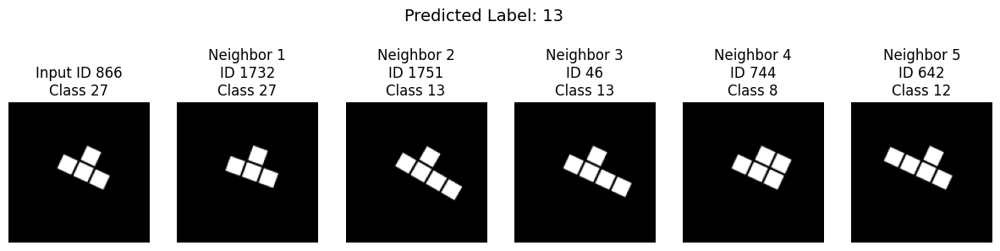

Test Sample 27:
  Image ID: 763
  True Label: 18
  Predicted Label: 18
  Neighbor IDs: [1664 1021  679 1448  880]
  Neighbor Labels: [18 18 18 18  1]
  Neighbor Distances: [0.0438658  0.04905069 0.15787208 0.16305494 0.2796502 ]


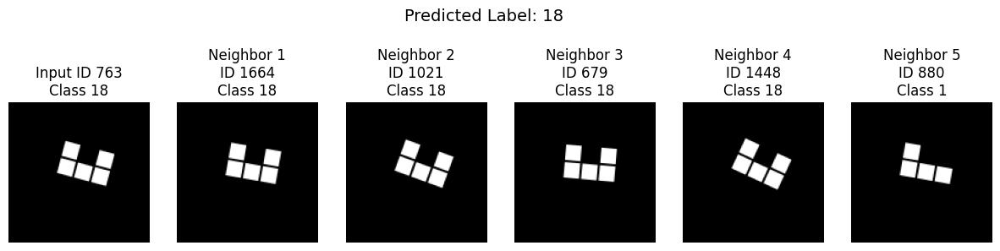

Test Sample 28:
  Image ID: 409
  True Label: 12
  Predicted Label: 12
  Neighbor IDs: [1161 1075  406  438 1376]
  Neighbor Labels: [12 12 12 12 27]
  Neighbor Distances: [0.03198385 0.03351939 0.1255225  0.14058536 0.16793025]


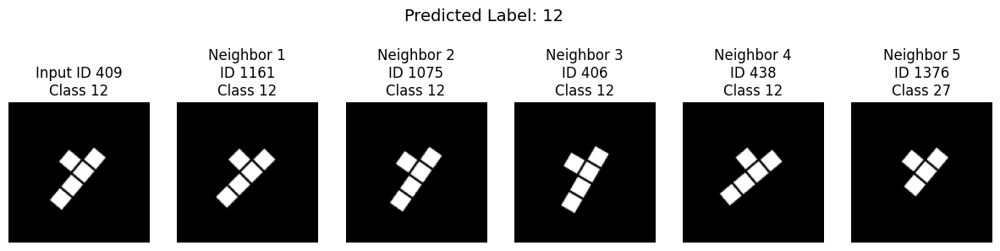

Test Sample 29:
  Image ID: 1706
  True Label: 15
  Predicted Label: 15
  Neighbor IDs: [1410 1125  987 1026 1880]
  Neighbor Labels: [15 15 15 15 20]
  Neighbor Distances: [0.04092956 0.04737383 0.16798091 0.18141627 0.24390656]


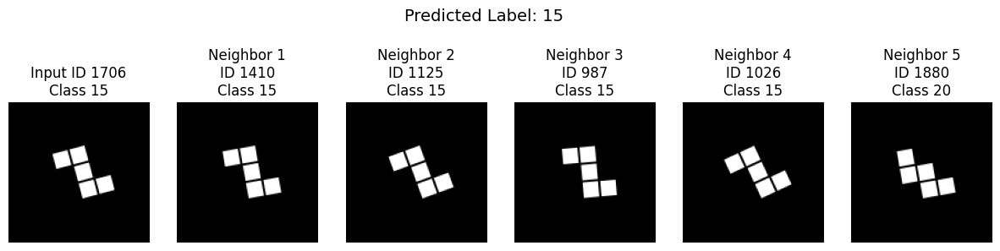

Test Sample 30:
  Image ID: 1059
  True Label: 13
  Predicted Label: 13
  Neighbor IDs: [ 500 1594    7 1312 1562]
  Neighbor Labels: [13 13 13 13 27]
  Neighbor Distances: [0.02921498 0.03635037 0.12546223 0.14206791 0.1611172 ]


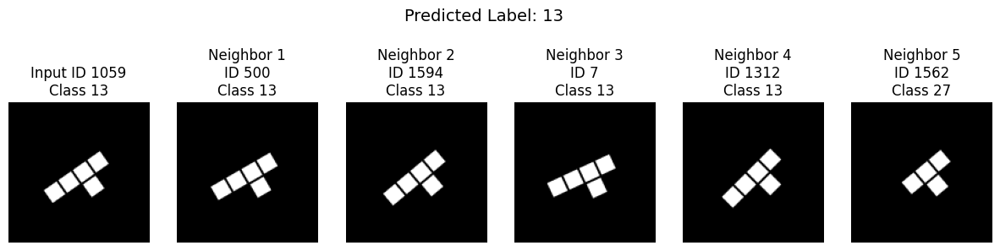

Test Sample 31:
  Image ID: 51
  True Label: 24
  Predicted Label: 24
  Neighbor IDs: [ 462  766   32 1872 1177]
  Neighbor Labels: [24 24 24 24 26]
  Neighbor Distances: [0.03092563 0.03500307 0.11021054 0.14951503 0.2063253 ]


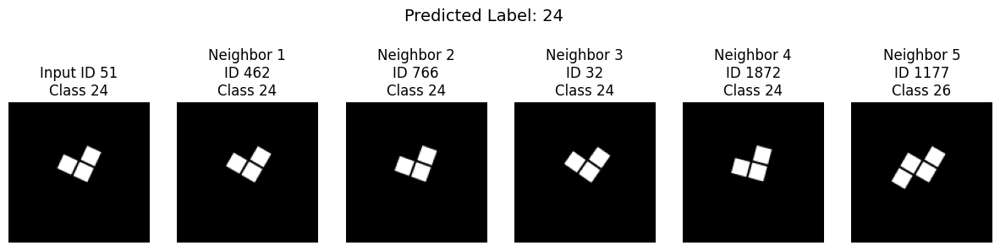

Test Sample 32:
  Image ID: 1509
  True Label: 3
  Predicted Label: 3
  Neighbor IDs: [ 280 1415 1505  198 1385]
  Neighbor Labels: [ 3  3  3 27  3]
  Neighbor Distances: [0.02916712 0.03349018 0.12142015 0.17609471 0.18117571]


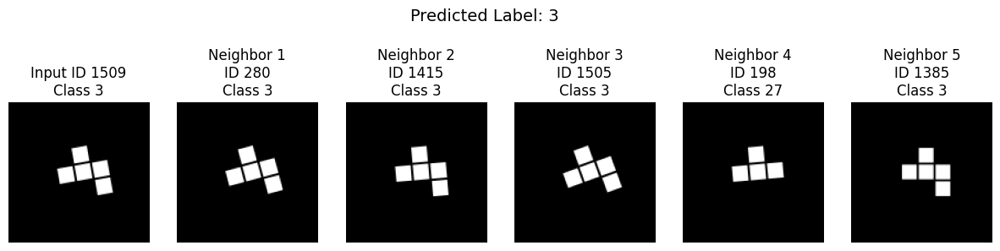

Test Sample 33:
  Image ID: 1087
  True Label: 7
  Predicted Label: 7
  Neighbor IDs: [209 114 606 614 683]
  Neighbor Labels: [ 7  7  7 19  7]
  Neighbor Distances: [0.03845108 0.04147589 0.15571642 0.18104583 0.2022748 ]


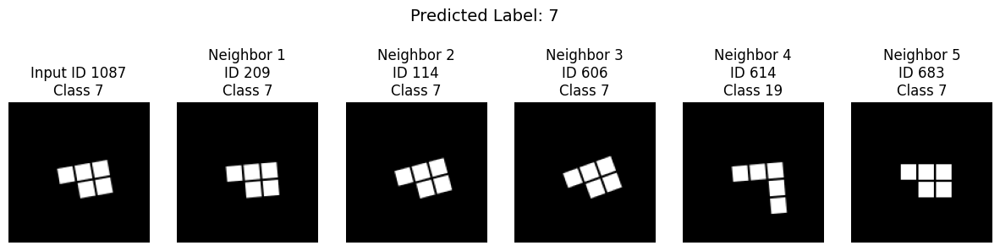

Test Sample 34:
  Image ID: 931
  True Label: 14
  Predicted Label: 14
  Neighbor IDs: [ 310 1761  378  476  697]
  Neighbor Labels: [14 14 20 20 14]
  Neighbor Distances: [0.04463416 0.1688956  0.1788907  0.18433994 0.2068727 ]


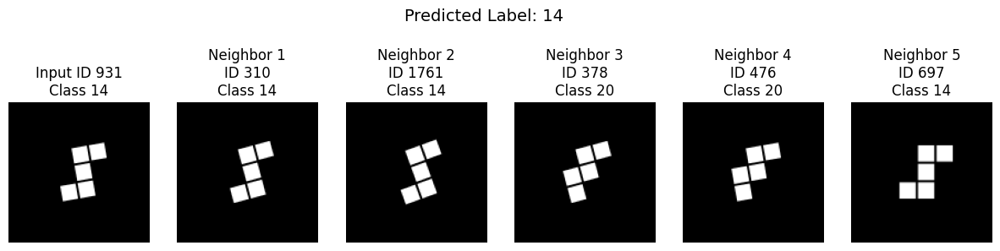

Test Sample 35:
  Image ID: 960
  True Label: 26
  Predicted Label: 26
  Neighbor IDs: [ 222 1727  197  976  422]
  Neighbor Labels: [26 26 26 20 26]
  Neighbor Distances: [0.03083748 0.11049223 0.12188947 0.18041432 0.19610697]


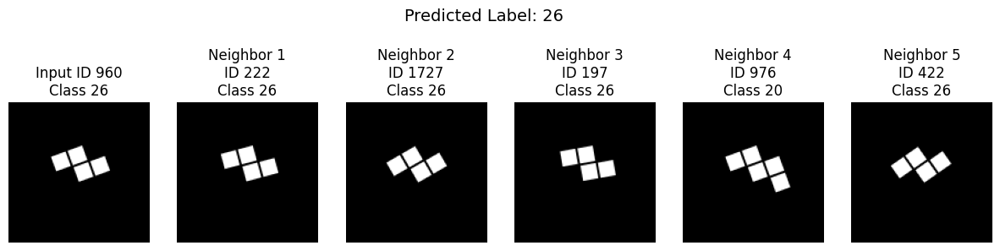

Test Sample 36:
  Image ID: 148
  True Label: 15
  Predicted Label: 20
  Neighbor IDs: [1333  797  575 1619 1273]
  Neighbor Labels: [15 15 20 20 20]
  Neighbor Distances: [0.04268551 0.12180722 0.14380205 0.15009522 0.15451151]


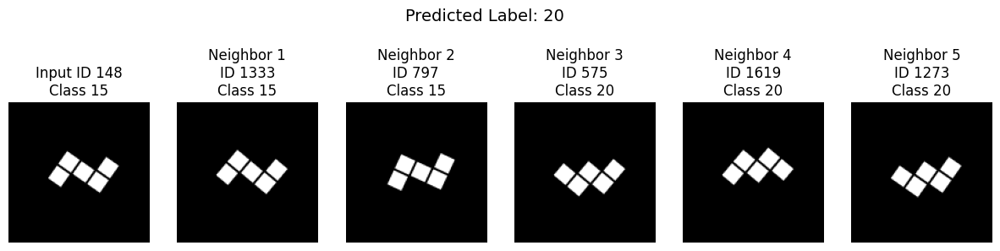

Test Sample 37:
  Image ID: 1212
  True Label: 10
  Predicted Label: 10
  Neighbor IDs: [1823  497 1363 1708 1301]
  Neighbor Labels: [10 10 10  2  2]
  Neighbor Distances: [0.02193785 0.03516102 0.09627831 0.1012032  0.11831355]


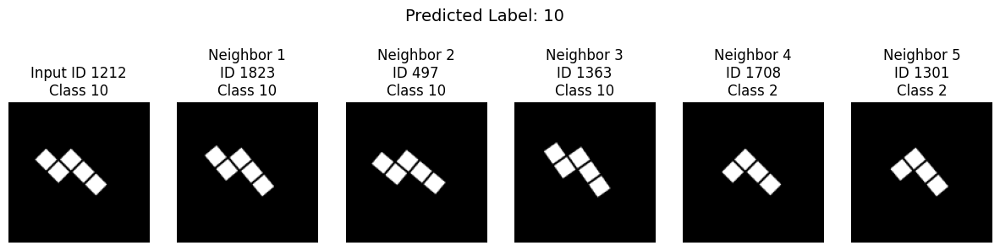

Test Sample 38:
  Image ID: 772
  True Label: 25
  Predicted Label: 25
  Neighbor IDs: [ 699  196  183 1160 1284]
  Neighbor Labels: [25 25 25 24 25]
  Neighbor Distances: [0.03427941 0.1496445  0.15247136 0.19346619 0.19768804]


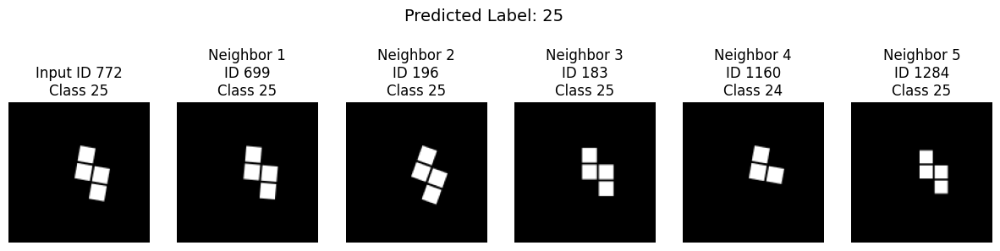

Test Sample 39:
  Image ID: 1033
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [ 453 1459  391 1302 1835]
  Neighbor Labels: [9 9 9 6 6]
  Neighbor Distances: [0.00769991 0.01950073 0.08832949 0.13835955 0.15174764]


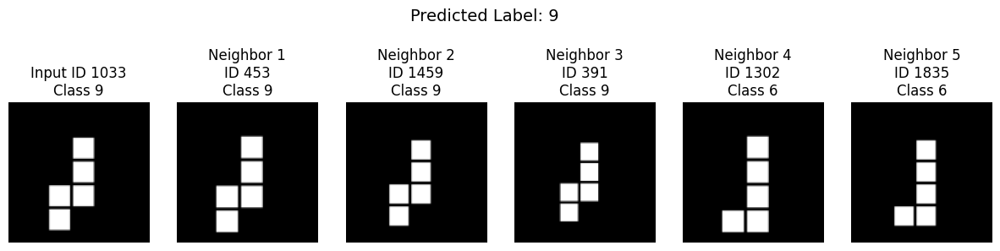

Test Sample 40:
  Image ID: 654
  True Label: 2
  Predicted Label: 2
  Neighbor IDs: [1034  834  456 1770 1597]
  Neighbor Labels: [ 2  2  2 10 10]
  Neighbor Distances: [0.02561283 0.04050648 0.0990746  0.14567864 0.14778054]


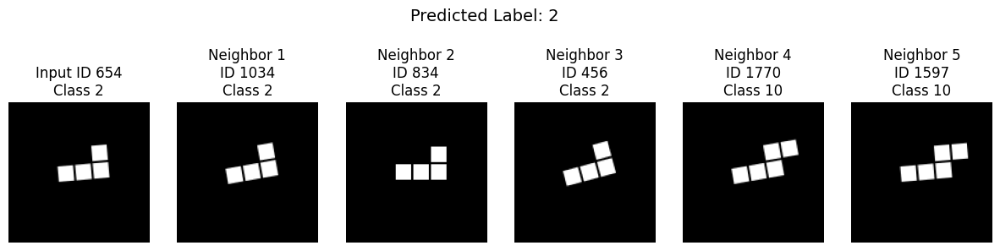

Test Sample 41:
  Image ID: 861
  True Label: 26
  Predicted Label: 26
  Neighbor IDs: [ 640  751 1866 1707  221]
  Neighbor Labels: [26 26 26 26 20]
  Neighbor Distances: [0.01807785 0.06758755 0.08280665 0.13851249 0.15790534]


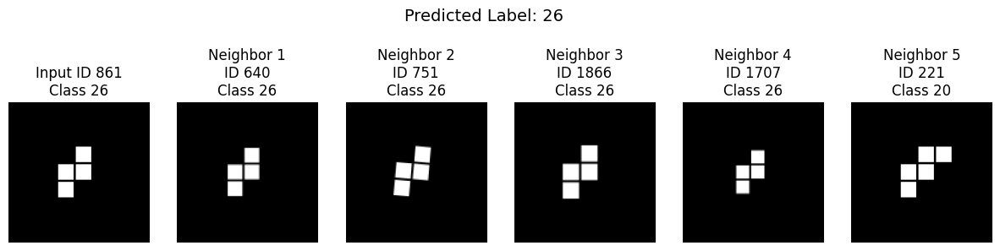

Test Sample 42:
  Image ID: 952
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [ 435 1832  448  733 1822]
  Neighbor Labels: [ 5  5  5  5 10]
  Neighbor Distances: [0.01985556 0.02269095 0.0785802  0.08597982 0.10981125]


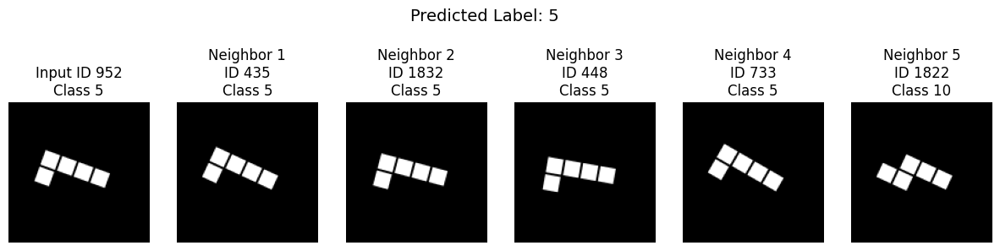

Test Sample 43:
  Image ID: 1298
  True Label: 13
  Predicted Label: 13
  Neighbor IDs: [ 746 1845 1780  638  563]
  Neighbor Labels: [13 13 13 27 27]
  Neighbor Distances: [0.0303359  0.1322928  0.15284002 0.17740011 0.18127024]


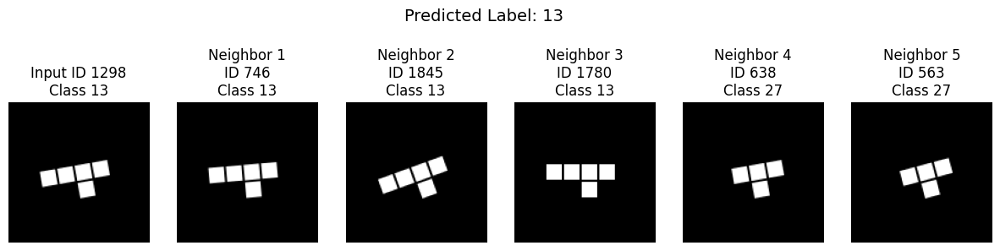

Test Sample 44:
  Image ID: 402
  True Label: 12
  Predicted Label: 12
  Neighbor IDs: [1102  855  138 1444 1048]
  Neighbor Labels: [12 12 12 27 27]
  Neighbor Distances: [0.0319981  0.03379267 0.11540699 0.16266173 0.16432261]


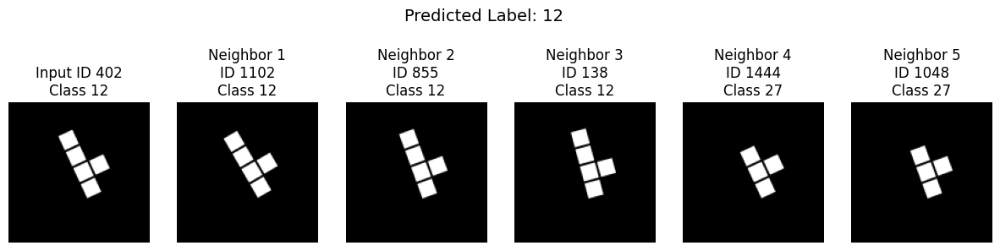

Test Sample 45:
  Image ID: 1547
  True Label: 10
  Predicted Label: 10
  Neighbor IDs: [ 801 1882 1111 1395  468]
  Neighbor Labels: [10 10 10  5 10]
  Neighbor Distances: [0.03175998 0.03244227 0.12127811 0.13403964 0.13456678]


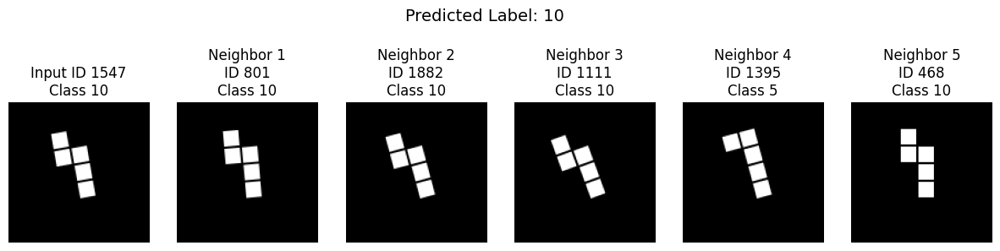

Test Sample 46:
  Image ID: 1804
  True Label: 6
  Predicted Label: 6
  Neighbor IDs: [1861 1065  289  813 1090]
  Neighbor Labels: [6 6 6 9 9]
  Neighbor Distances: [0.02432752 0.08330047 0.09696782 0.11536729 0.11974037]


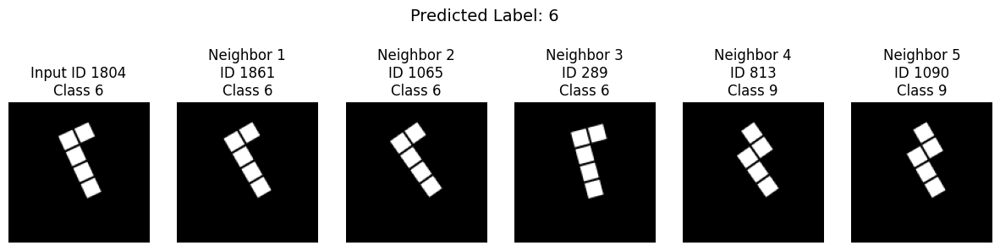

Test Sample 47:
  Image ID: 1792
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [1379  555  141  393  339]
  Neighbor Labels: [5 5 5 6 6]
  Neighbor Distances: [0.02865613 0.08468664 0.09385562 0.15079564 0.15450996]


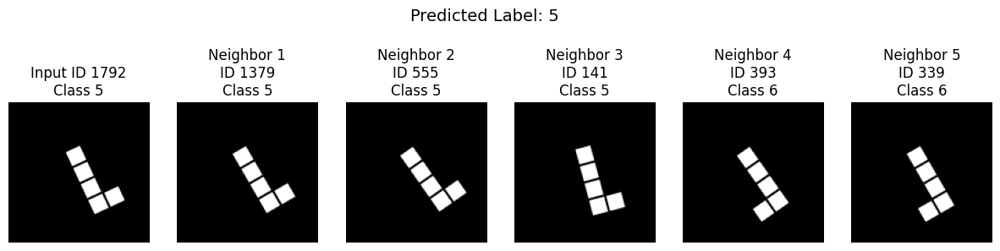

Test Sample 48:
  Image ID: 1569
  True Label: 14
  Predicted Label: 14
  Neighbor IDs: [1757  697  615  310  476]
  Neighbor Labels: [14 14 14 14 20]
  Neighbor Distances: [0.08595794 0.10563892 0.11904556 0.15456104 0.16663587]


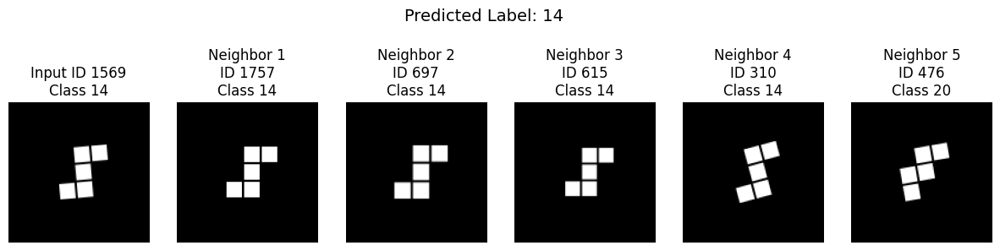

Test Sample 49:
  Image ID: 1179
  True Label: 21
  Predicted Label: 21
  Neighbor IDs: [ 547  472  667  248 1543]
  Neighbor Labels: [21 21 21  3 21]
  Neighbor Distances: [0.076859   0.08001572 0.24981594 0.26218963 0.26376182]


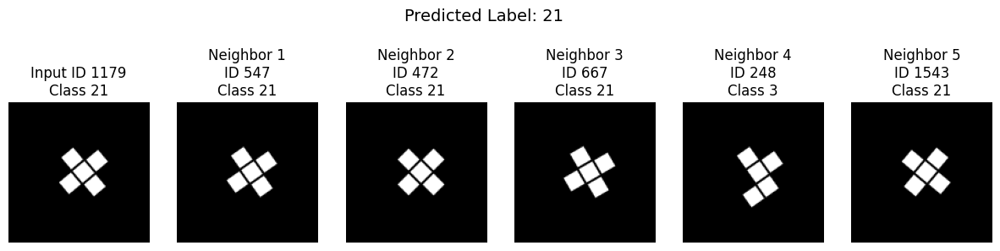

Test Sample 50:
  Image ID: 13
  True Label: 17
  Predicted Label: 17
  Neighbor IDs: [ 864 1003  386  912 1829]
  Neighbor Labels: [17 17 17  2  1]
  Neighbor Distances: [0.03768361 0.04058737 0.14725047 0.17063737 0.18583393]


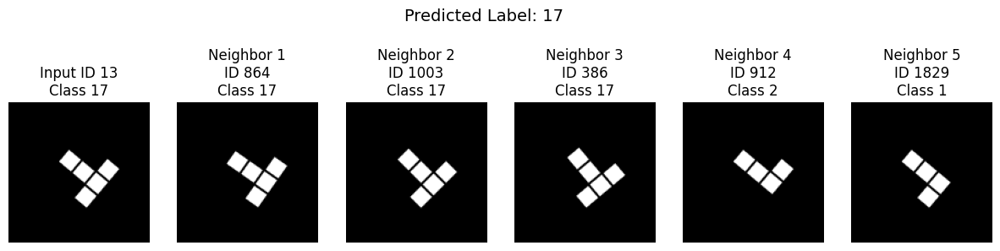

Test Sample 51:
  Image ID: 86
  True Label: 20
  Predicted Label: 14
  Neighbor IDs: [1880  577 1310  419 1062]
  Neighbor Labels: [20 20 14 14 25]
  Neighbor Distances: [0.03432727 0.06338775 0.21482825 0.21510541 0.224096  ]


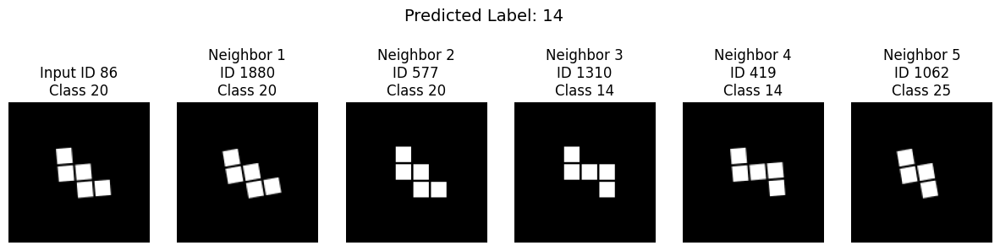

Test Sample 52:
  Image ID: 121
  True Label: 0
  Predicted Label: 0
  Neighbor IDs: [ 765 1167  882  847 1852]
  Neighbor Labels: [0 0 0 0 0]
  Neighbor Distances: [0.00280732 0.0044995  0.01151431 0.01849067 0.0187248 ]


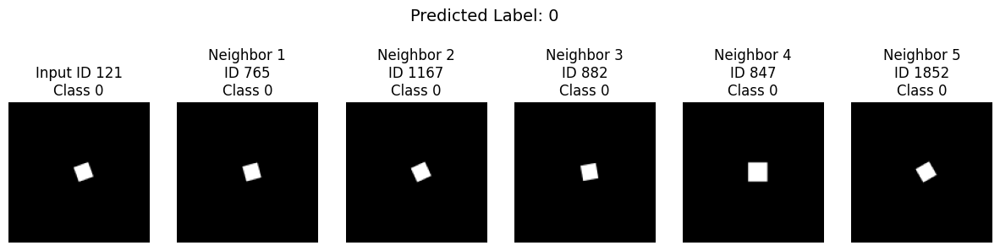

Test Sample 53:
  Image ID: 1066
  True Label: 27
  Predicted Label: 27
  Neighbor IDs: [1376  566  122  169 1217]
  Neighbor Labels: [27 27 27 13 13]
  Neighbor Distances: [0.04147875 0.04661584 0.15536225 0.16012758 0.16544741]


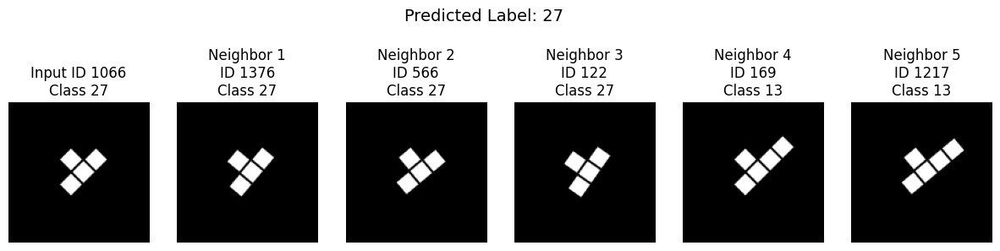

Test Sample 54:
  Image ID: 102
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [1198 1146  388 1815 1072]
  Neighbor Labels: [ 4  4 26 27  4]
  Neighbor Distances: [0.00352889 0.03934687 0.12690675 0.14814317 0.16247255]


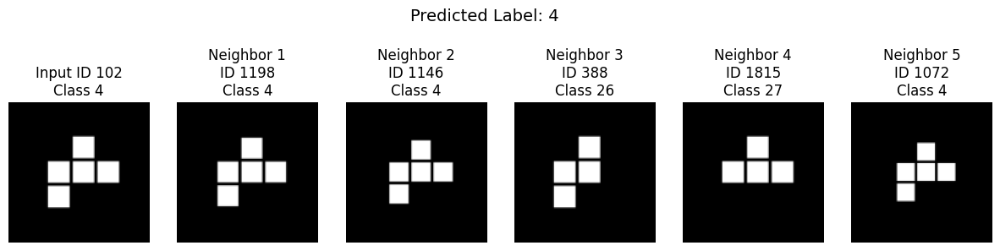

Test Sample 55:
  Image ID: 1763
  True Label: 20
  Predicted Label: 20
  Neighbor IDs: [ 817  976 1221 1490 1671]
  Neighbor Labels: [20 20 20 20 15]
  Neighbor Distances: [0.03018939 0.03281379 0.0922519  0.11773252 0.16450751]


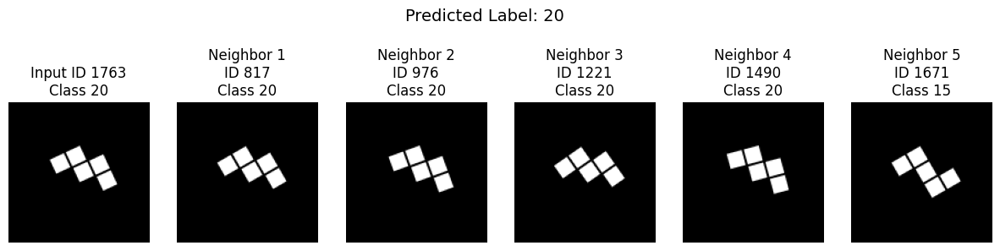

Test Sample 56:
  Image ID: 416
  True Label: 17
  Predicted Label: 17
  Neighbor IDs: [1497 1271  852 1528  179]
  Neighbor Labels: [17 17 17  2 17]
  Neighbor Distances: [0.05105555 0.05266404 0.17215645 0.17236465 0.17803425]


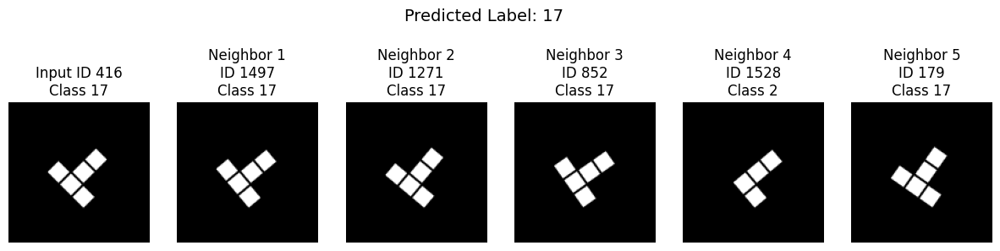

Test Sample 57:
  Image ID: 486
  True Label: 18
  Predicted Label: 18
  Neighbor IDs: [1876 1821  305   97  426]
  Neighbor Labels: [18 18 18 10  9]
  Neighbor Distances: [0.0373174  0.06567574 0.16926724 0.24510932 0.2492038 ]


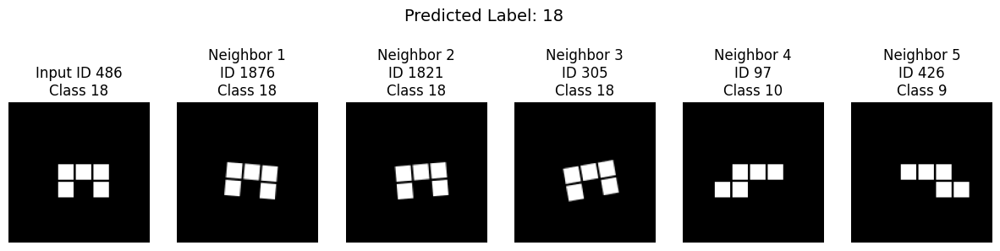

Test Sample 58:
  Image ID: 1529
  True Label: 3
  Predicted Label: 3
  Neighbor IDs: [1692  507  924 1813 1311]
  Neighbor Labels: [3 3 3 4 3]
  Neighbor Distances: [0.04340261 0.04495096 0.14553094 0.15132141 0.15439296]


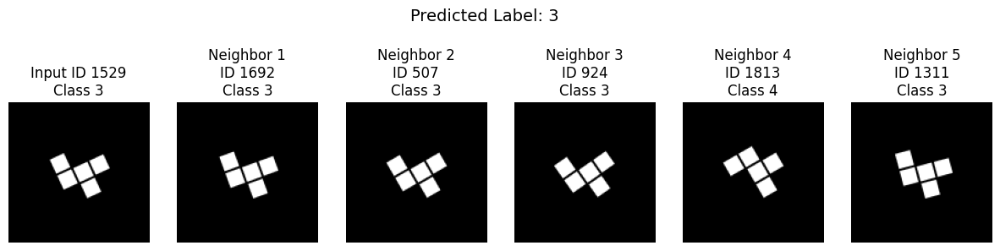

Test Sample 59:
  Image ID: 1522
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [ 387  535 1150 1561 1056]
  Neighbor Labels: [9 9 9 6 6]
  Neighbor Distances: [0.02770305 0.08626962 0.1250794  0.1280551  0.1324749 ]


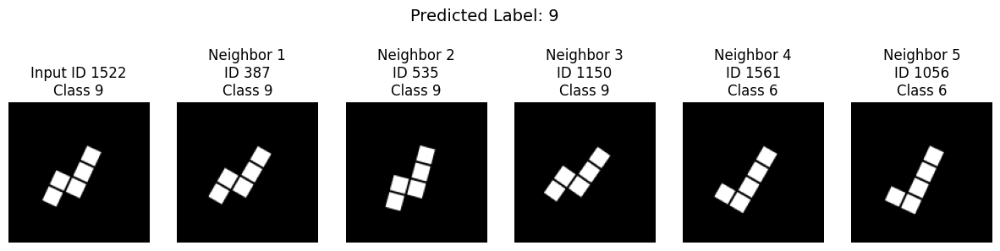

Test Sample 60:
  Image ID: 394
  True Label: 7
  Predicted Label: 7
  Neighbor IDs: [ 591 1462  447 1151  962]
  Neighbor Labels: [7 7 7 7 9]
  Neighbor Distances: [0.03522933 0.03618783 0.1435914  0.14973807 0.23476946]


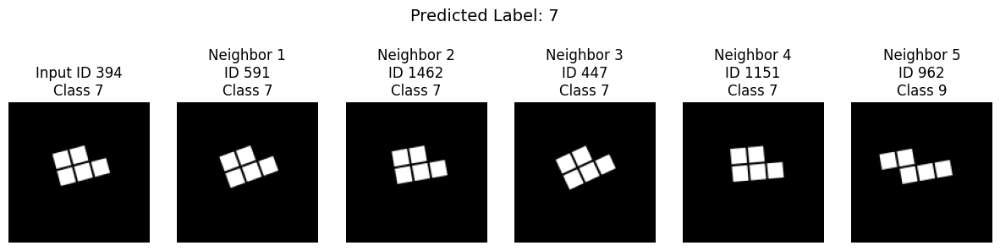

Test Sample 61:
  Image ID: 872
  True Label: 22
  Predicted Label: 22
  Neighbor IDs: [799 450 143 369 451]
  Neighbor Labels: [22 22 22 11 11]
  Neighbor Distances: [0.0255236  0.04903644 0.14629382 0.17998433 0.18114299]


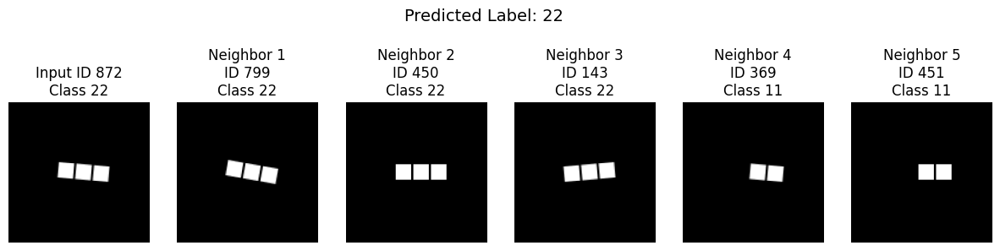

Test Sample 62:
  Image ID: 570
  True Label: 10
  Predicted Label: 10
  Neighbor IDs: [1443 1831  599  604 1127]
  Neighbor Labels: [10 10 10 10  2]
  Neighbor Distances: [0.02264678 0.03104758 0.0443604  0.10381842 0.14882219]


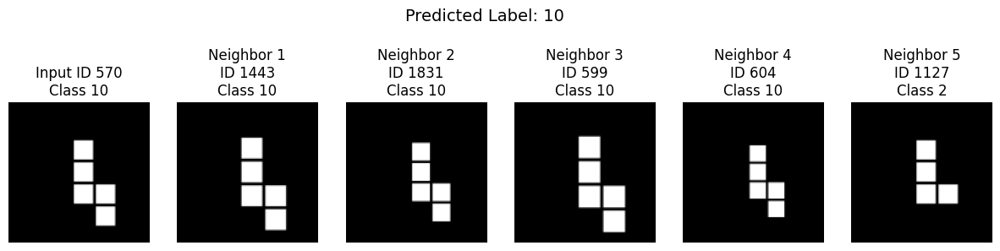

Test Sample 63:
  Image ID: 815
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [408 383 922 646 560]
  Neighbor Labels: [ 5  5  5 10  5]
  Neighbor Distances: [0.0202207  0.02262217 0.08269292 0.08505201 0.09978032]


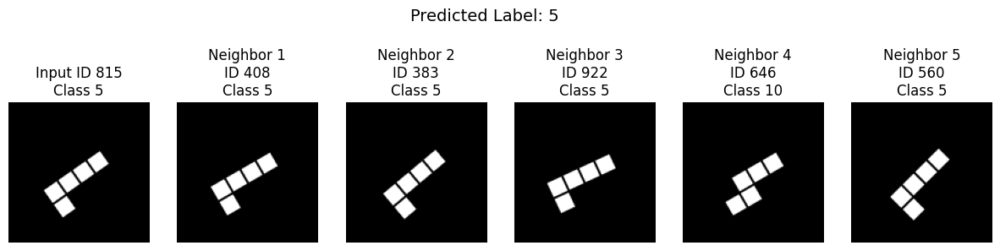

Test Sample 64:
  Image ID: 1566
  True Label: 3
  Predicted Label: 3
  Neighbor IDs: [1337  668  433 1138  617]
  Neighbor Labels: [3 3 4 3 4]
  Neighbor Distances: [0.03533596 0.15059698 0.1579271  0.18761396 0.20681566]


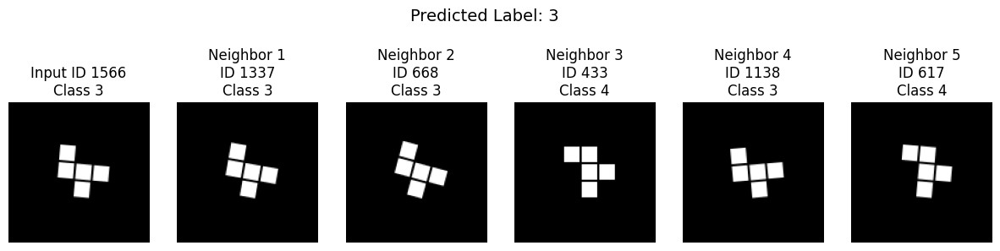

Test Sample 65:
  Image ID: 854
  True Label: 0
  Predicted Label: 0
  Neighbor IDs: [1818 1246  941 1564  856]
  Neighbor Labels: [0 0 0 0 0]
  Neighbor Distances: [0.00309861 0.0031842  0.01043141 0.01205903 0.01967418]


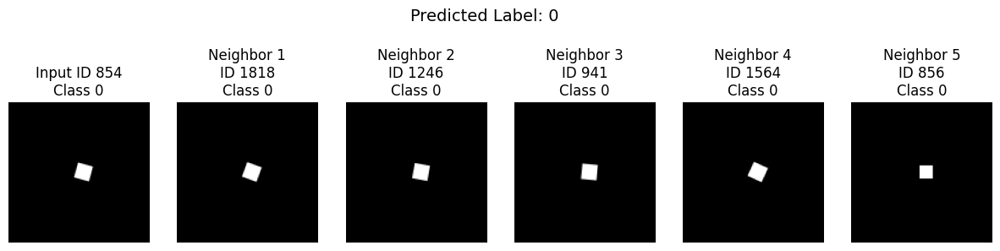

Test Sample 66:
  Image ID: 1288
  True Label: 29
  Predicted Label: 29
  Neighbor IDs: [1788 1639  444 1018  829]
  Neighbor Labels: [29 29  6  6 29]
  Neighbor Distances: [0.04109597 0.11183846 0.11465847 0.1231128  0.13819873]


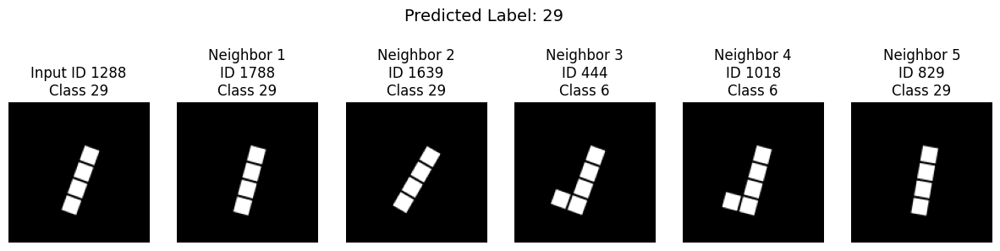

Test Sample 67:
  Image ID: 1157
  True Label: 2
  Predicted Label: 2
  Neighbor IDs: [111  12 360 841 160]
  Neighbor Labels: [ 2  2  2  2 10]
  Neighbor Distances: [0.02080494 0.06966203 0.07967931 0.12153351 0.13978088]


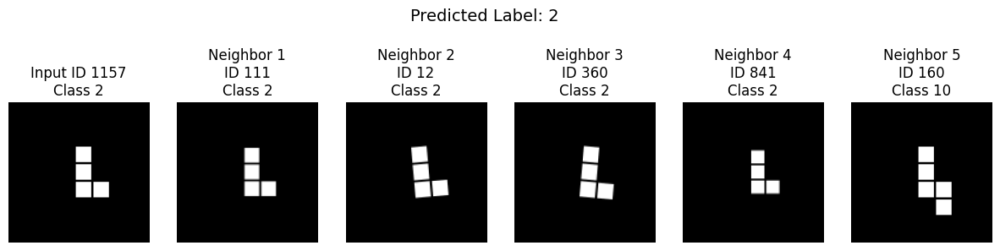

Test Sample 68:
  Image ID: 155
  True Label: 13
  Predicted Label: 13
  Neighbor IDs: [ 501 1215  492 1064 1586]
  Neighbor Labels: [13 13 27 27 13]
  Neighbor Distances: [0.03023505 0.11481464 0.18218064 0.20641136 0.25490028]


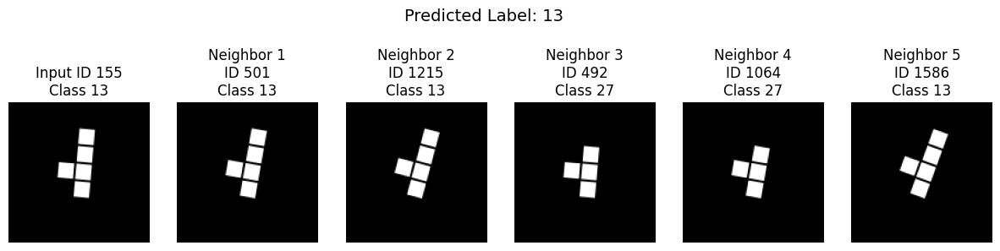

Test Sample 69:
  Image ID: 578
  True Label: 2
  Predicted Label: 2
  Neighbor IDs: [ 213 1398  794 1778  740]
  Neighbor Labels: [ 2  2 10 10  2]
  Neighbor Distances: [0.03239137 0.05338931 0.10137033 0.12312096 0.12540317]


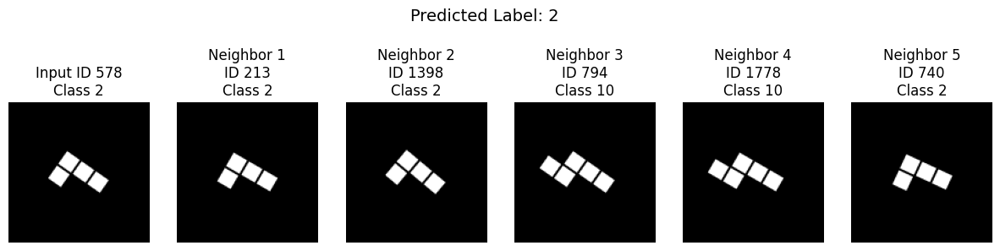

Test Sample 70:
  Image ID: 60
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [1144    2 1807  607  925]
  Neighbor Labels: [ 5  5  5  5 10]
  Neighbor Distances: [0.01872867 0.02631217 0.0956766  0.09935319 0.12346762]


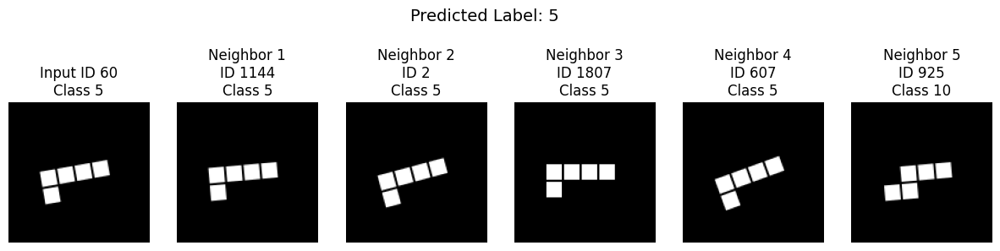

Test Sample 71:
  Image ID: 279
  True Label: 11
  Predicted Label: 11
  Neighbor IDs: [1855   55  904   38 1802]
  Neighbor Labels: [11 11 22 22 24]
  Neighbor Distances: [0.0110786  0.03285092 0.04868233 0.05614686 0.08204514]


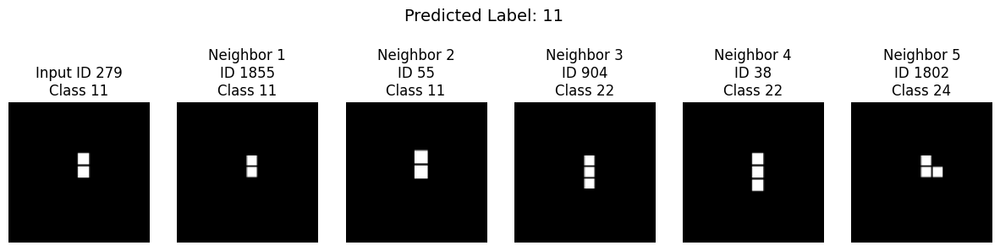

Test Sample 72:
  Image ID: 1841
  True Label: 15
  Predicted Label: 15
  Neighbor IDs: [ 797  348 1333 1273  108]
  Neighbor Labels: [15 15 15 20 20]
  Neighbor Distances: [0.03260344 0.1348455  0.13817322 0.1498003  0.1665008 ]


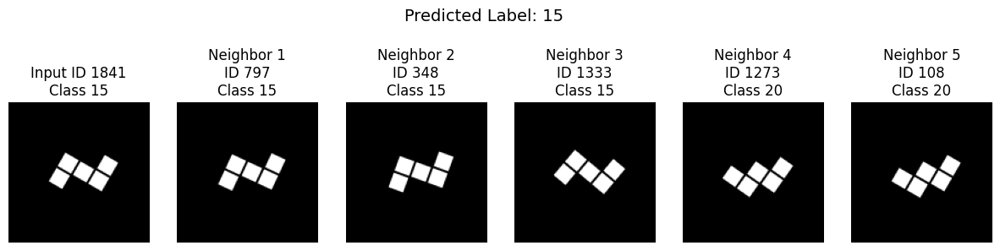

Test Sample 73:
  Image ID: 105
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [1014 1817  616 1609 1385]
  Neighbor Labels: [4 4 4 3 3]
  Neighbor Distances: [0.04284406 0.08898544 0.15552843 0.18396956 0.20206475]


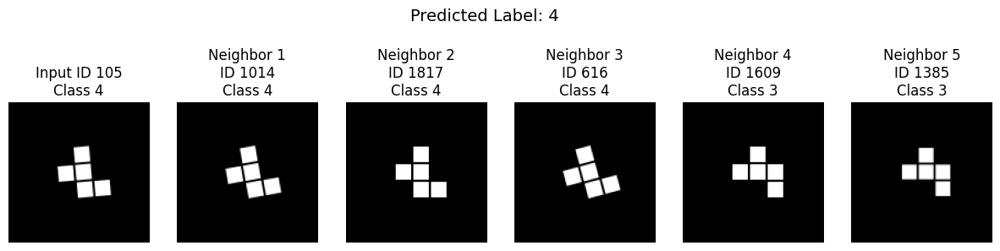

Test Sample 74:
  Image ID: 1895
  True Label: 18
  Predicted Label: 18
  Neighbor IDs: [889 983  90 823 978]
  Neighbor Labels: [18 18 18 18  2]
  Neighbor Distances: [0.02593613 0.03531718 0.12722182 0.13397837 0.19876564]


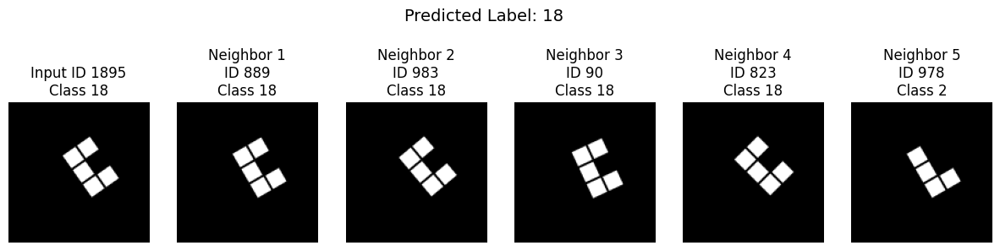

Test Sample 75:
  Image ID: 1218
  True Label: 22
  Predicted Label: 22
  Neighbor IDs: [ 250  589 1338  893 1204]
  Neighbor Labels: [22 22 22 22 11]
  Neighbor Distances: [0.03259128 0.04487026 0.12092698 0.13727069 0.17360353]


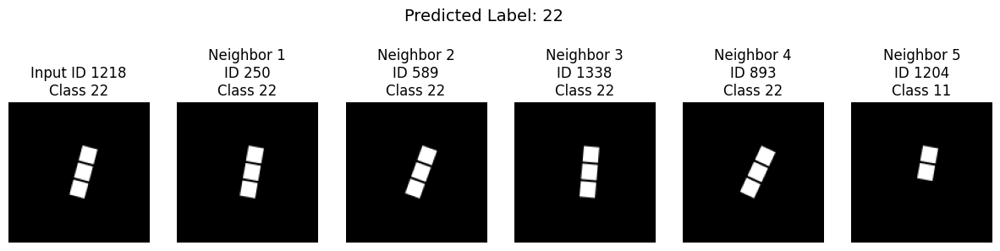

Test Sample 76:
  Image ID: 728
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [1464 1071  113 1668  892]
  Neighbor Labels: [4 4 4 3 3]
  Neighbor Distances: [0.0350101  0.06831688 0.09142828 0.13217247 0.15328014]


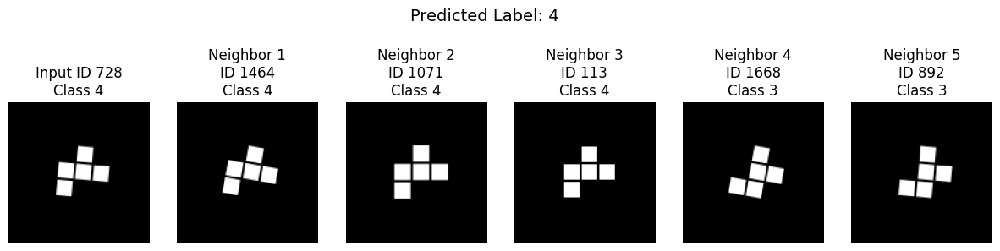

Test Sample 77:
  Image ID: 313
  True Label: 19
  Predicted Label: 19
  Neighbor IDs: [1891 1350 1032  877  404]
  Neighbor Labels: [19 19 19 19  1]
  Neighbor Distances: [0.02256507 0.03051627 0.10329998 0.10904348 0.16079593]


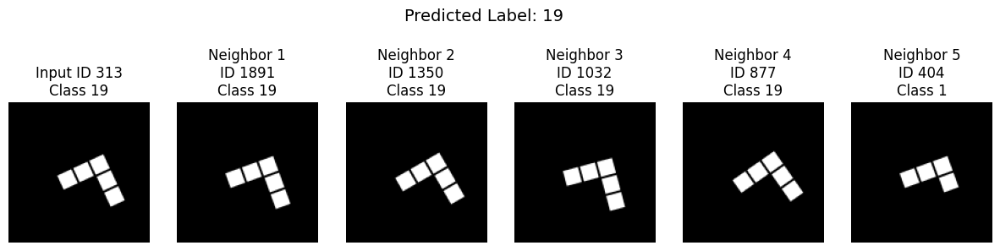

Test Sample 78:
  Image ID: 130
  True Label: 22
  Predicted Label: 22
  Neighbor IDs: [ 804  346  365 1325 1582]
  Neighbor Labels: [22 22 22 22 11]
  Neighbor Distances: [0.02596486 0.0345782  0.11677098 0.13861406 0.1615442 ]


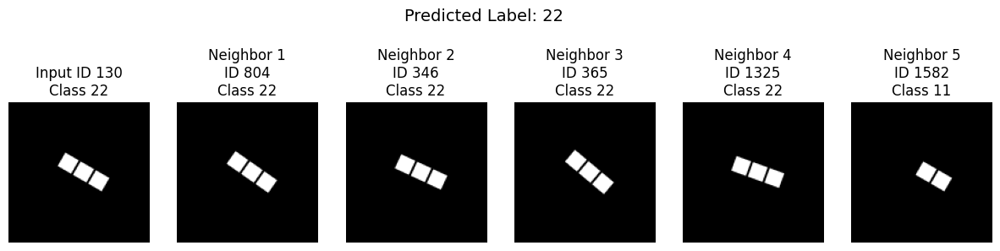

Test Sample 79:
  Image ID: 5
  True Label: 26
  Predicted Label: 26
  Neighbor IDs: [1883  927  751 1131  554]
  Neighbor Labels: [26 26 26 26  7]
  Neighbor Distances: [0.04288703 0.04916346 0.13270742 0.15586221 0.20715821]


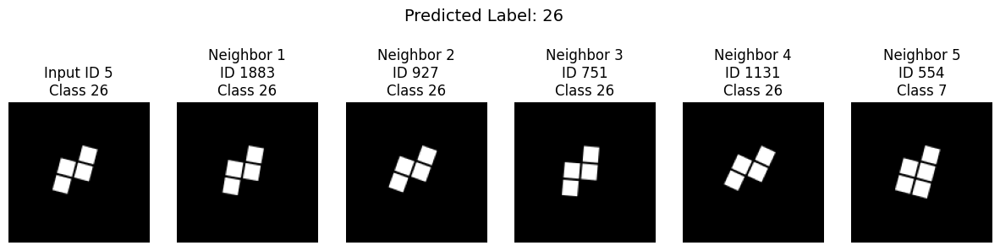

Test Sample 80:
  Image ID: 494
  True Label: 13
  Predicted Label: 27
  Neighbor IDs: [1287 1384  793 1467  449]
  Neighbor Labels: [13 13 27 27 27]
  Neighbor Distances: [0.03477168 0.12022984 0.19172525 0.1979636  0.25021762]


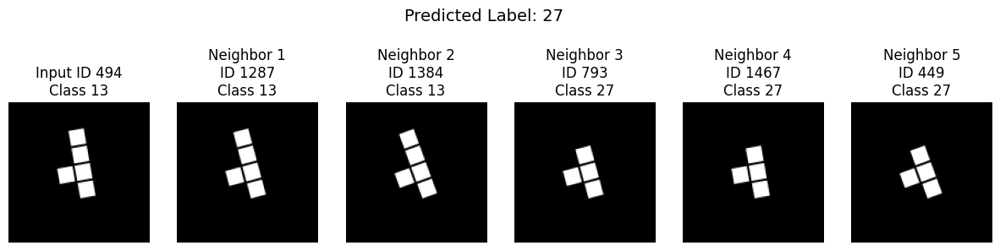

Test Sample 81:
  Image ID: 1372
  True Label: 8
  Predicted Label: 8
  Neighbor IDs: [   3 1282 1205 1550 1611]
  Neighbor Labels: [ 8  8  8 27 25]
  Neighbor Distances: [0.02866673 0.03138506 0.12977123 0.1320622  0.1547597 ]


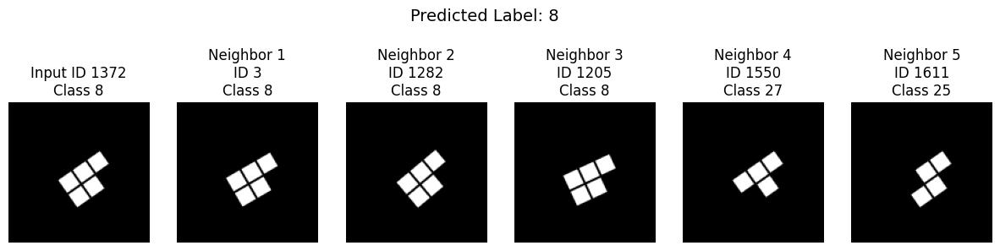

Test Sample 82:
  Image ID: 1265
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [ 265 1731 1820  598 1182]
  Neighbor Labels: [5 5 5 6 6]
  Neighbor Distances: [0.02687812 0.09354055 0.09848148 0.11192912 0.11560708]


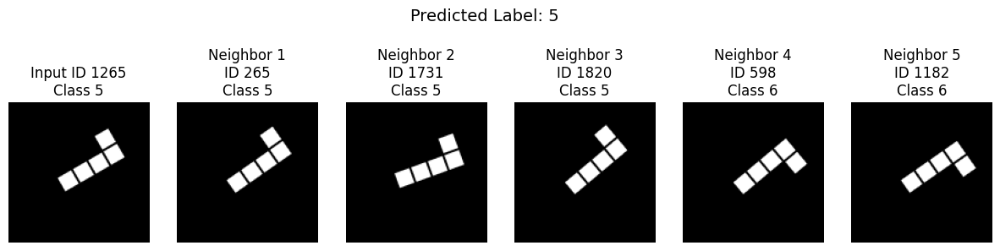

Test Sample 83:
  Image ID: 814
  True Label: 13
  Predicted Label: 13
  Neighbor IDs: [ 103  167 1660  434 1269]
  Neighbor Labels: [13 13 13 13 27]
  Neighbor Distances: [0.02982032 0.04726624 0.10889441 0.16366309 0.19462061]


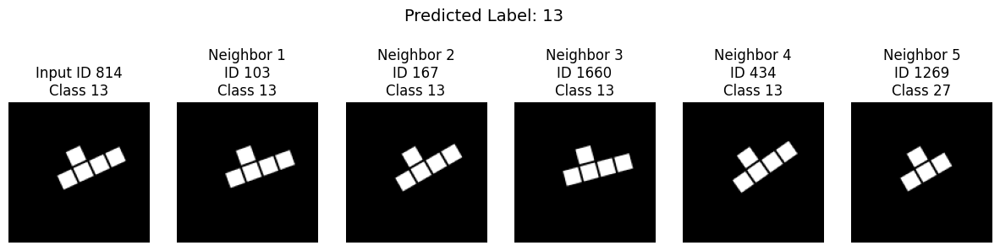

Test Sample 84:
  Image ID: 253
  True Label: 25
  Predicted Label: 25
  Neighbor IDs: [ 196  699 1811 1576 1077]
  Neighbor Labels: [25 25 24  8 10]
  Neighbor Distances: [0.04242539 0.13623792 0.18807632 0.2129904  0.22786504]


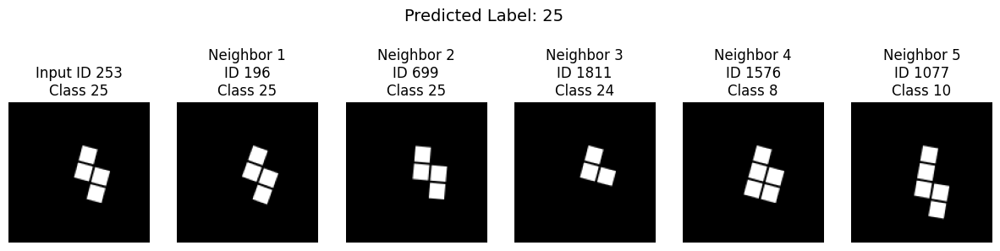

Test Sample 85:
  Image ID: 1608
  True Label: 15
  Predicted Label: 15
  Neighbor IDs: [ 844  334  181 1106 1657]
  Neighbor Labels: [15 15 15 20 20]
  Neighbor Distances: [0.03755474 0.04927236 0.13798654 0.15379971 0.17106026]


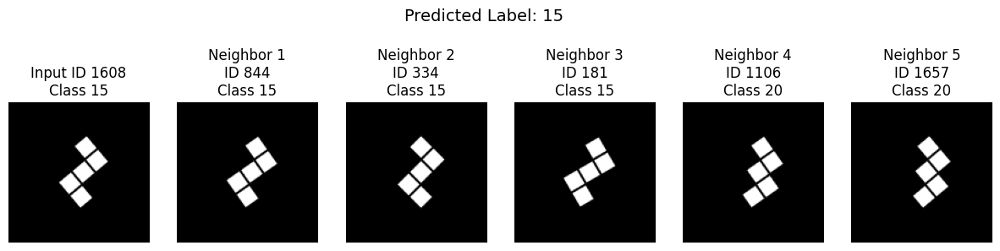

Test Sample 86:
  Image ID: 1304
  True Label: 22
  Predicted Label: 22
  Neighbor IDs: [1435  702  106 1241 1578]
  Neighbor Labels: [22 22 22 11 11]
  Neighbor Distances: [0.02208507 0.08749288 0.14150405 0.1438533  0.15373057]


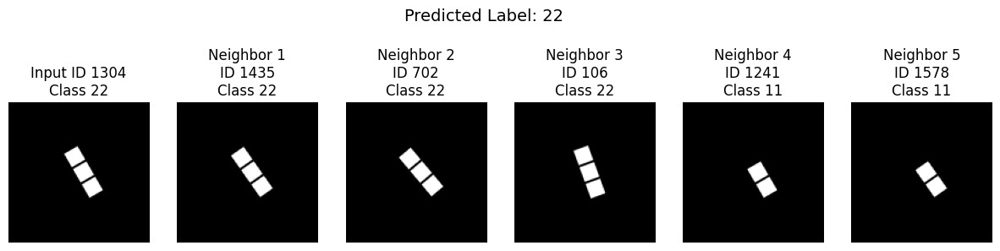

Test Sample 87:
  Image ID: 696
  True Label: 20
  Predicted Label: 20
  Neighbor IDs: [ 302 1555 1106  214 1006]
  Neighbor Labels: [20 20 20 20 26]
  Neighbor Distances: [0.04459512 0.04586738 0.12939256 0.15878958 0.16126871]


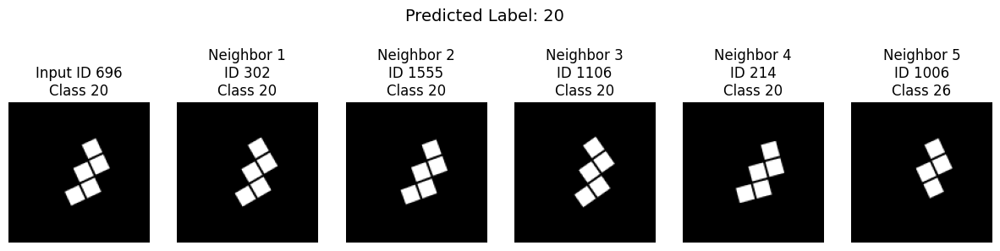

Test Sample 88:
  Image ID: 171
  True Label: 8
  Predicted Label: 8
  Neighbor IDs: [ 442  107  996 1269  761]
  Neighbor Labels: [ 8  8  8 27  2]
  Neighbor Distances: [0.03179258 0.05039048 0.1262502  0.15571094 0.17985398]


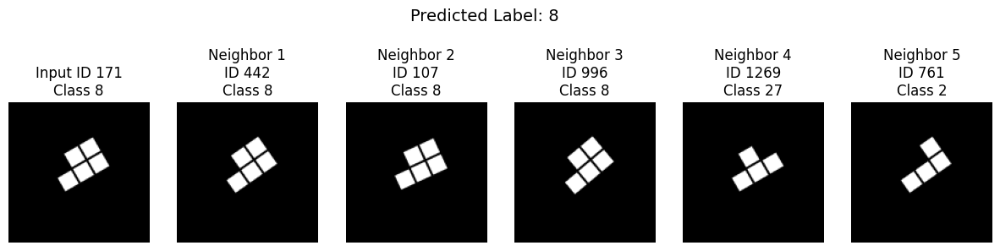

Test Sample 89:
  Image ID: 1303
  True Label: 10
  Predicted Label: 2
  Neighbor IDs: [1401  641  290 1411  515]
  Neighbor Labels: [10  2  2  5 10]
  Neighbor Distances: [0.02362955 0.09568989 0.10313964 0.10683429 0.11487812]


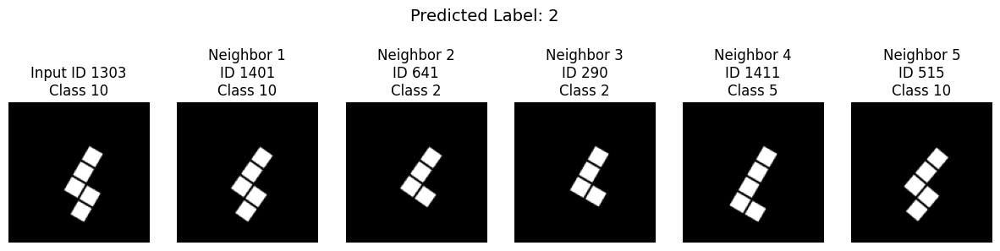

Test Sample 90:
  Image ID: 1211
  True Label: 29
  Predicted Label: 29
  Neighbor IDs: [1748 1336 1343 1031  289]
  Neighbor Labels: [29 29 29 16  6]
  Neighbor Distances: [0.02245611 0.03069913 0.09692264 0.13964891 0.16679168]


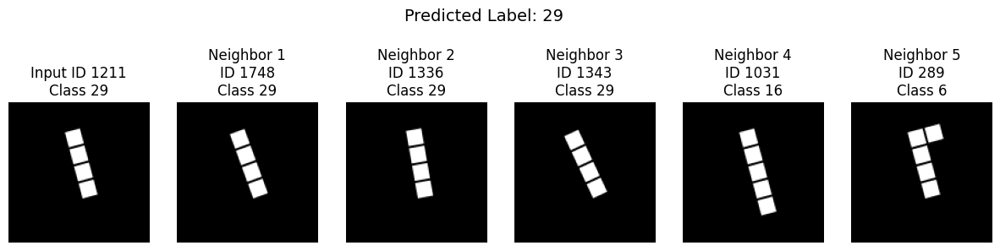

Test Sample 91:
  Image ID: 1434
  True Label: 25
  Predicted Label: 25
  Neighbor IDs: [1330 1700 1294  908 1187]
  Neighbor Labels: [25 25 25  3 25]
  Neighbor Distances: [0.02615476 0.04104102 0.04402506 0.14434528 0.15558994]


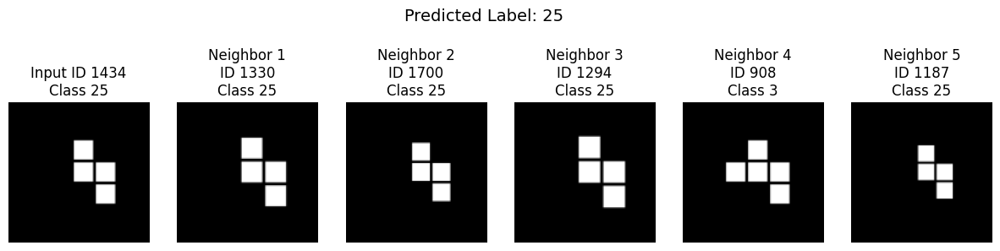

Test Sample 92:
  Image ID: 1081
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [ 956 1508 1605  733  147]
  Neighbor Labels: [5 5 5 5 6]
  Neighbor Distances: [0.0284878  0.03021699 0.09036756 0.10284698 0.12015384]


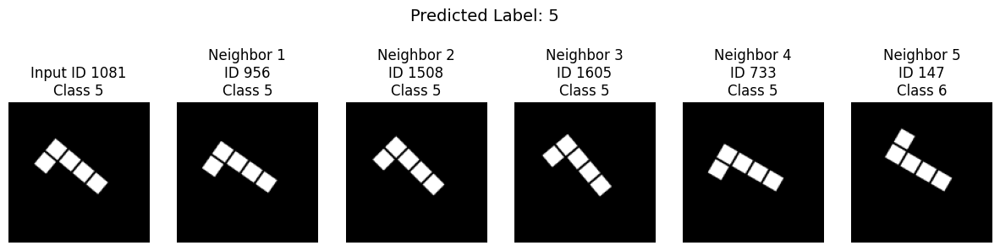

Test Sample 93:
  Image ID: 1695
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [1029 1399 1386  172  782]
  Neighbor Labels: [9 9 6 9 6]
  Neighbor Distances: [0.02234209 0.09552473 0.12328476 0.13136387 0.14013863]


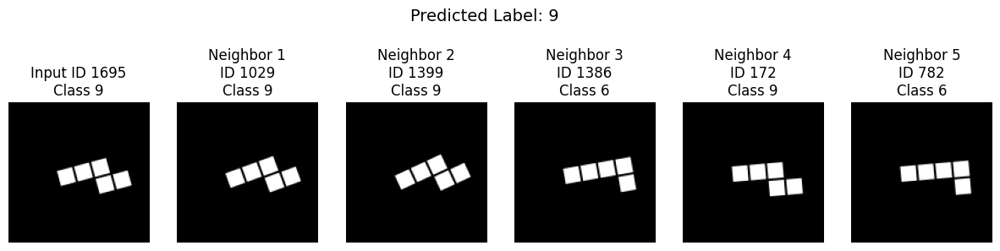

Test Sample 94:
  Image ID: 1335
  True Label: 24
  Predicted Label: 24
  Neighbor IDs: [ 509 1371 1199  140  100]
  Neighbor Labels: [24 24 24 24 11]
  Neighbor Distances: [0.02602863 0.03098071 0.11465657 0.1151011  0.2065872 ]


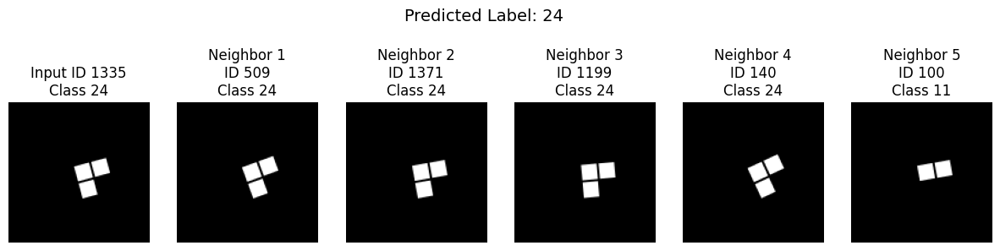

Test Sample 95:
  Image ID: 963
  True Label: 29
  Predicted Label: 29
  Neighbor IDs: [ 982 1305 1274  136  356]
  Neighbor Labels: [29  6 29  6 29]
  Neighbor Distances: [0.0340879  0.10627151 0.11376238 0.11858261 0.1196118 ]


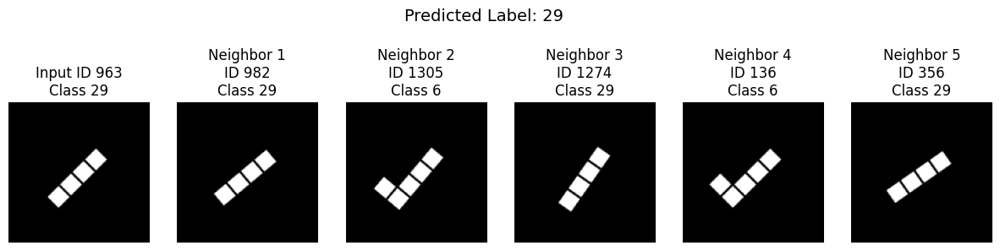

Test Sample 96:
  Image ID: 584
  True Label: 11
  Predicted Label: 6
  Neighbor IDs: [ 676  478  289 1203 1653]
  Neighbor Labels: [11 11  6  6  6]
  Neighbor Distances: [0.02994883 0.05816257 0.23394245 0.24235636 0.26856363]


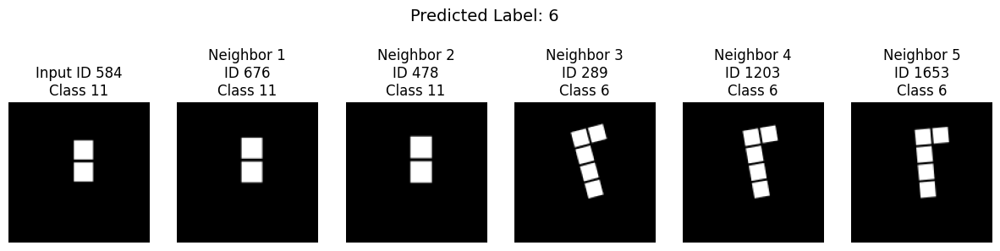

Test Sample 97:
  Image ID: 1039
  True Label: 11
  Predicted Label: 11
  Neighbor IDs: [1233 1306 1040 1489  420]
  Neighbor Labels: [11 11 11 11 11]
  Neighbor Distances: [0.01452625 0.01452875 0.05478108 0.05804938 0.11828613]


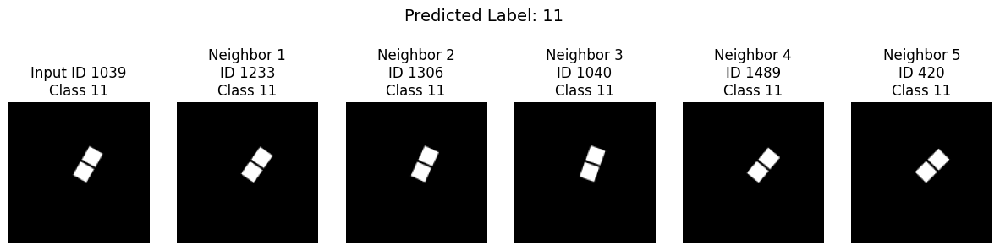

Test Sample 98:
  Image ID: 827
  True Label: 22
  Predicted Label: 22
  Neighbor IDs: [ 702  365 1435  804   65]
  Neighbor Labels: [22 22 22 22 11]
  Neighbor Distances: [0.02980626 0.03710681 0.10517257 0.13633513 0.15937686]


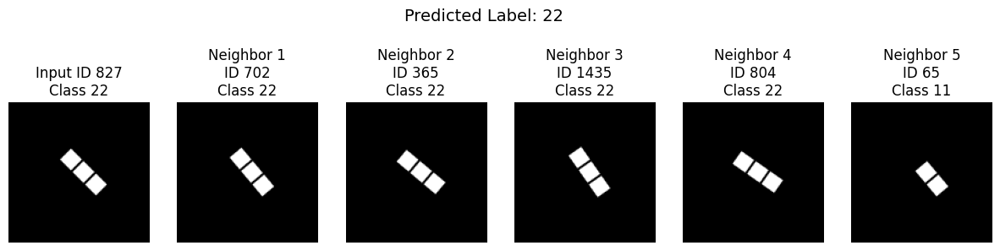

Test Sample 99:
  Image ID: 731
  True Label: 7
  Predicted Label: 7
  Neighbor IDs: [  84 1048 1444  397 1086]
  Neighbor Labels: [ 7 27 27  7 19]
  Neighbor Distances: [0.05302721 0.1621821  0.17145193 0.17426562 0.21078646]


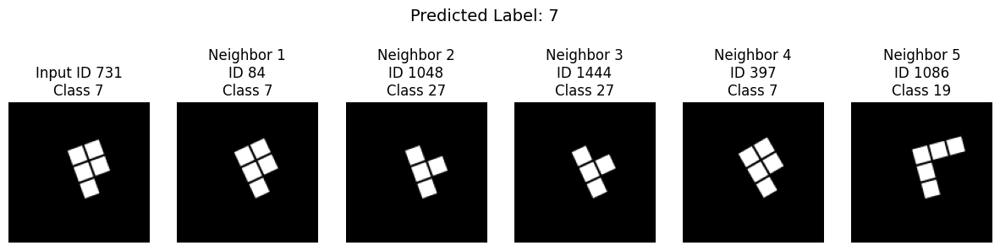

Test Sample 100:
  Image ID: 347
  True Label: 3
  Predicted Label: 3
  Neighbor IDs: [1609  758 1385 1415  908]
  Neighbor Labels: [3 3 3 3 3]
  Neighbor Distances: [0.05446303 0.07483685 0.0844171  0.09299195 0.1155532 ]


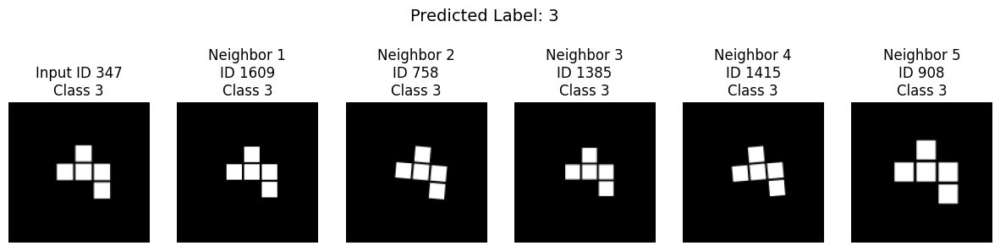

Test Sample 101:
  Image ID: 1397
  True Label: 2
  Predicted Label: 2
  Neighbor IDs: [ 838  360  111   12 1251]
  Neighbor Labels: [ 2  2  2  2 17]
  Neighbor Distances: [0.05245066 0.08401221 0.10005844 0.11070347 0.14053607]


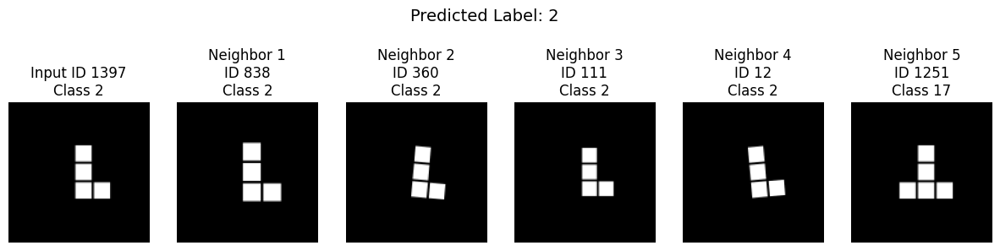

Test Sample 102:
  Image ID: 1063
  True Label: 1
  Predicted Label: 19
  Neighbor IDs: [ 773  211 1378   27  919]
  Neighbor Labels: [ 1 19  1 19 19]
  Neighbor Distances: [0.03847343 0.13077593 0.14065617 0.16080368 0.16090071]


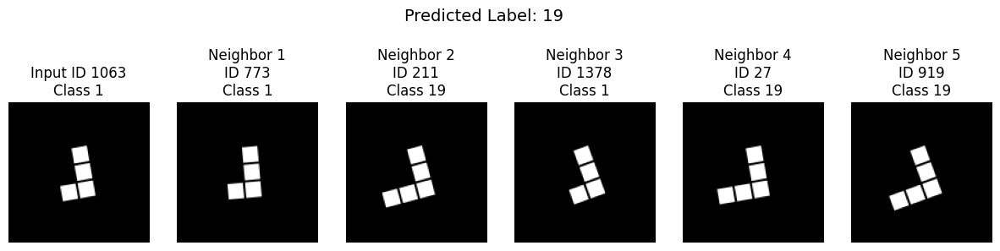

Test Sample 103:
  Image ID: 1816
  True Label: 3
  Predicted Label: 3
  Neighbor IDs: [1138 1337  662  433  227]
  Neighbor Labels: [ 3  3  4  4 27]
  Neighbor Distances: [0.06025076 0.15525013 0.1572156  0.17677122 0.18724597]


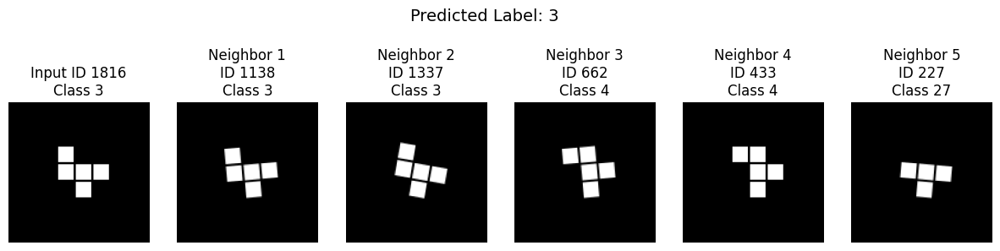

Test Sample 104:
  Image ID: 1143
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [1411 1067 1401  648  290]
  Neighbor Labels: [ 5  5 10  5  2]
  Neighbor Distances: [0.02627099 0.09553611 0.11306357 0.12313318 0.14385986]


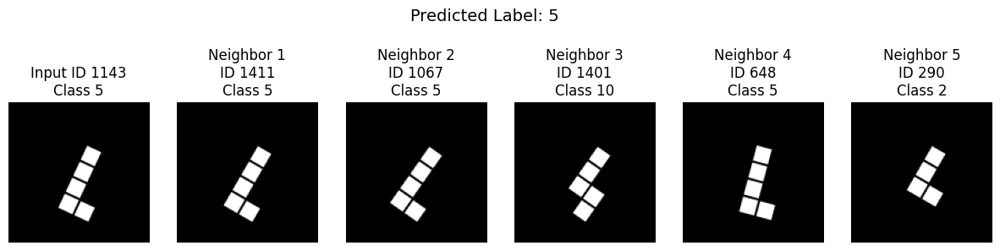

Test Sample 105:
  Image ID: 1329
  True Label: 6
  Predicted Label: 6
  Neighbor IDs: [1600 1835  358  689 1092]
  Neighbor Labels: [ 6  6  6  6 29]
  Neighbor Distances: [0.01968575 0.02928424 0.12415648 0.12452614 0.12810552]


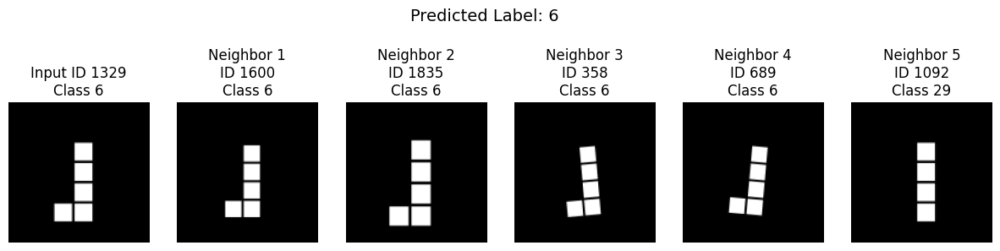

Test Sample 106:
  Image ID: 980
  True Label: 11
  Predicted Label: 11
  Neighbor IDs: [ 231  220 1795 1838  420]
  Neighbor Labels: [11 11 11 11 11]
  Neighbor Distances: [0.00934404 0.01330471 0.04487479 0.05482227 0.10413575]


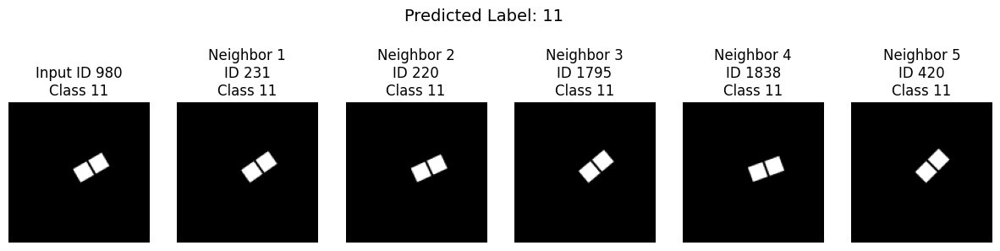

Test Sample 107:
  Image ID: 260
  True Label: 16
  Predicted Label: 16
  Neighbor IDs: [1630   25  910  282  427]
  Neighbor Labels: [16 16 16 29 29]
  Neighbor Distances: [0.0287044  0.09150183 0.10224497 0.14125186 0.14817458]


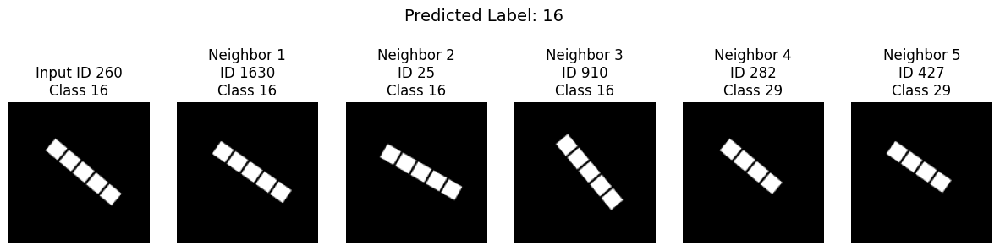

Test Sample 108:
  Image ID: 1786
  True Label: 25
  Predicted Label: 25
  Neighbor IDs: [ 183  699 1187 1284 1356]
  Neighbor Labels: [25 25 25 25 24]
  Neighbor Distances: [0.02022934 0.05739313 0.0693723  0.11033261 0.16286415]


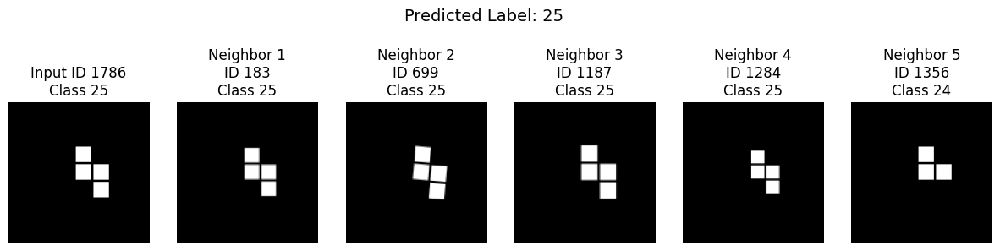

Test Sample 109:
  Image ID: 1002
  True Label: 7
  Predicted Label: 7
  Neighbor IDs: [1557  672  661  756  104]
  Neighbor Labels: [ 7 27  7 27  1]
  Neighbor Distances: [0.03963572 0.18650717 0.1872282  0.20623487 0.20936477]


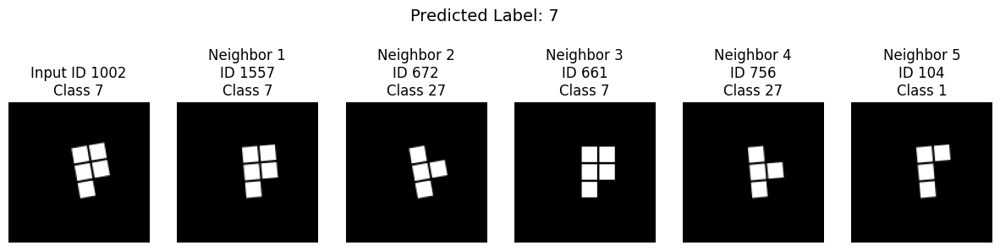

Test Sample 110:
  Image ID: 1452
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [ 351 1680  616 1438 1505]
  Neighbor Labels: [ 4  4  4 27  3]
  Neighbor Distances: [0.04314971 0.13160193 0.15959549 0.1611796  0.18121386]


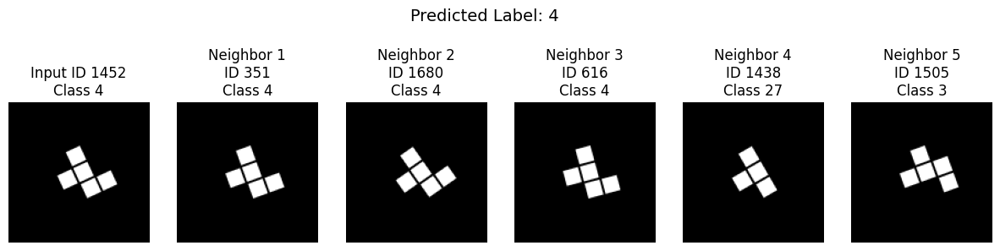

Test Sample 111:
  Image ID: 1487
  True Label: 8
  Predicted Label: 8
  Neighbor IDs: [1478   23 1016 1467 1062]
  Neighbor Labels: [ 8  8  8 27 25]
  Neighbor Distances: [0.03186882 0.05455971 0.13291895 0.20365393 0.20407069]


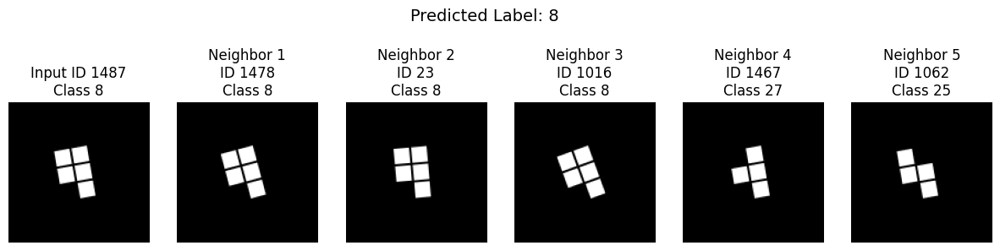

Test Sample 112:
  Image ID: 1899
  True Label: 20
  Predicted Label: 20
  Neighbor IDs: [ 964 1619 1121 1655 1548]
  Neighbor Labels: [20 20 20 20 14]
  Neighbor Distances: [0.02476323 0.03068036 0.08617878 0.1341201  0.14222836]


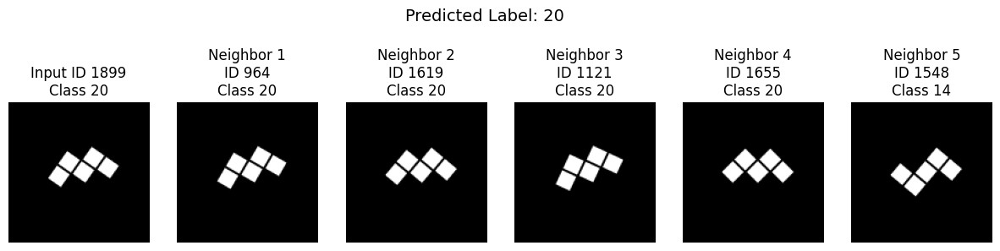

Test Sample 113:
  Image ID: 659
  True Label: 2
  Predicted Label: 2
  Neighbor IDs: [ 903 1136  704  491  663]
  Neighbor Labels: [ 2  2  2 10 10]
  Neighbor Distances: [0.04177392 0.05749631 0.12805247 0.14125186 0.16500986]


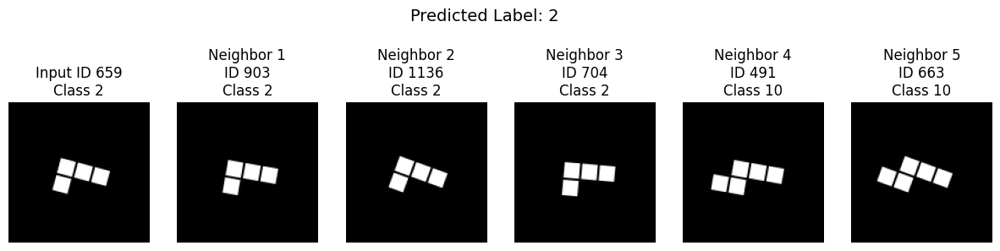

Test Sample 114:
  Image ID: 933
  True Label: 10
  Predicted Label: 5
  Neighbor IDs: [1097 1420  230  759  626]
  Neighbor Labels: [10 10  2  5  5]
  Neighbor Distances: [0.03108513 0.05317467 0.08629608 0.09569335 0.10075885]


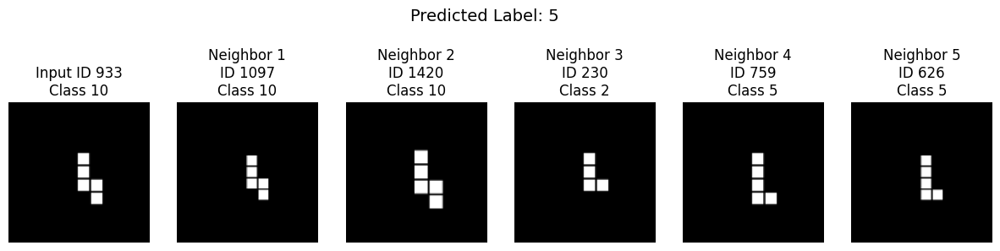

Test Sample 115:
  Image ID: 1324
  True Label: 1
  Predicted Label: 9
  Neighbor IDs: [ 593  165  318 1684  962]
  Neighbor Labels: [1 1 9 9 9]
  Neighbor Distances: [0.05128813 0.11836761 0.12032294 0.14126897 0.16047299]


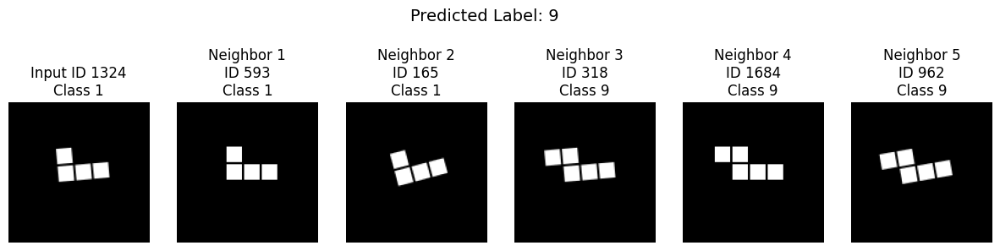

Test Sample 116:
  Image ID: 1412
  True Label: 2
  Predicted Label: 2
  Neighbor IDs: [1456  315 1341 1111 1436]
  Neighbor Labels: [ 2  2  2 10 10]
  Neighbor Distances: [0.03859138 0.04518652 0.14294028 0.15232855 0.15294462]


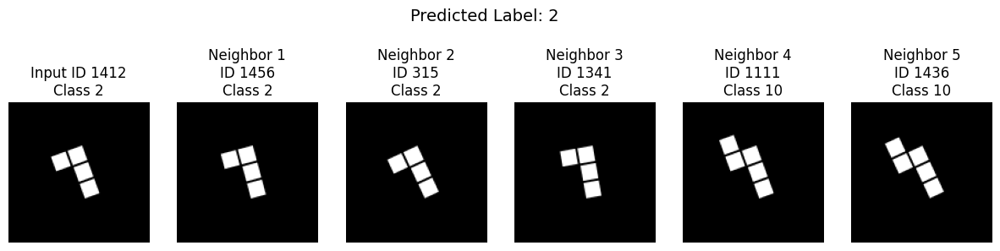

Test Sample 117:
  Image ID: 1368
  True Label: 12
  Predicted Label: 12
  Neighbor IDs: [ 178 1262 1219  271 1360]
  Neighbor Labels: [12 12 12 12 27]
  Neighbor Distances: [0.0286938  0.02901089 0.11364913 0.12238097 0.17483985]


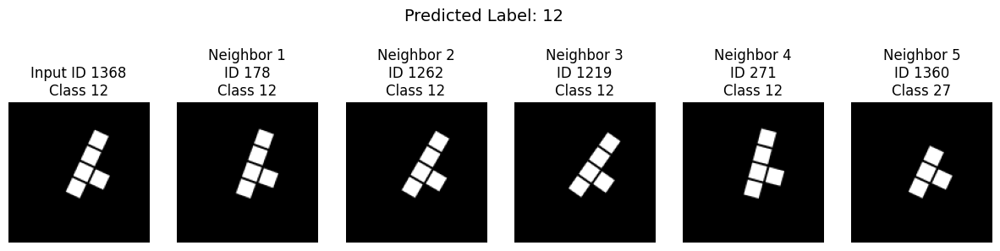

Test Sample 118:
  Image ID: 4
  True Label: 12
  Predicted Label: 12
  Neighbor IDs: [1825  642 1747  135 1095]
  Neighbor Labels: [12 12 12 12 29]
  Neighbor Distances: [0.02943397 0.04634464 0.13135993 0.15348959 0.262398  ]


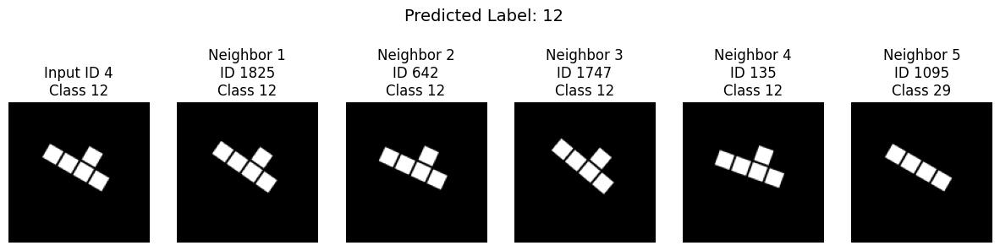

Test Sample 119:
  Image ID: 176
  True Label: 6
  Predicted Label: 6
  Neighbor IDs: [ 316 1870    9  544 1315]
  Neighbor Labels: [6 6 6 6 9]
  Neighbor Distances: [0.02349639 0.02632022 0.08440268 0.09526324 0.10557652]


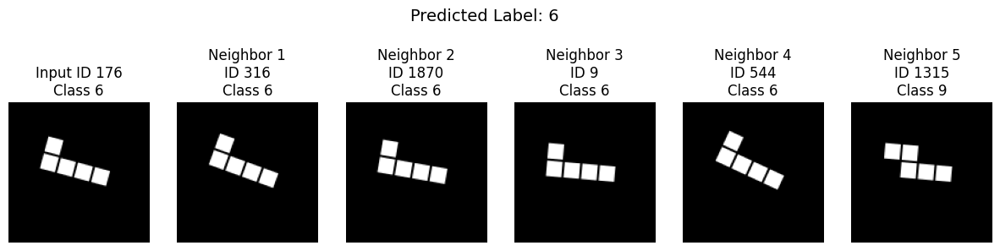

Test Sample 120:
  Image ID: 921
  True Label: 18
  Predicted Label: 18
  Neighbor IDs: [ 848 1027  206 1524  315]
  Neighbor Labels: [18 18 18 18  2]
  Neighbor Distances: [0.01935011 0.04370463 0.09879667 0.16633141 0.21549505]


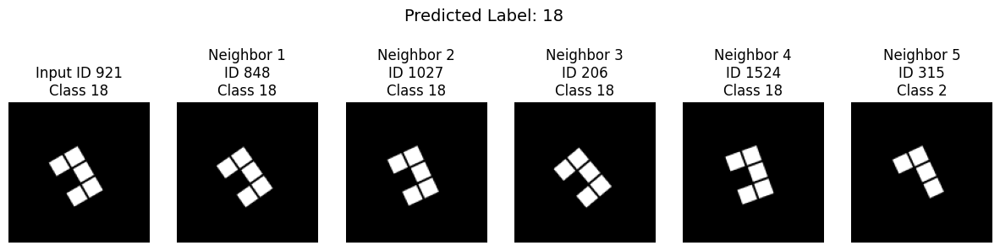

Test Sample 121:
  Image ID: 1038
  True Label: 0
  Predicted Label: 0
  Neighbor IDs: [1787  856 1405  675  941]
  Neighbor Labels: [0 0 0 0 0]
  Neighbor Distances: [0.00061631 0.0060811  0.01579207 0.01613408 0.0247674 ]


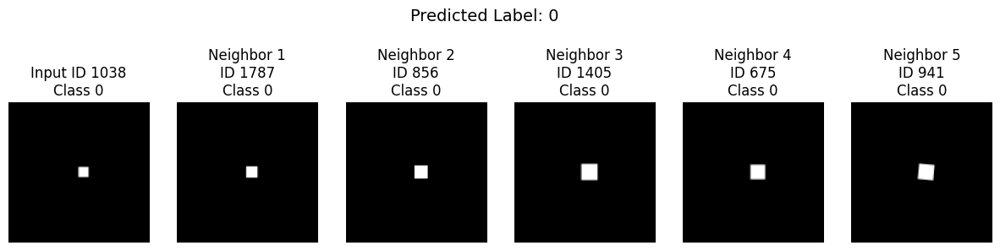

Test Sample 122:
  Image ID: 1503
  True Label: 10
  Predicted Label: 10
  Neighbor IDs: [ 268 1401  290 1730  648]
  Neighbor Labels: [10 10  2 10  5]
  Neighbor Distances: [0.03069329 0.1041013  0.10910594 0.14670324 0.15117037]


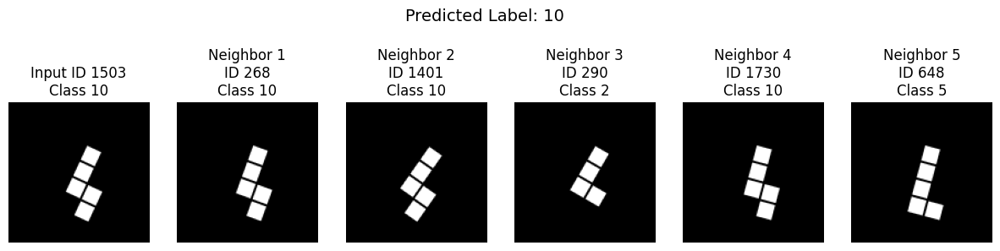

Test Sample 123:
  Image ID: 1030
  True Label: 22
  Predicted Label: 22
  Neighbor IDs: [1413  558 1296  485  231]
  Neighbor Labels: [22 22 22 22 11]
  Neighbor Distances: [0.02463317 0.0294494  0.10165662 0.11358029 0.15180409]


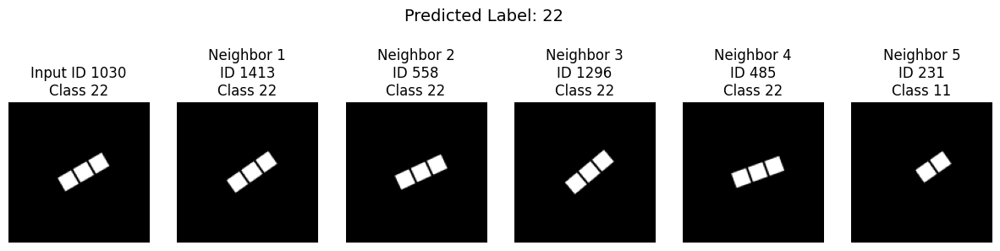

Test Sample 124:
  Image ID: 170
  True Label: 4
  Predicted Label: 3
  Neighbor IDs: [ 139 1726 1495 1762 1780]
  Neighbor Labels: [ 4  4  3  3 13]
  Neighbor Distances: [0.0593189  0.17418653 0.2037552  0.2133848  0.22919047]


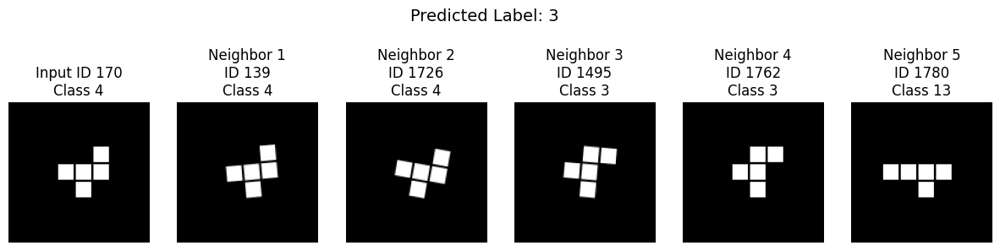

Test Sample 125:
  Image ID: 1691
  True Label: 14
  Predicted Label: 14
  Neighbor IDs: [1173  112  710  149  292]
  Neighbor Labels: [14 14 14 20 20]
  Neighbor Distances: [0.02985883 0.12181437 0.15685809 0.16831958 0.17072773]


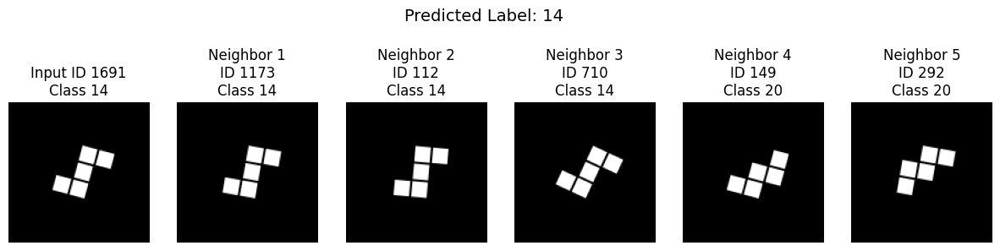

Test Sample 126:
  Image ID: 311
  True Label: 3
  Predicted Label: 3
  Neighbor IDs: [1553 1074 1533  755  242]
  Neighbor Labels: [3 3 3 4 4]
  Neighbor Distances: [0.03848583 0.07907796 0.15717387 0.15895832 0.17813337]


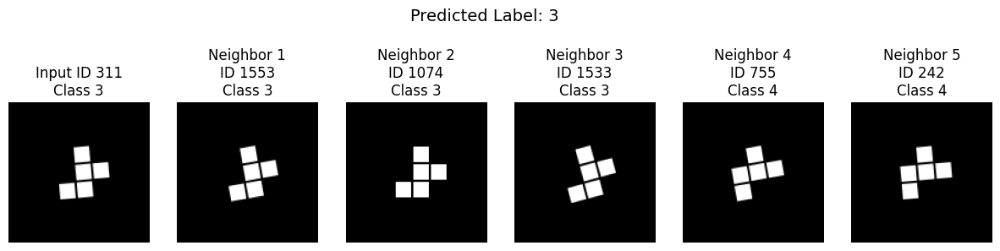

Test Sample 127:
  Image ID: 269
  True Label: 8
  Predicted Label: 8
  Neighbor IDs: [1865  917 1517  643 1507]
  Neighbor Labels: [ 8  8  8 27  8]
  Neighbor Distances: [0.03612077 0.04653329 0.14988261 0.17612231 0.17890191]


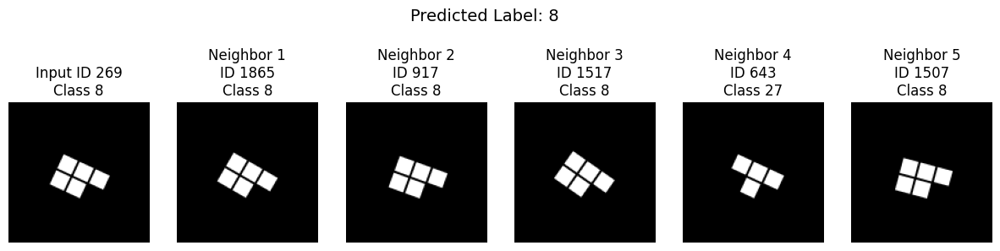

Test Sample 128:
  Image ID: 1239
  True Label: 19
  Predicted Label: 1
  Neighbor IDs: [1373 1163 1466 1277   28]
  Neighbor Labels: [19  1  7 19  1]
  Neighbor Distances: [0.03448719 0.13237262 0.1422342  0.14660478 0.1482997 ]


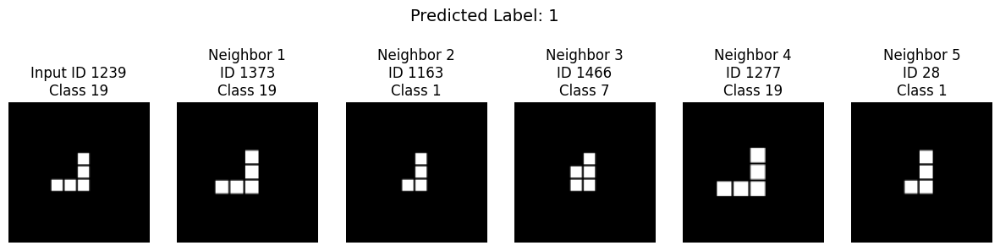

Test Sample 129:
  Image ID: 1354
  True Label: 2
  Predicted Label: 2
  Neighbor IDs: [ 527  912  150  522 1631]
  Neighbor Labels: [ 2  2 10  2 10]
  Neighbor Distances: [0.0369907  0.03946996 0.12097871 0.12719381 0.13145745]


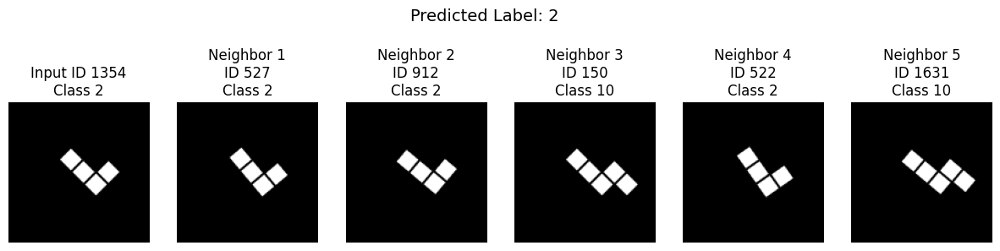

Test Sample 130:
  Image ID: 705
  True Label: 13
  Predicted Label: 13
  Neighbor IDs: [ 487  539 1223  756  540]
  Neighbor Labels: [13 13 13 27 13]
  Neighbor Distances: [0.0371896  0.06373203 0.11083639 0.14966774 0.15384978]


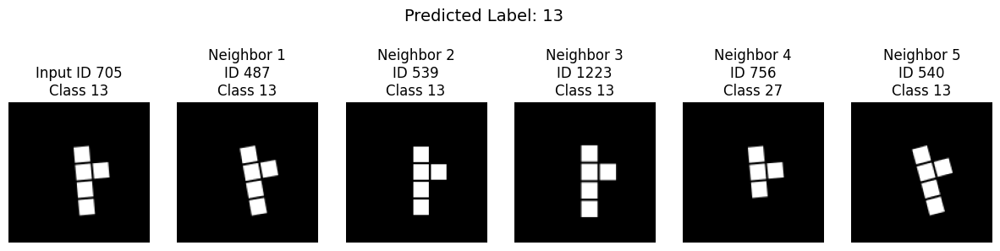

Test Sample 131:
  Image ID: 1078
  True Label: 22
  Predicted Label: 22
  Neighbor IDs: [ 143 1580  485  450  100]
  Neighbor Labels: [22 22 22 22 11]
  Neighbor Distances: [0.02172196 0.02215159 0.08580458 0.11137366 0.16580772]


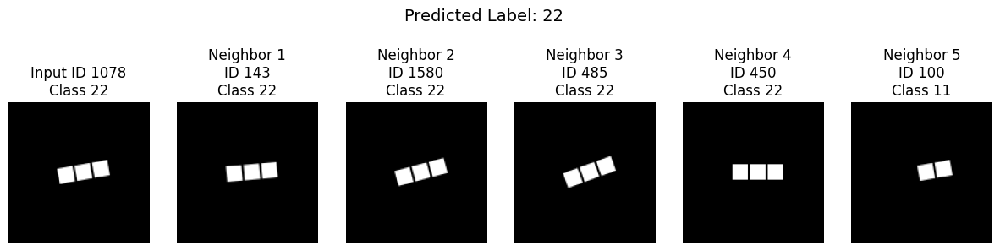

Test Sample 132:
  Image ID: 1300
  True Label: 16
  Predicted Label: 16
  Neighbor IDs: [ 750 1076 1465 1868 1832]
  Neighbor Labels: [16 16 16 16  5]
  Neighbor Distances: [0.02452505 0.02504325 0.09399211 0.10423243 0.15655589]


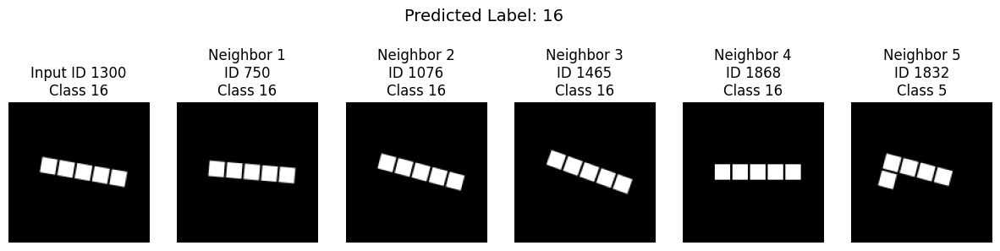

Test Sample 133:
  Image ID: 652
  True Label: 29
  Predicted Label: 29
  Neighbor IDs: [ 920 1739  435 1465 1095]
  Neighbor Labels: [29 29  5 16 29]
  Neighbor Distances: [0.02908224 0.10557622 0.1143266  0.12342274 0.1306982 ]


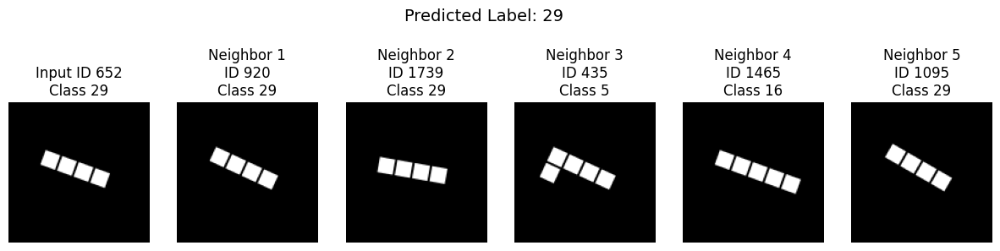

Test Sample 134:
  Image ID: 1141
  True Label: 1
  Predicted Label: 1
  Neighbor IDs: [ 165 1454  962  318  593]
  Neighbor Labels: [1 1 9 9 1]
  Neighbor Distances: [0.02784282 0.12338495 0.12520885 0.12807107 0.16079092]


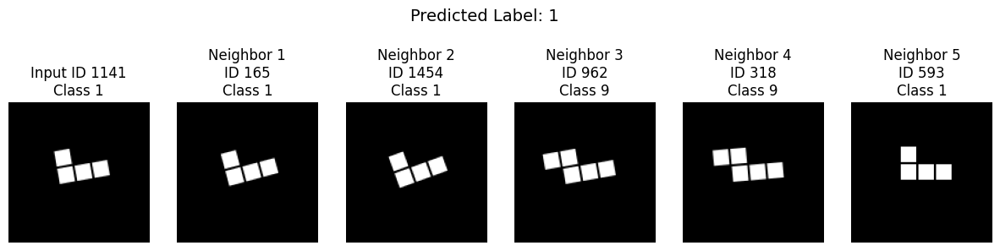

Test Sample 135:
  Image ID: 11
  True Label: 7
  Predicted Label: 7
  Neighbor IDs: [1557   84 1086 1048  580]
  Neighbor Labels: [ 7  7 19 27  1]
  Neighbor Distances: [0.14958835 0.18263197 0.20998114 0.21097708 0.21261078]


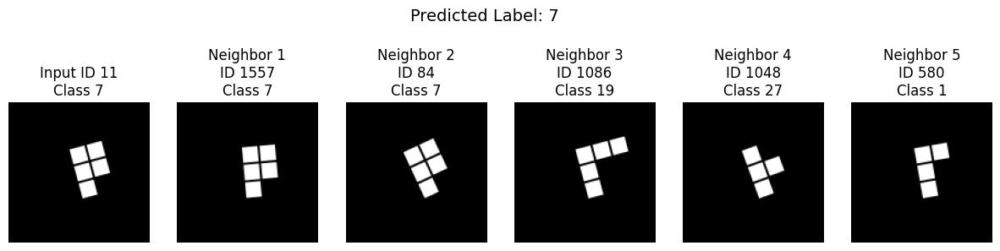

Test Sample 136:
  Image ID: 1468
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [ 113  706  242 1071  755]
  Neighbor Labels: [4 4 4 4 4]
  Neighbor Distances: [0.02316201 0.05705488 0.0616895  0.09524214 0.16375303]


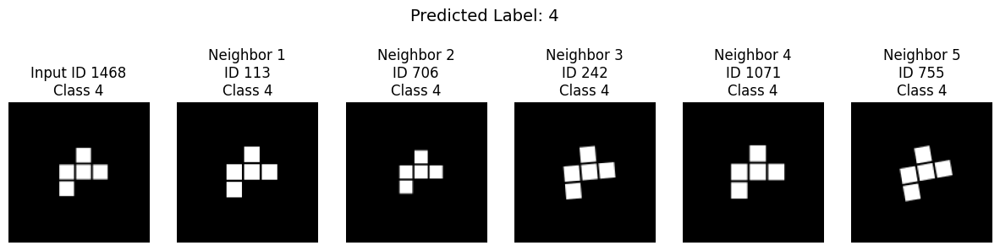

Test Sample 137:
  Image ID: 821
  True Label: 11
  Predicted Label: 11
  Neighbor IDs: [ 676  478  871  548 1120]
  Neighbor Labels: [11 11 11  6 24]
  Neighbor Distances: [0.12380558 0.17015183 0.1952337  0.24580401 0.26184237]


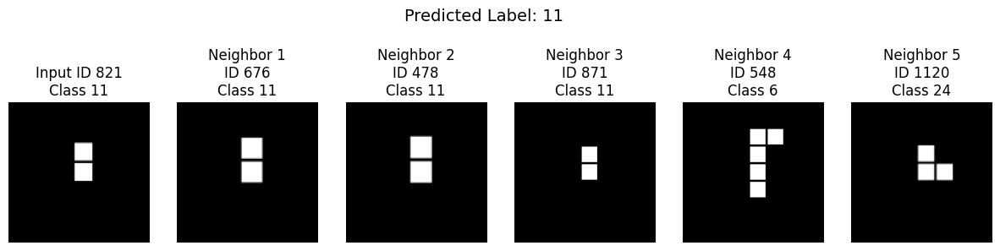

Test Sample 138:
  Image ID: 879
  True Label: 6
  Predicted Label: 6
  Neighbor IDs: [1603 1328 1738  851 1100]
  Neighbor Labels: [6 6 9 6 6]
  Neighbor Distances: [0.03098911 0.03549826 0.08287847 0.09098297 0.10017151]


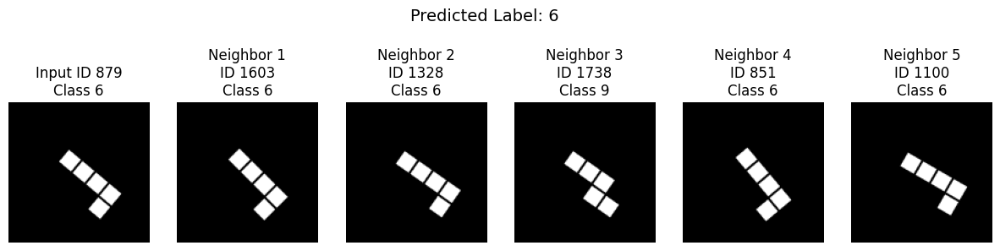

Test Sample 139:
  Image ID: 1353
  True Label: 16
  Predicted Label: 16
  Neighbor IDs: [ 910 1630 1276  475  293]
  Neighbor Labels: [16 16 16  5 29]
  Neighbor Distances: [0.0259878  0.09819674 0.09987295 0.13656694 0.15456086]


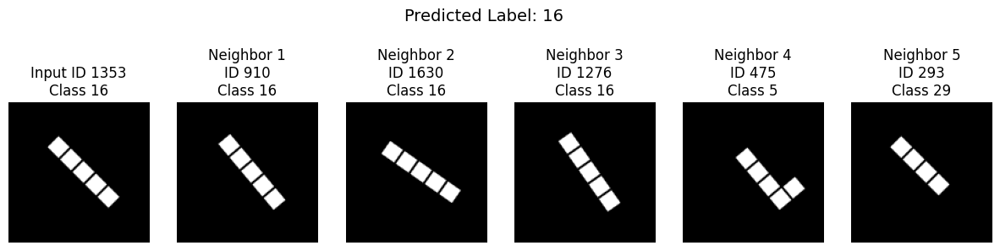

Test Sample 140:
  Image ID: 489
  True Label: 27
  Predicted Label: 7
  Neighbor IDs: [ 673  441  688 1340 1208]
  Neighbor Labels: [27 27  7  7  7]
  Neighbor Distances: [0.04682016 0.04855919 0.1232332  0.14593136 0.16433287]


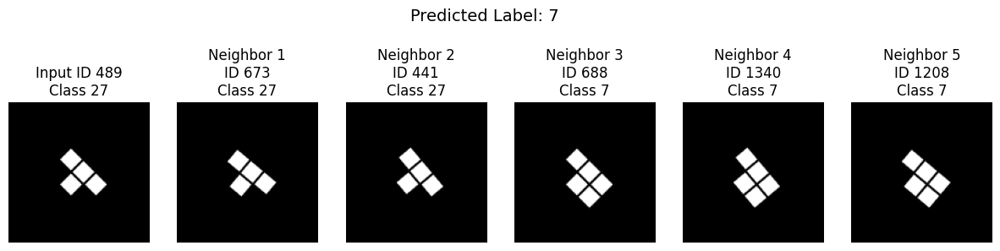

Test Sample 141:
  Image ID: 970
  True Label: 21
  Predicted Label: 21
  Neighbor IDs: [1437  557 1098  784 1678]
  Neighbor Labels: [21 21 21 21 21]
  Neighbor Distances: [0.06036705 0.07303417 0.22860175 0.2660762  0.28732818]


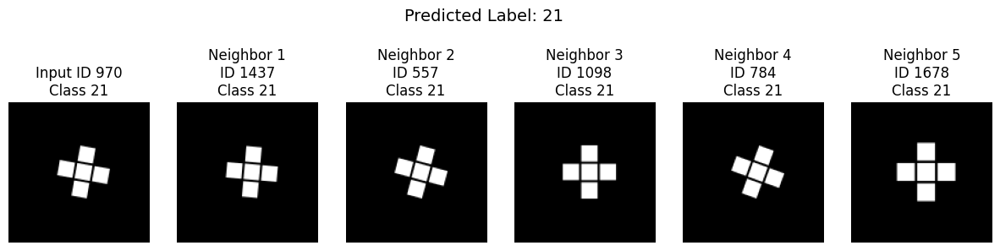

Test Sample 142:
  Image ID: 342
  True Label: 2
  Predicted Label: 2
  Neighbor IDs: [ 294 1551  935  761 1537]
  Neighbor Labels: [ 2  2 10  2 10]
  Neighbor Distances: [0.03614706 0.03801966 0.12914282 0.14313358 0.1469487 ]


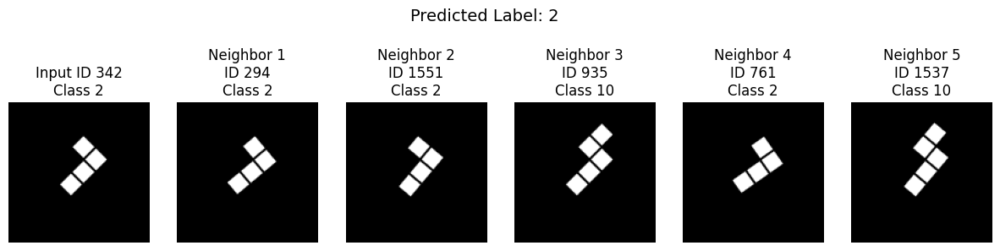

Test Sample 143:
  Image ID: 392
  True Label: 26
  Predicted Label: 26
  Neighbor IDs: [ 388  905 1430 1198 1769]
  Neighbor Labels: [26 26 26  4  7]
  Neighbor Distances: [0.00598764 0.02361339 0.13051748 0.13554001 0.15321666]


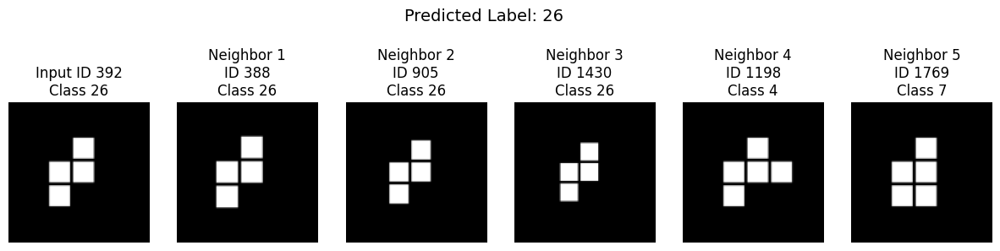

Test Sample 144:
  Image ID: 1742
  True Label: 27
  Predicted Label: 27
  Neighbor IDs: [1048  672  756 1444  487]
  Neighbor Labels: [27 27 27 27 13]
  Neighbor Distances: [0.0381757  0.04165554 0.1498627  0.15494096 0.16821754]


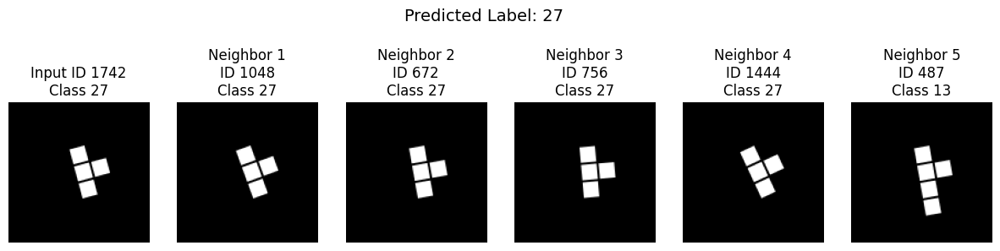

Test Sample 145:
  Image ID: 660
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [ 535  387  110 1056  444]
  Neighbor Labels: [9 9 9 6 6]
  Neighbor Distances: [0.02948809 0.08832359 0.10800231 0.1354549  0.1395837 ]


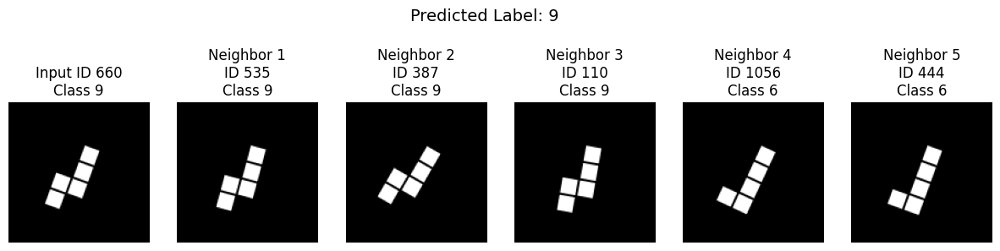

Test Sample 146:
  Image ID: 1887
  True Label: 18
  Predicted Label: 10
  Neighbor IDs: [1876 1007  491  665  903]
  Neighbor Labels: [18 18 10 10  2]
  Neighbor Distances: [0.04009855 0.18982744 0.2104246  0.24537796 0.2754609 ]


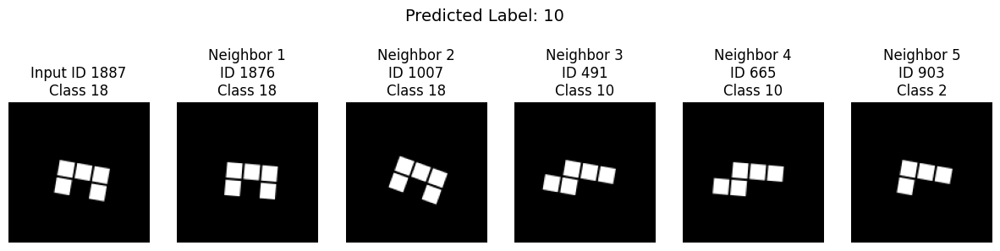

Test Sample 147:
  Image ID: 1015
  True Label: 0
  Predicted Label: 0
  Neighbor IDs: [ 847 1001  765 1405  882]
  Neighbor Labels: [0 0 0 0 0]
  Neighbor Distances: [0.0112344  0.01474917 0.02987528 0.03024745 0.03345376]


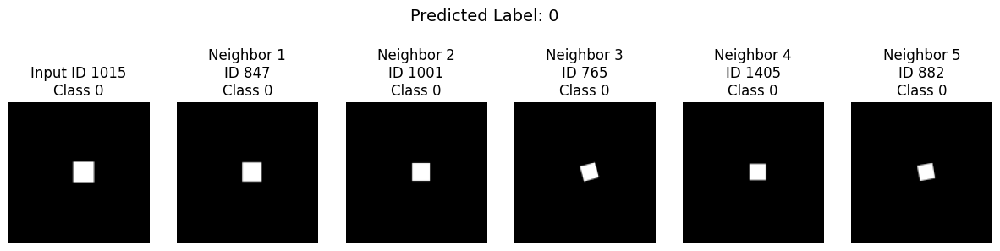

Test Sample 148:
  Image ID: 1220
  True Label: 11
  Predicted Label: 11
  Neighbor IDs: [ 633  369 1109  451  549]
  Neighbor Labels: [11 11 11 11 11]
  Neighbor Distances: [0.0101546  0.01122624 0.04399133 0.05530405 0.11142451]


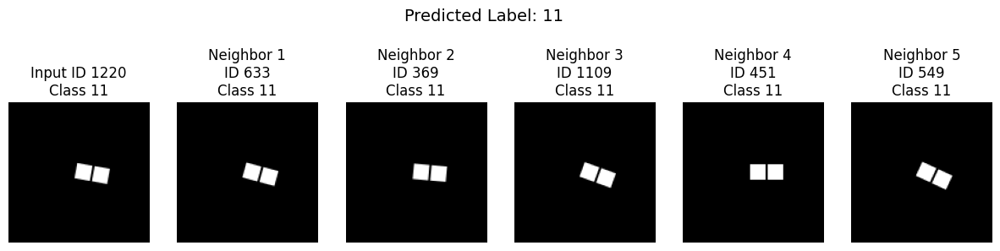

Test Sample 149:
  Image ID: 798
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [ 366   17 1365  548  974]
  Neighbor Labels: [9 9 9 6 6]
  Neighbor Distances: [0.04281592 0.06645763 0.12095046 0.15242493 0.15249228]


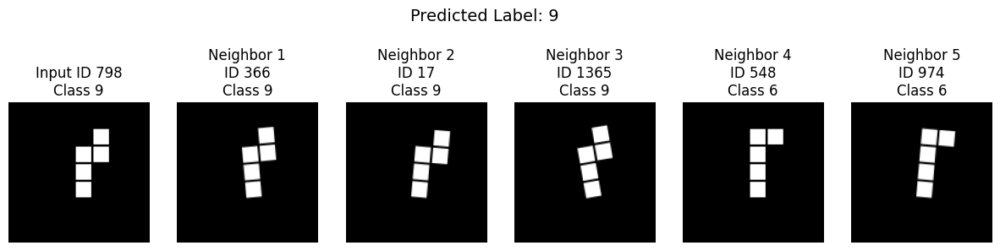

Test Sample 150:
  Image ID: 934
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [ 418 1806  617  836  678]
  Neighbor Labels: [4 4 4 3 2]
  Neighbor Distances: [0.03417134 0.06614244 0.1312499  0.2041763  0.21045005]


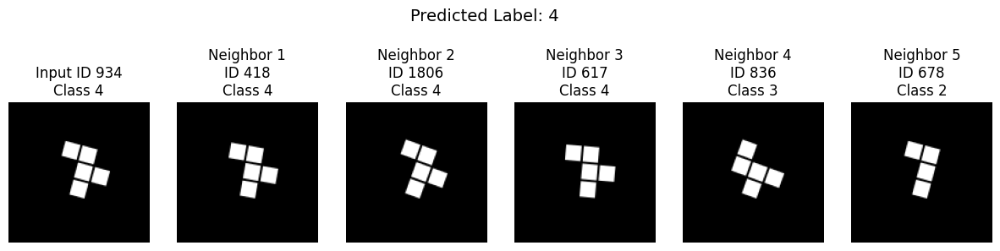

Test Sample 151:
  Image ID: 1734
  True Label: 24
  Predicted Label: 24
  Neighbor IDs: [ 259 1811 1160 1606  196]
  Neighbor Labels: [24 24 24 24 25]
  Neighbor Distances: [0.03104067 0.03569221 0.11550146 0.11874545 0.17820245]


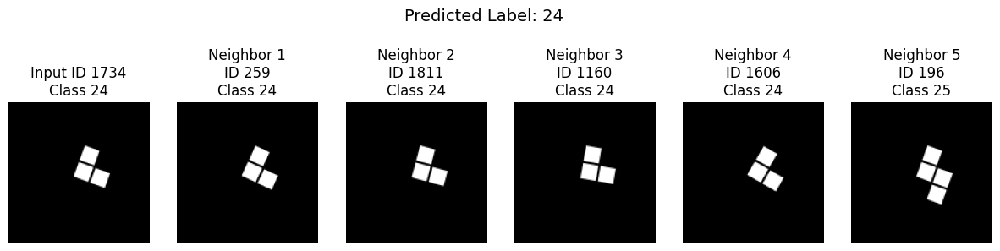

Test Sample 152:
  Image ID: 528
  True Label: 24
  Predicted Label: 24
  Neighbor IDs: [ 649 1120 1662 1828  241]
  Neighbor Labels: [24 24 24 24 24]
  Neighbor Distances: [0.05070198 0.05564499 0.14343077 0.18855244 0.22704262]


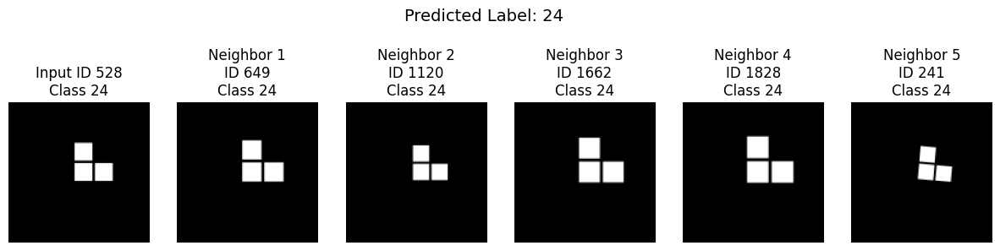

Test Sample 153:
  Image ID: 1313
  True Label: 10
  Predicted Label: 10
  Neighbor IDs: [1196 1770 1597 1701  456]
  Neighbor Labels: [10 10 10 10  2]
  Neighbor Distances: [0.02493763 0.02525532 0.09725988 0.10253274 0.12234211]


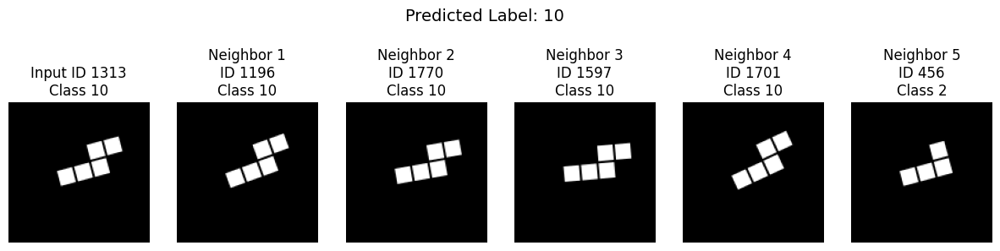

Test Sample 154:
  Image ID: 559
  True Label: 4
  Predicted Label: 3
  Neighbor IDs: [ 886 1289 1149 1093  277]
  Neighbor Labels: [4 4 3 3 3]
  Neighbor Distances: [0.0570581  0.05817962 0.12772411 0.1612922  0.1691804 ]


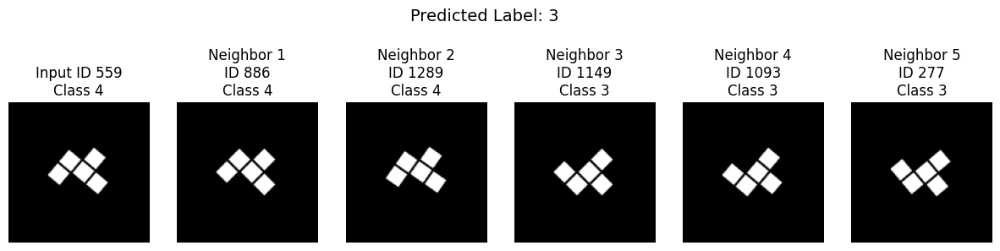

Test Sample 155:
  Image ID: 1856
  True Label: 6
  Predicted Label: 29
  Neighbor IDs: [1302 1835  569 1463  734]
  Neighbor Labels: [ 6  6 29 29 29]
  Neighbor Distances: [0.00856978 0.01717091 0.10004044 0.10569322 0.11703092]


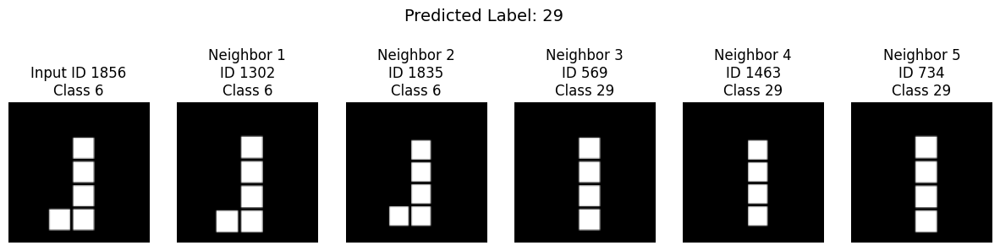

Test Sample 156:
  Image ID: 628
  True Label: 27
  Predicted Label: 27
  Neighbor IDs: [ 693  244  234 1815  908]
  Neighbor Labels: [27 27 27 27  3]
  Neighbor Distances: [0.04950565 0.05085254 0.1355378  0.17263079 0.1790204 ]


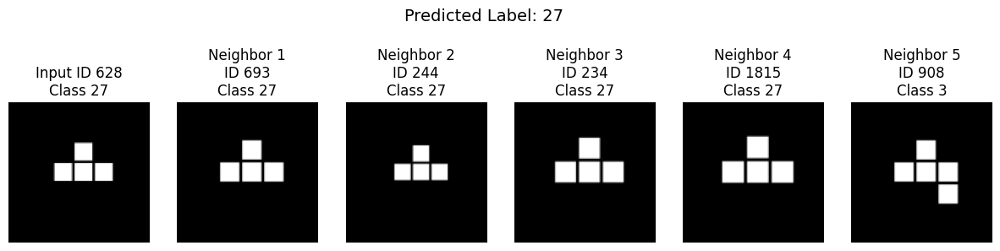

Test Sample 157:
  Image ID: 708
  True Label: 20
  Predicted Label: 20
  Neighbor IDs: [1657  786 1106  432  458]
  Neighbor Labels: [20 25 20 14 20]
  Neighbor Distances: [0.03853202 0.13174373 0.13305151 0.14784747 0.15038472]


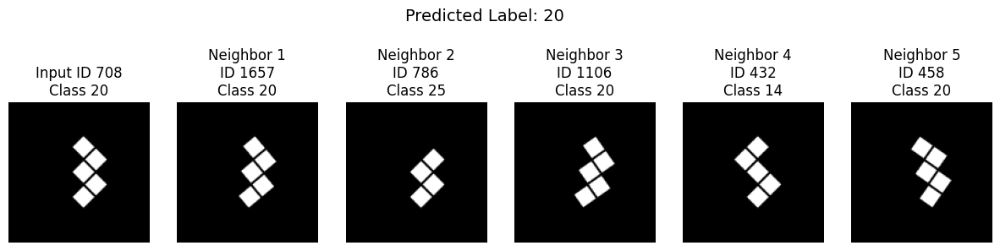

Test Sample 158:
  Image ID: 202
  True Label: 6
  Predicted Label: 6
  Neighbor IDs: [ 782 1351 1386 1721 1698]
  Neighbor Labels: [6 6 6 5 5]
  Neighbor Distances: [0.0255751  0.03043187 0.07949054 0.1481548  0.16793132]


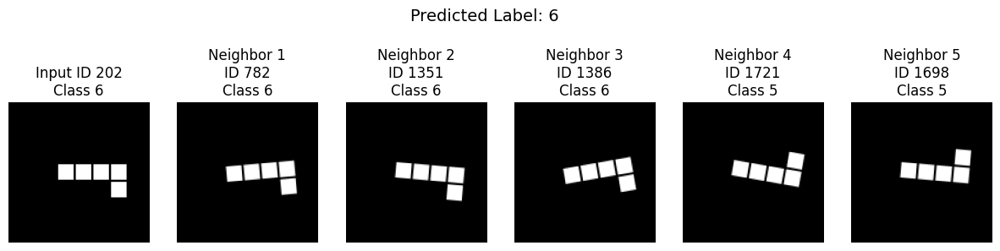

Test Sample 159:
  Image ID: 863
  True Label: 13
  Predicted Label: 13
  Neighbor IDs: [ 789 1394 1115  790  795]
  Neighbor Labels: [13 13 13 13 27]
  Neighbor Distances: [0.02689177 0.04201698 0.10285842 0.15616024 0.16639638]


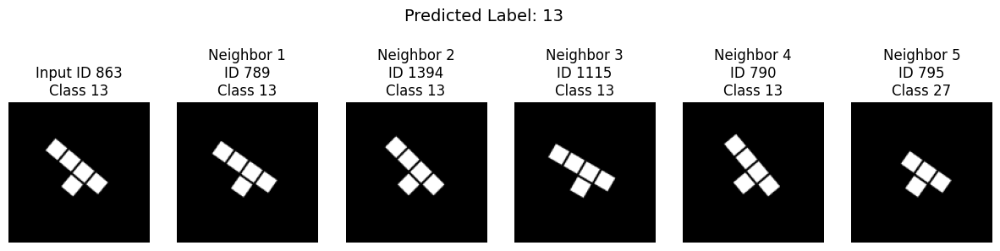

Test Sample 160:
  Image ID: 1192
  True Label: 28
  Predicted Label: 28
  Neighbor IDs: [1563  698 1041  262 1688]
  Neighbor Labels: [28 28 28 24 28]
  Neighbor Distances: [0.01842827 0.03274667 0.08628607 0.13813674 0.14951313]


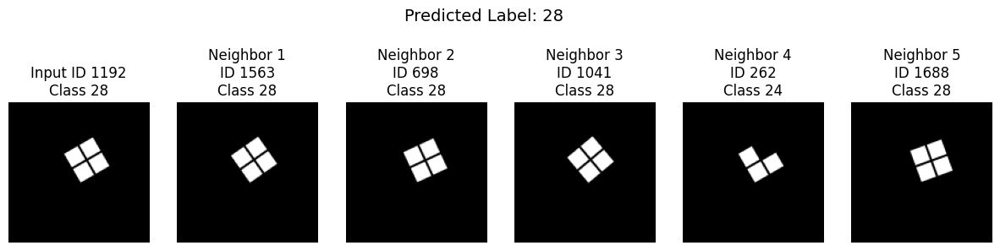

Test Sample 161:
  Image ID: 395
  True Label: 1
  Predicted Label: 1
  Neighbor IDs: [1206  373 1332 1445  295]
  Neighbor Labels: [ 1  1 19  1 19]
  Neighbor Distances: [0.0375632  0.06973326 0.1232366  0.12668008 0.17045116]


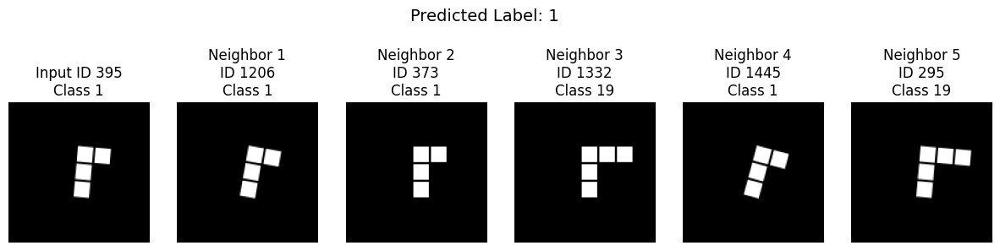

Test Sample 162:
  Image ID: 526
  True Label: 1
  Predicted Label: 1
  Neighbor IDs: [1378  919  773  211   66]
  Neighbor Labels: [ 1 19  1 19  9]
  Neighbor Distances: [0.0357126  0.13245976 0.14346427 0.16137832 0.17421556]


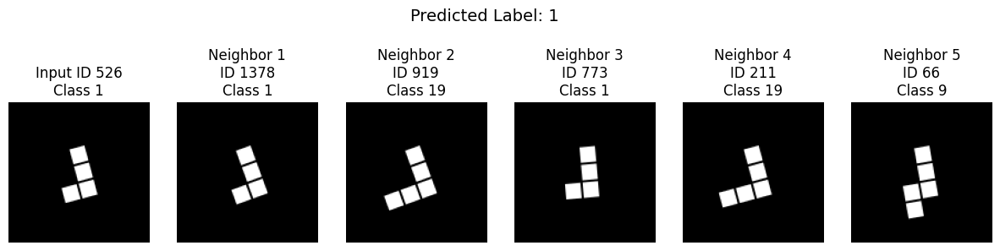

Test Sample 163:
  Image ID: 1357
  True Label: 3
  Predicted Label: 3
  Neighbor IDs: [ 229   33  498 1025  180]
  Neighbor Labels: [3 3 3 4 3]
  Neighbor Distances: [0.03181088 0.03346932 0.12325454 0.13526195 0.14087701]


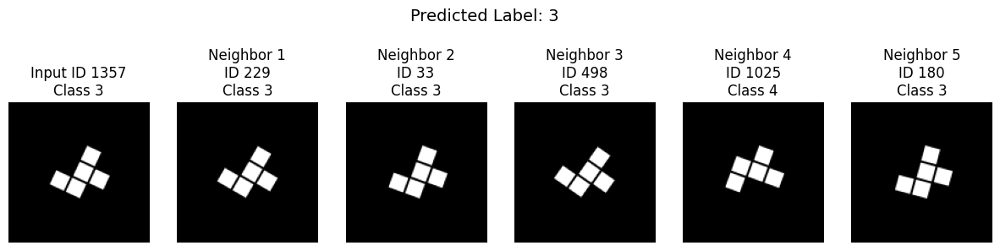

Test Sample 164:
  Image ID: 1568
  True Label: 13
  Predicted Label: 13
  Neighbor IDs: [ 539  166  124 1223  484]
  Neighbor Labels: [13 13 13 13 27]
  Neighbor Distances: [0.02561891 0.04262835 0.08754778 0.10638762 0.1587019 ]


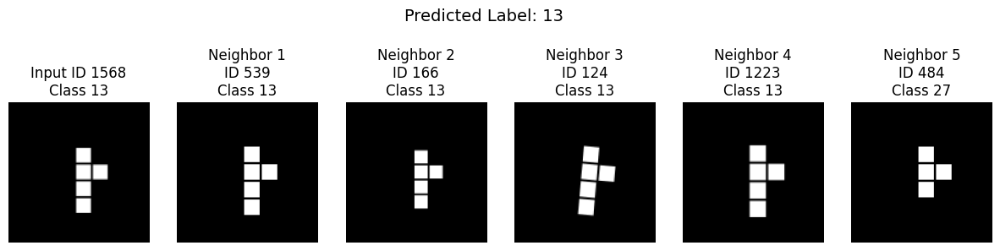

Test Sample 165:
  Image ID: 1186
  True Label: 12
  Predicted Label: 12
  Neighbor IDs: [1156  195  878 1291  742]
  Neighbor Labels: [12 12 12 12 27]
  Neighbor Distances: [0.03393042 0.0476346  0.14086461 0.1488868  0.17606139]


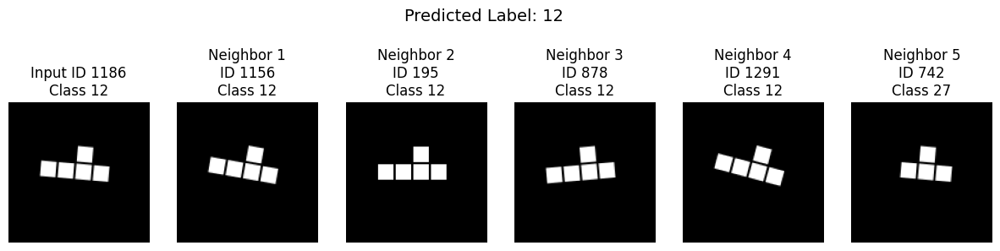

Test Sample 166:
  Image ID: 499
  True Label: 28
  Predicted Label: 28
  Neighbor IDs: [1581   34 1629  283  168]
  Neighbor Labels: [28 28 28 28 28]
  Neighbor Distances: [0.01592797 0.07291591 0.07303476 0.10947597 0.15160382]


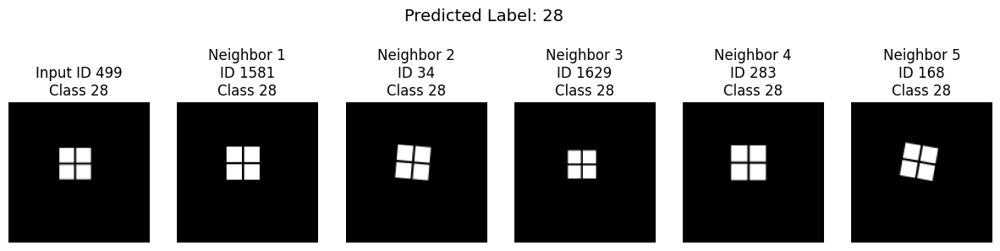

Test Sample 167:
  Image ID: 916
  True Label: 1
  Predicted Label: 1
  Neighbor IDs: [1776 1280  118  860 1145]
  Neighbor Labels: [ 1  1  1 19 19]
  Neighbor Distances: [0.01964927 0.04130679 0.04306757 0.07209116 0.08045506]


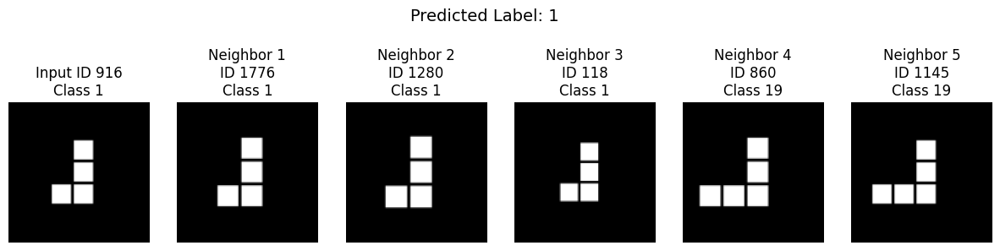

Test Sample 168:
  Image ID: 800
  True Label: 3
  Predicted Label: 3
  Neighbor IDs: [ 624 1762  115 1369 1495]
  Neighbor Labels: [ 3  3  3 27  3]
  Neighbor Distances: [0.03620183 0.06942213 0.1372006  0.20714438 0.21974885]


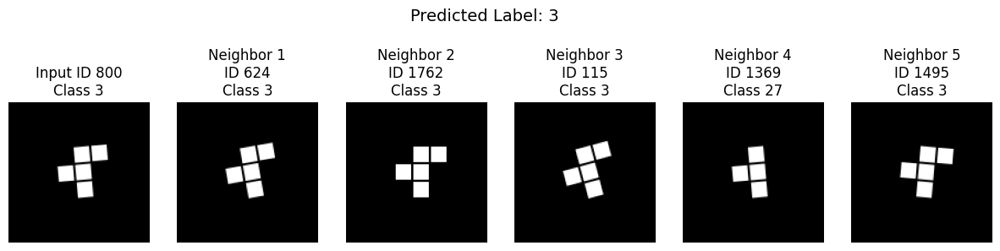

Test Sample 169:
  Image ID: 223
  True Label: 17
  Predicted Label: 17
  Neighbor IDs: [1723 1583 1251 1391  631]
  Neighbor Labels: [17 17 17  2 17]
  Neighbor Distances: [0.03123033 0.04260147 0.15657622 0.15759927 0.16863811]


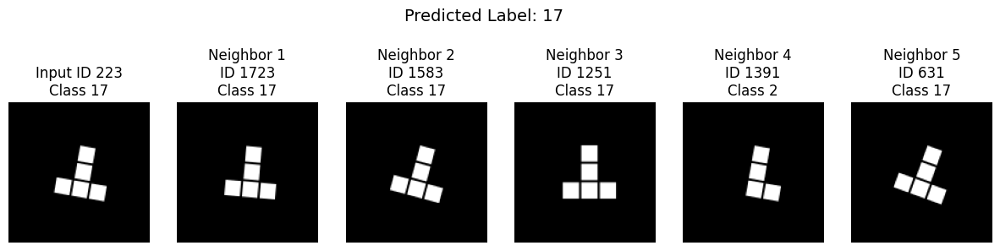

Test Sample 170:
  Image ID: 1760
  True Label: 20
  Predicted Label: 20
  Neighbor IDs: [1648 1607 1554 1028   73]
  Neighbor Labels: [20 20 26 20 26]
  Neighbor Distances: [0.02279449 0.10082269 0.13456422 0.16549617 0.16668147]


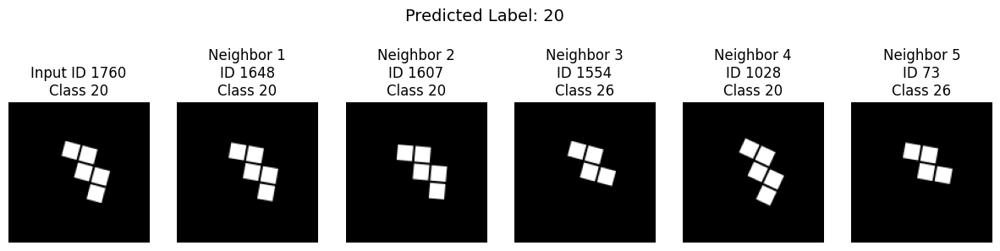

Test Sample 171:
  Image ID: 1546
  True Label: 26
  Predicted Label: 26
  Neighbor IDs: [1554 1782   73  726 1028]
  Neighbor Labels: [26 26 26 26 20]
  Neighbor Distances: [0.0400809  0.0493058  0.12252045 0.16886401 0.18081868]


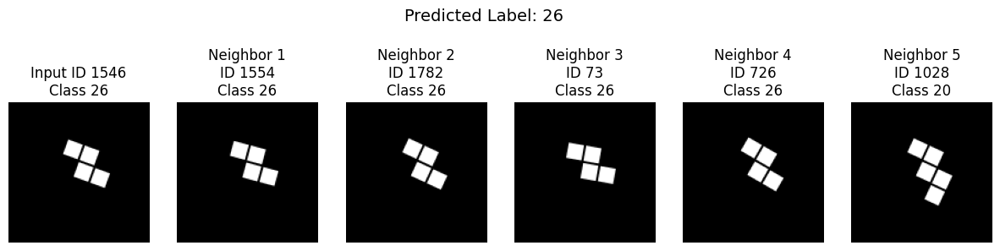

Test Sample 172:
  Image ID: 398
  True Label: 13
  Predicted Label: 27
  Neighbor IDs: [1729  501 1369  492 1762]
  Neighbor Labels: [27 13 27 27  3]
  Neighbor Distances: [0.18030524 0.20512885 0.21246308 0.21660483 0.2928558 ]


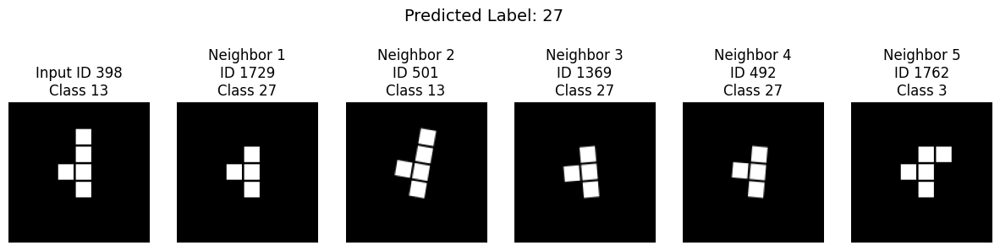

Test Sample 173:
  Image ID: 6
  True Label: 28
  Predicted Label: 28
  Neighbor IDs: [ 769 1480  132 1356 1688]
  Neighbor Labels: [28 28 24 24 28]
  Neighbor Distances: [0.02418661 0.09769744 0.20432824 0.21013486 0.21617448]


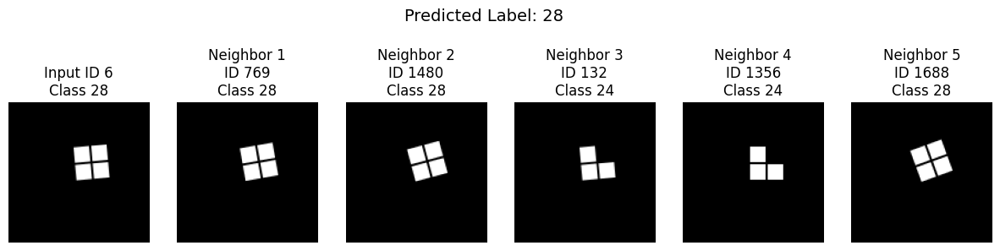

Test Sample 174:
  Image ID: 1628
  True Label: 0
  Predicted Label: 0
  Neighbor IDs: [ 847 1001 1167  765 1405]
  Neighbor Labels: [0 0 0 0 0]
  Neighbor Distances: [0.01899368 0.02320284 0.03717828 0.0390802  0.04229158]


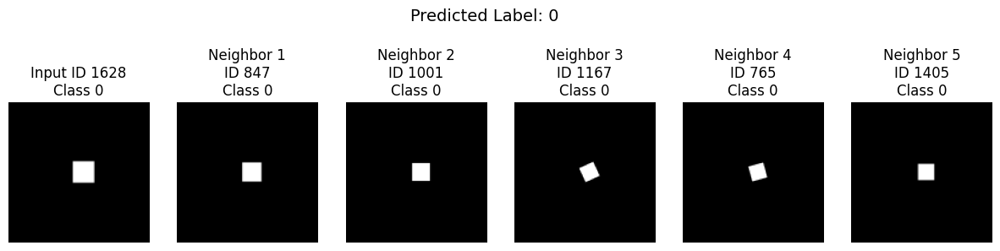

Test Sample 175:
  Image ID: 875
  True Label: 1
  Predicted Label: 1
  Neighbor IDs: [  88 1133  218  951 1689]
  Neighbor Labels: [ 1  1 19  1 19]
  Neighbor Distances: [0.0305227  0.03568089 0.11933607 0.13024372 0.13768685]


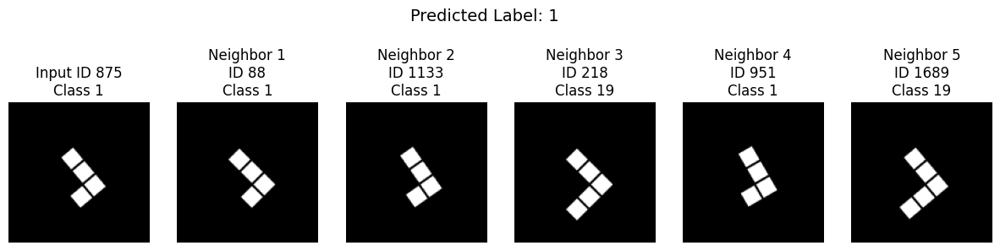

Test Sample 176:
  Image ID: 709
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [ 988 1796  126 1806   16]
  Neighbor Labels: [4 4 4 4 3]
  Neighbor Distances: [0.03994381 0.04702258 0.17331904 0.17520857 0.17962748]


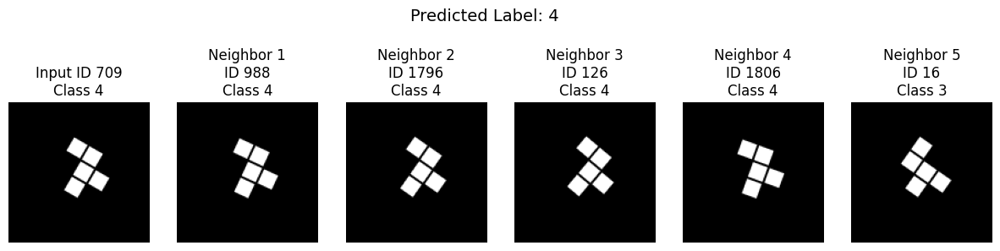

Test Sample 177:
  Image ID: 590
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [ 648 1411  268  891 1788]
  Neighbor Labels: [ 5  5 10  5 29]
  Neighbor Distances: [0.03531176 0.10534751 0.10878372 0.11271048 0.14578617]


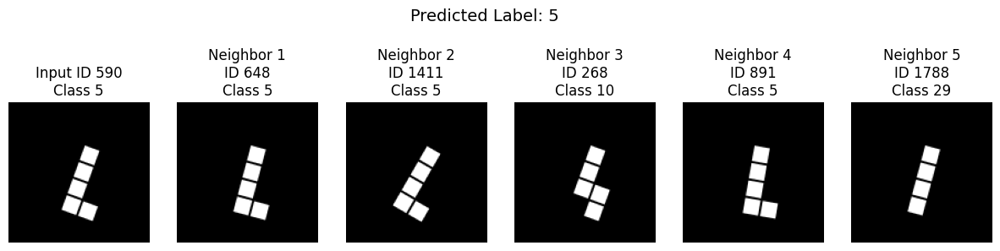

Test Sample 178:
  Image ID: 1322
  True Label: 6
  Predicted Label: 6
  Neighbor IDs: [1065  808 1861  737  955]
  Neighbor Labels: [ 6  6  6  6 29]
  Neighbor Distances: [0.01679111 0.01857519 0.0682348  0.08598471 0.1021291 ]


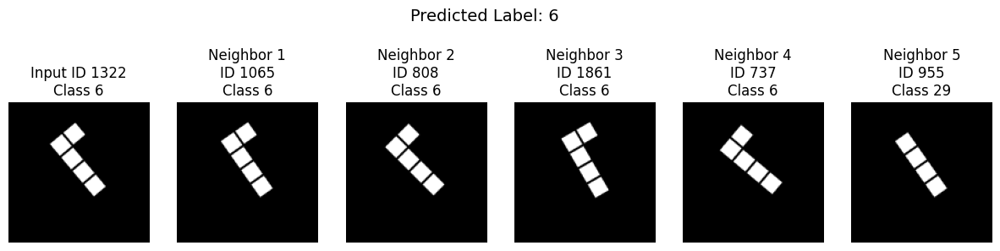

Test Sample 179:
  Image ID: 1073
  True Label: 16
  Predicted Label: 16
  Neighbor IDs: [1276 1588  910  517  859]
  Neighbor Labels: [16 16 16 16 29]
  Neighbor Distances: [0.0245012  0.02718669 0.09307259 0.09648979 0.15211117]


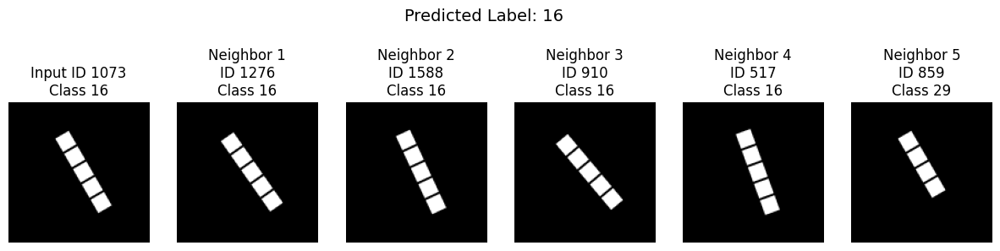

Test Sample 180:
  Image ID: 969
  True Label: 29
  Predicted Label: 29
  Neighbor IDs: [1274  423 1639  982 1305]
  Neighbor Labels: [29  6 29 29  6]
  Neighbor Distances: [0.03249776 0.09284699 0.1115157  0.11803138 0.12147087]


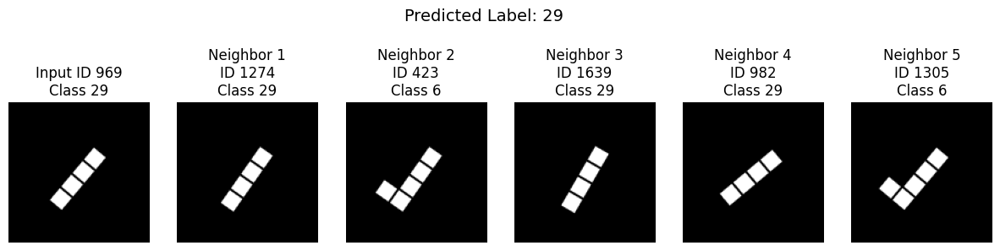

Test Sample 181:
  Image ID: 1428
  True Label: 18
  Predicted Label: 17
  Neighbor IDs: [1791  949 1750  684  354]
  Neighbor Labels: [18 18 17  6 17]
  Neighbor Distances: [0.03653175 0.03882533 0.28237355 0.3064263  0.3107332 ]


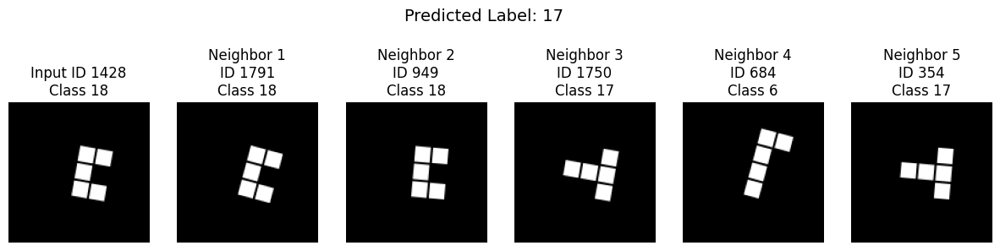

Test Sample 182:
  Image ID: 764
  True Label: 11
  Predicted Label: 11
  Neighbor IDs: [ 871   55 1204 1202 1642]
  Neighbor Labels: [11 11 11 22 22]
  Neighbor Distances: [0.04489708 0.10197997 0.13011146 0.1902796  0.19192922]


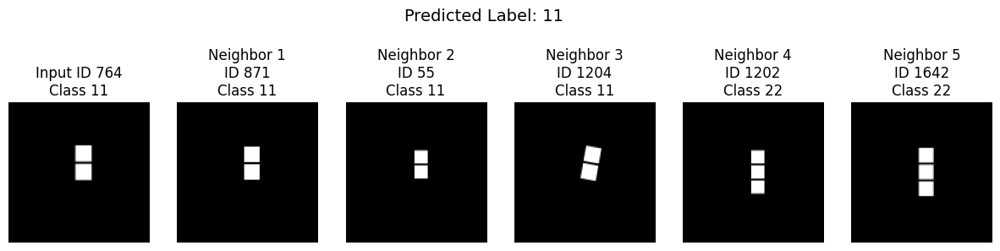

Test Sample 183:
  Image ID: 1649
  True Label: 19
  Predicted Label: 19
  Neighbor IDs: [ 682  521 1457  349 1058]
  Neighbor Labels: [19 19 19  1  7]
  Neighbor Distances: [0.02862138 0.03413522 0.11219269 0.13679242 0.15059876]


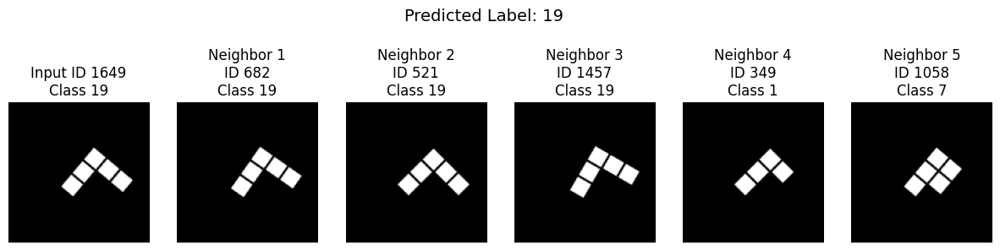

Test Sample 184:
  Image ID: 297
  True Label: 14
  Predicted Label: 14
  Neighbor IDs: [1761  457  240  201 1506]
  Neighbor Labels: [14 14 20  1 14]
  Neighbor Distances: [0.05346531 0.05391228 0.14568347 0.16111481 0.16208428]


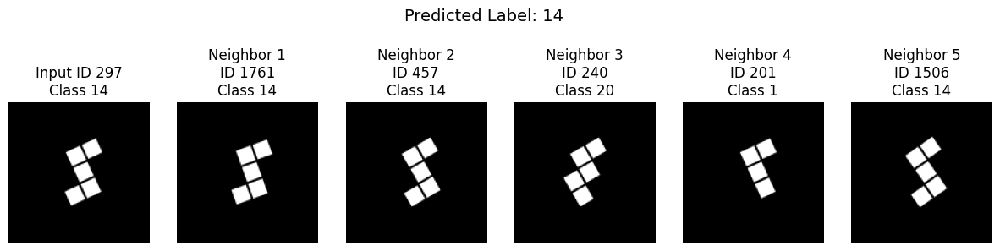

Test Sample 185:
  Image ID: 1650
  True Label: 7
  Predicted Label: 7
  Neighbor IDs: [609 431  58 753 986]
  Neighbor Labels: [ 7  7 19 19  7]
  Neighbor Distances: [0.04733205 0.05179971 0.11379284 0.13532388 0.15482378]


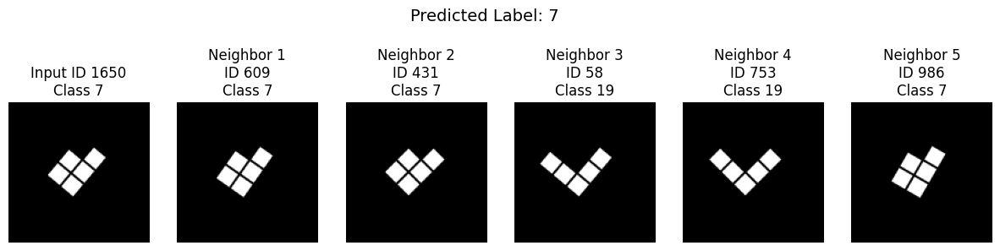

Test Sample 186:
  Image ID: 958
  True Label: 25
  Predicted Label: 25
  Neighbor IDs: [  57 1534  370 1419  108]
  Neighbor Labels: [25 25 25 25 20]
  Neighbor Distances: [0.03060007 0.03197181 0.126086   0.13254249 0.18563652]


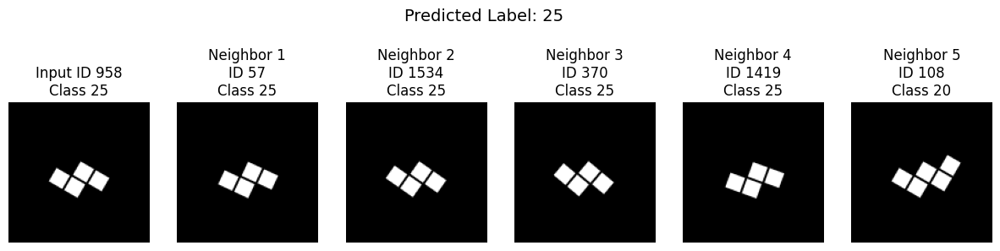

Test Sample 187:
  Image ID: 1886
  True Label: 25
  Predicted Label: 25
  Neighbor IDs: [1765 1225 1419 1768  466]
  Neighbor Labels: [25 25 25 25 20]
  Neighbor Distances: [0.02538031 0.03522068 0.13271737 0.14790463 0.16194302]


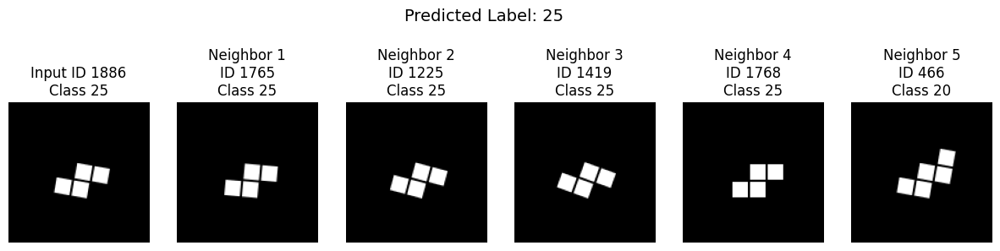

Test Sample 188:
  Image ID: 1455
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [1731 1670  965 1527 1770]
  Neighbor Labels: [ 5  5  5  6 10]
  Neighbor Distances: [0.01967275 0.02482098 0.08165997 0.13469625 0.13806355]


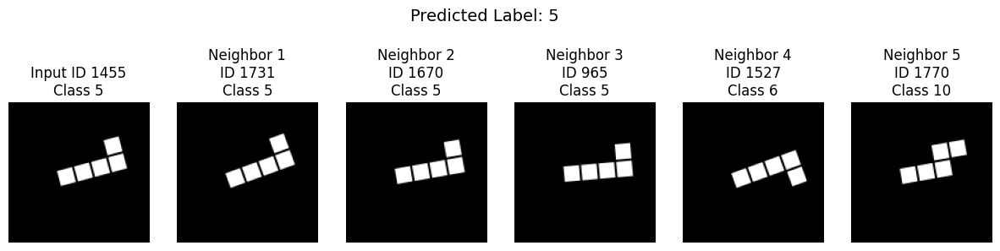

Test Sample 189:
  Image ID: 340
  True Label: 19
  Predicted Label: 19
  Neighbor IDs: [ 218 1043 1689   88 1208]
  Neighbor Labels: [19 19 19  1  7]
  Neighbor Distances: [0.03131962 0.1242702  0.127559   0.13784343 0.14572763]


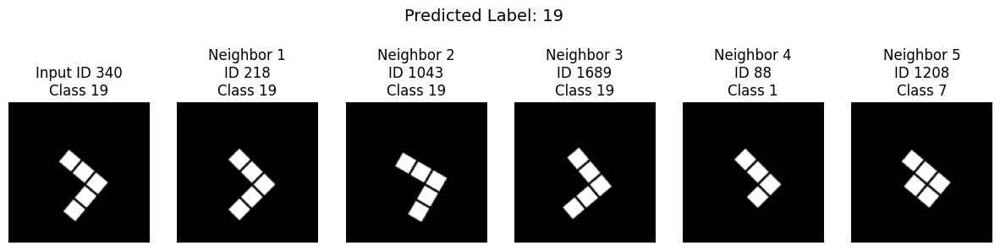

Test Sample 190:
  Image ID: 530
  True Label: 19
  Predicted Label: 19
  Neighbor IDs: [1032  614 1891 1875  134]
  Neighbor Labels: [19 19 19  1 19]
  Neighbor Distances: [0.02988565 0.03138125 0.11965859 0.14351428 0.16874748]


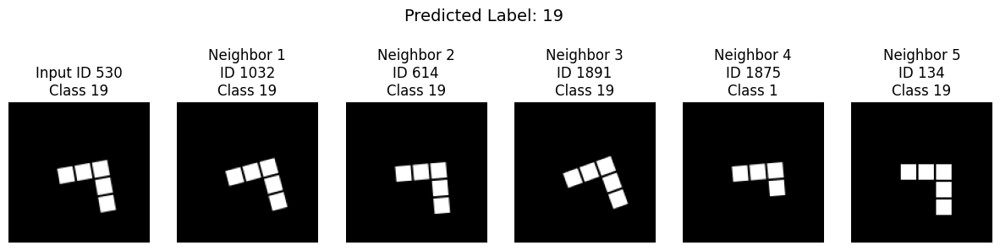

Test Sample 191:
  Image ID: 1183
  True Label: 8
  Predicted Label: 8
  Neighbor IDs: [1496  581  973  996 1011]
  Neighbor Labels: [ 8  8  8  8 28]
  Neighbor Distances: [0.03710431 0.04363441 0.13976932 0.15416545 0.18117726]


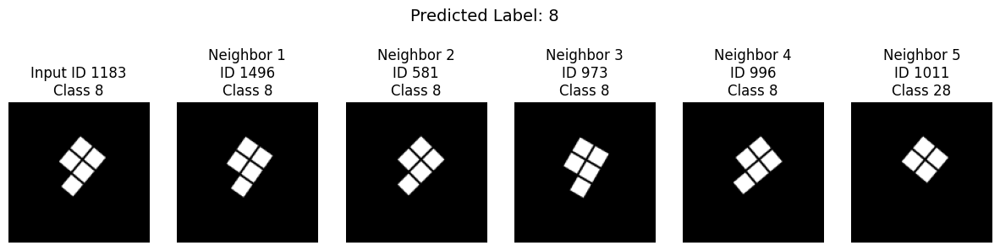

Test Sample 192:
  Image ID: 1197
  True Label: 12
  Predicted Label: 12
  Neighbor IDs: [1542 1046 1017 1857 1511]
  Neighbor Labels: [12 12 12 12 12]
  Neighbor Distances: [0.03427386 0.04701436 0.0546698  0.07976675 0.09706312]


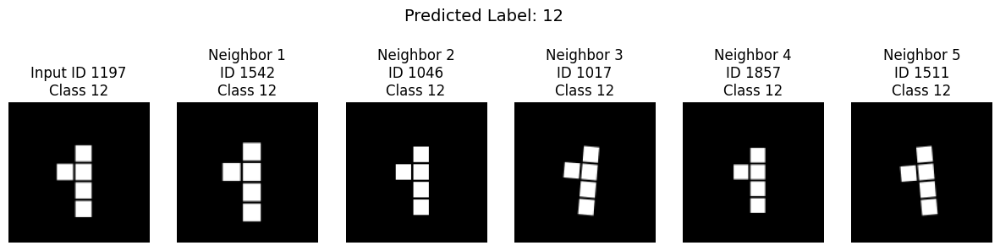

Test Sample 193:
  Image ID: 1661
  True Label: 25
  Predicted Label: 25
  Neighbor IDs: [ 944  196  309 1028  259]
  Neighbor Labels: [25 25 25 20 24]
  Neighbor Distances: [0.03312963 0.03934717 0.12388921 0.1472618  0.17945981]


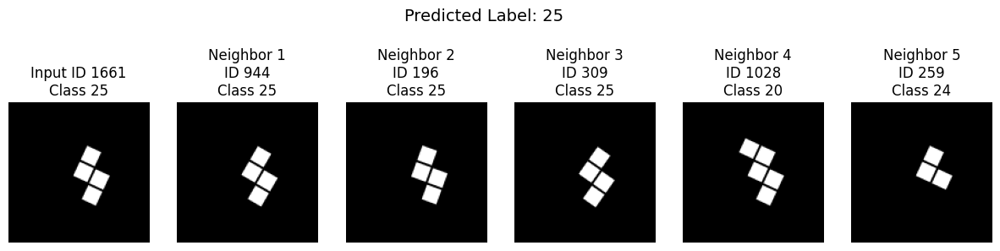

Test Sample 194:
  Image ID: 162
  True Label: 11
  Predicted Label: 11
  Neighbor IDs: [  65 1107 1578 1686 1241]
  Neighbor Labels: [11 11 11 11 11]
  Neighbor Distances: [0.01301026 0.01538551 0.04587424 0.05885428 0.08892548]


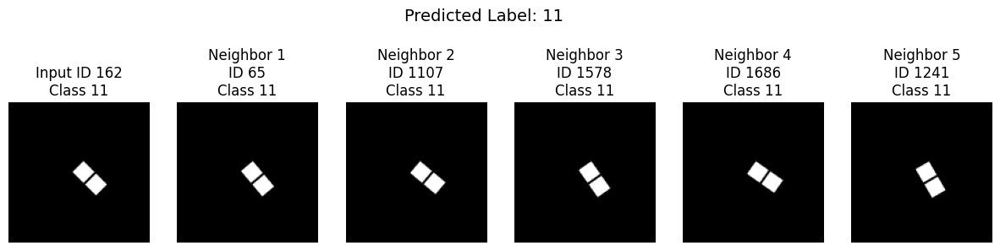

Test Sample 195:
  Image ID: 1408
  True Label: 6
  Predicted Label: 6
  Neighbor IDs: [ 339  845  393 1593  543]
  Neighbor Labels: [6 6 6 9 6]
  Neighbor Distances: [0.02648222 0.03113288 0.09223437 0.11064172 0.11239588]


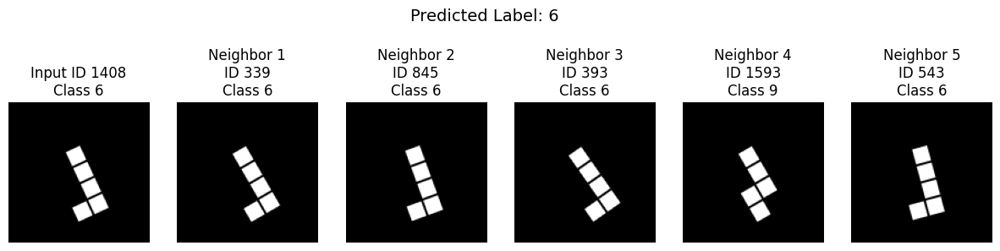

Test Sample 196:
  Image ID: 504
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [ 40 270  87 272 778]
  Neighbor Labels: [5 5 5 5 5]
  Neighbor Distances: [0.02434415 0.05265975 0.07767481 0.09543157 0.13141549]


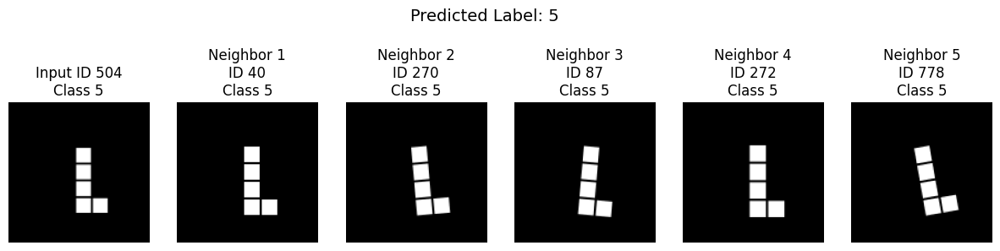

Test Sample 197:
  Image ID: 619
  True Label: 28
  Predicted Label: 28
  Neighbor IDs: [ 116   48 1022  283   39]
  Neighbor Labels: [28 28 28 28 18]
  Neighbor Distances: [0.02883154 0.03892493 0.05000514 0.16780287 0.2873091 ]


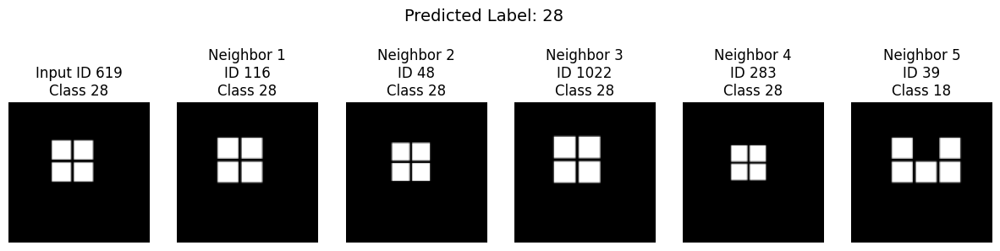

Test Sample 198:
  Image ID: 727
  True Label: 7
  Predicted Label: 7
  Neighbor IDs: [ 677 1170 1658 1013  721]
  Neighbor Labels: [ 7  7  7 26  7]
  Neighbor Distances: [0.0317421  0.03939903 0.13058734 0.170057   0.17453235]


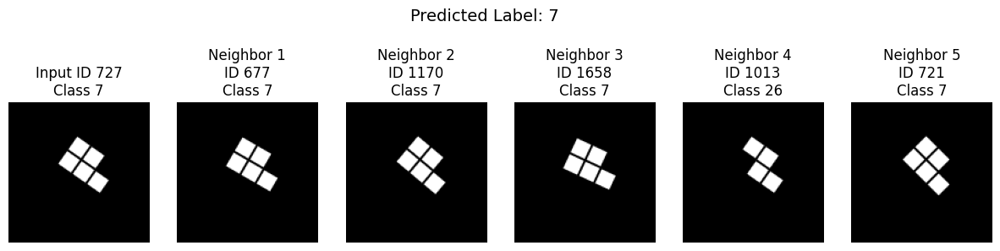

Test Sample 199:
  Image ID: 1424
  True Label: 0
  Predicted Label: 0
  Neighbor IDs: [ 945 1297 1864  440 1852]
  Neighbor Labels: [0 0 0 0 0]
  Neighbor Distances: [0.00300884 0.01083505 0.02025443 0.02095717 0.02872187]


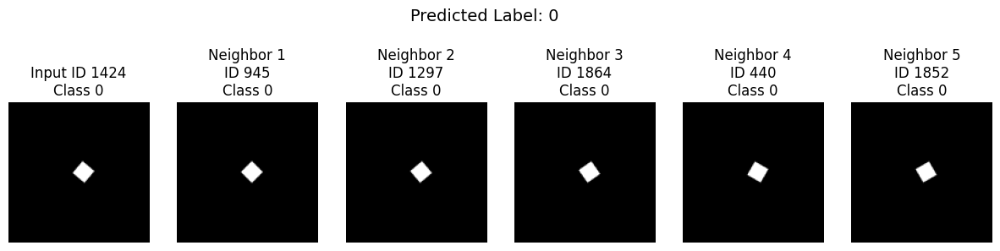

Test Sample 200:
  Image ID: 1416
  True Label: 6
  Predicted Label: 6
  Neighbor IDs: [ 289 1861 1203  943 1090]
  Neighbor Labels: [6 6 6 9 9]
  Neighbor Distances: [0.02611446 0.0921042  0.09360051 0.14014262 0.14660382]


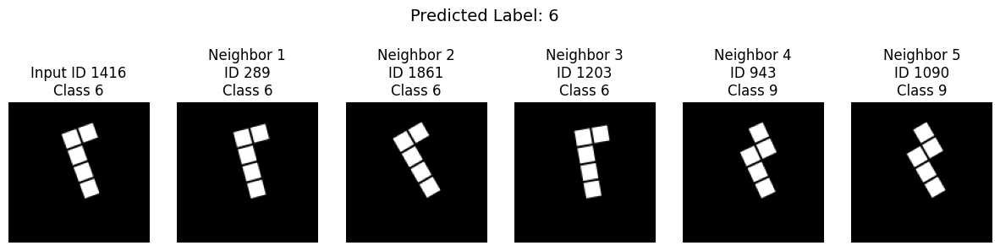

Test Sample 201:
  Image ID: 1387
  True Label: 29
  Predicted Label: 29
  Neighbor IDs: [997  85 975 897  40]
  Neighbor Labels: [29 29 29  6  5]
  Neighbor Distances: [0.02317852 0.05503511 0.07862914 0.12687004 0.13283277]


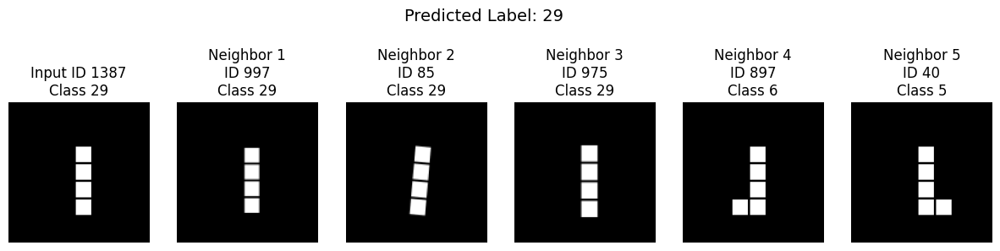

Test Sample 202:
  Image ID: 8
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [323 629 502 459 306]
  Neighbor Labels: [9 9 6 9 6]
  Neighbor Distances: [0.02618617 0.03408372 0.11208528 0.11244452 0.12203431]


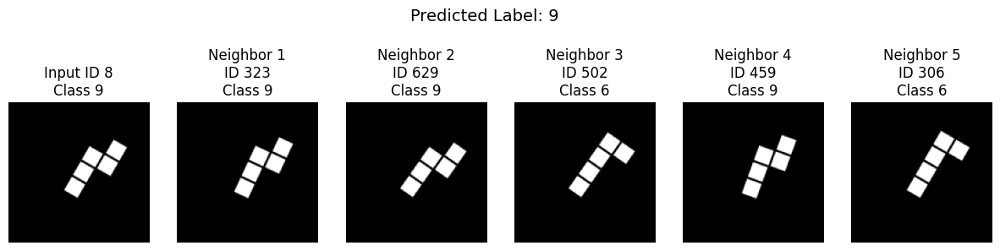

Test Sample 203:
  Image ID: 1773
  True Label: 15
  Predicted Label: 15
  Neighbor IDs: [1826 1123 1323  987  719]
  Neighbor Labels: [15 15 15 15 15]
  Neighbor Distances: [0.04101098 0.06599271 0.07822353 0.10790104 0.13700235]


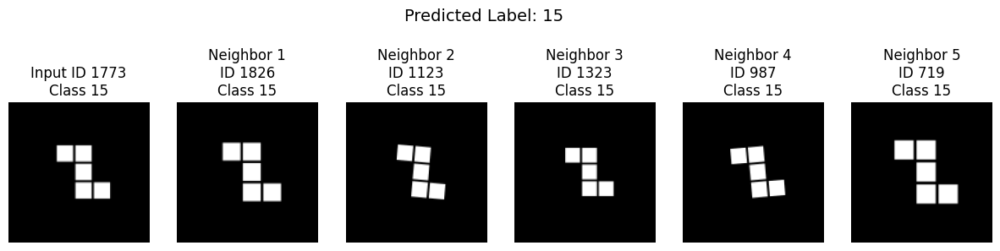

Test Sample 204:
  Image ID: 902
  True Label: 6
  Predicted Label: 6
  Neighbor IDs: [1228  417 1544  320 1250]
  Neighbor Labels: [ 6  6  9 29 29]
  Neighbor Distances: [0.03152573 0.04363143 0.09935051 0.11739922 0.13307416]


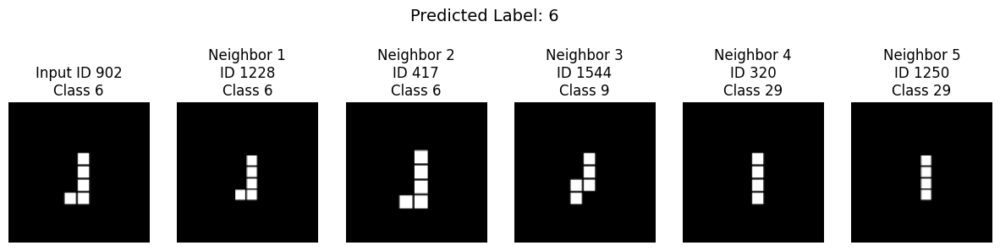

Test Sample 205:
  Image ID: 1809
  True Label: 24
  Predicted Label: 24
  Neighbor IDs: [1113  716  562 1585  370]
  Neighbor Labels: [24 24 24 24 25]
  Neighbor Distances: [0.028633   0.03201604 0.10724747 0.11728334 0.18489414]


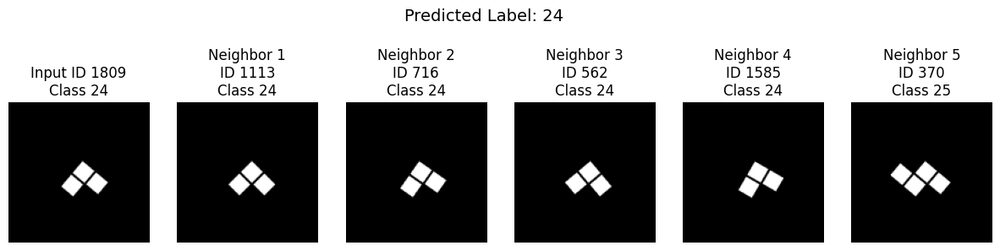

Test Sample 206:
  Image ID: 78
  True Label: 6
  Predicted Label: 6
  Neighbor IDs: [1756  684  306 1735 1257]
  Neighbor Labels: [6 6 6 6 5]
  Neighbor Distances: [0.02790201 0.03445232 0.09448165 0.09629369 0.12309051]


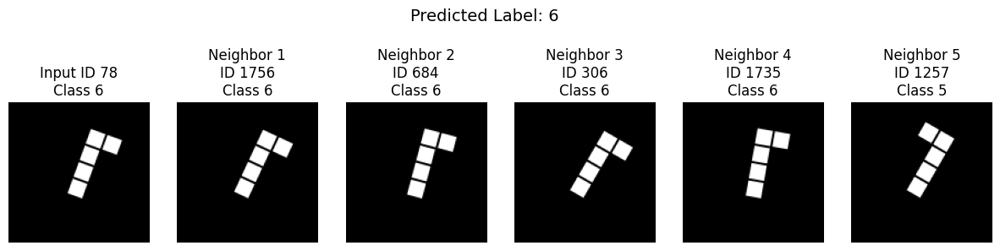

Test Sample 207:
  Image ID: 1625
  True Label: 13
  Predicted Label: 13
  Neighbor IDs: [1845  746    7  563   77]
  Neighbor Labels: [13 13 13 27 27]
  Neighbor Distances: [0.03796172 0.11729699 0.13074744 0.17978525 0.18019116]


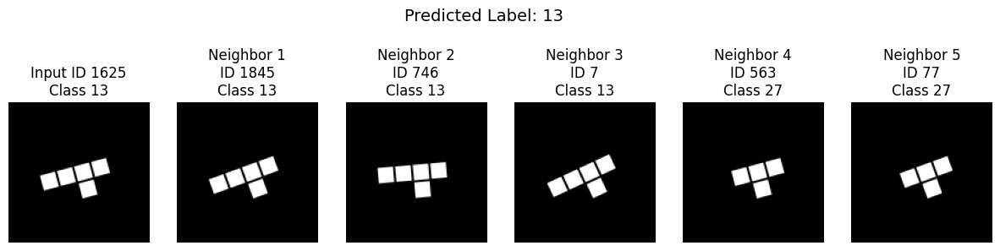

Test Sample 208:
  Image ID: 1573
  True Label: 16
  Predicted Label: 16
  Neighbor IDs: [1168  610  123  972  423]
  Neighbor Labels: [16 16 16 16  6]
  Neighbor Distances: [0.02344286 0.02368772 0.09524339 0.1102187  0.14670748]


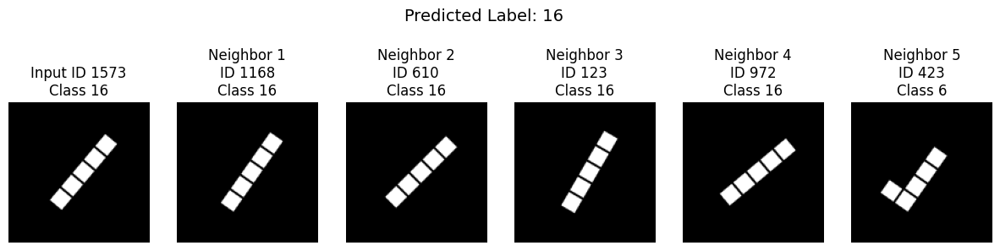

Test Sample 209:
  Image ID: 164
  True Label: 12
  Predicted Label: 12
  Neighbor IDs: [ 519  867 1227  227 1389]
  Neighbor Labels: [12 12 12 27 27]
  Neighbor Distances: [0.03996646 0.04609984 0.1551714  0.18245786 0.19780105]


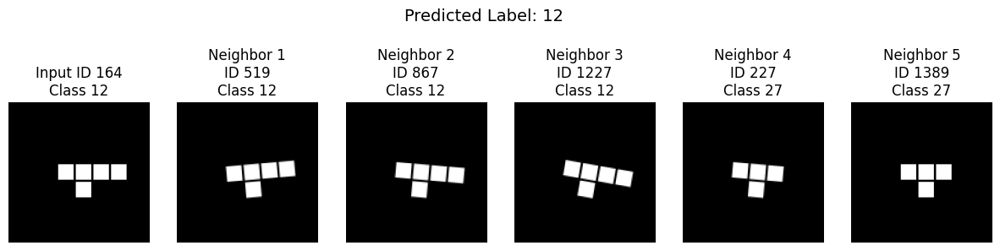

Test Sample 210:
  Image ID: 1242
  True Label: 2
  Predicted Label: 2
  Neighbor IDs: [ 117 1127  226 1237  599]
  Neighbor Labels: [ 2  2 17 17 10]
  Neighbor Distances: [0.00667262 0.06105936 0.09306371 0.10727477 0.11711228]


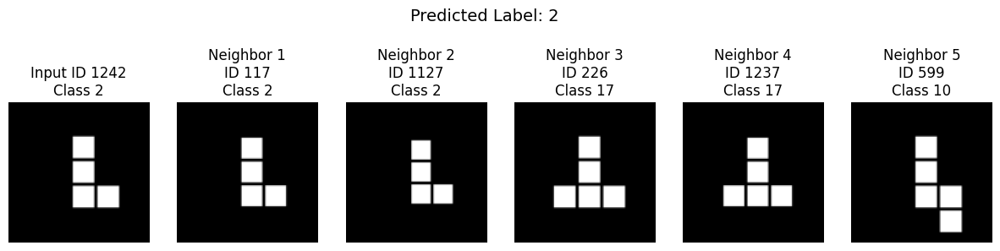

Test Sample 211:
  Image ID: 480
  True Label: 7
  Predicted Label: 7
  Neighbor IDs: [1575  329 1889   34  283]
  Neighbor Labels: [ 7  7  7 28 28]
  Neighbor Distances: [0.03247726 0.07525659 0.13200212 0.1802041  0.1930238 ]


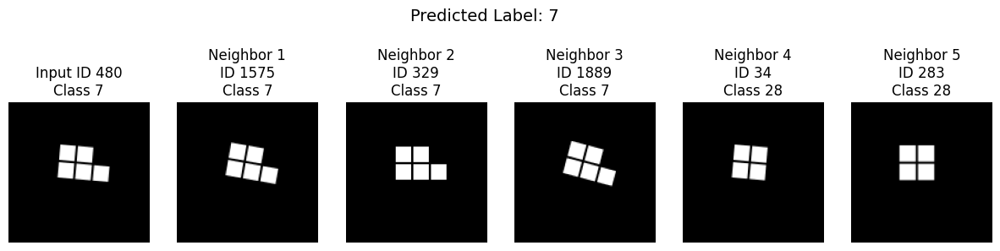

Test Sample 212:
  Image ID: 205
  True Label: 7
  Predicted Label: 7
  Neighbor IDs: [ 463  670  683 1704 1881]
  Neighbor Labels: [ 7  7  7 27  8]
  Neighbor Distances: [0.03505957 0.04249483 0.16212249 0.17299521 0.1785959 ]


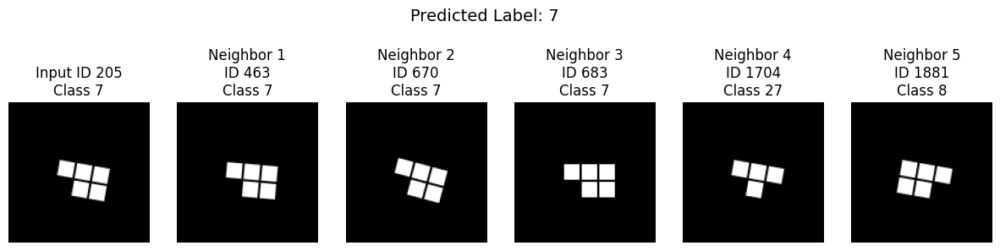

Test Sample 213:
  Image ID: 1231
  True Label: 18
  Predicted Label: 18
  Neighbor IDs: [1654  421 1791  710   15]
  Neighbor Labels: [18 18 18 14 17]
  Neighbor Distances: [0.03208733 0.11735725 0.17506242 0.2502383  0.26374257]


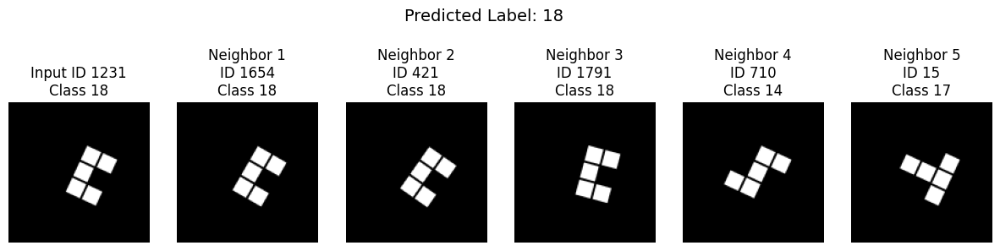

Test Sample 214:
  Image ID: 361
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [1541  352  813 1065  735]
  Neighbor Labels: [9 9 9 6 9]
  Neighbor Distances: [0.02078009 0.03519762 0.08281374 0.0921464  0.11182773]


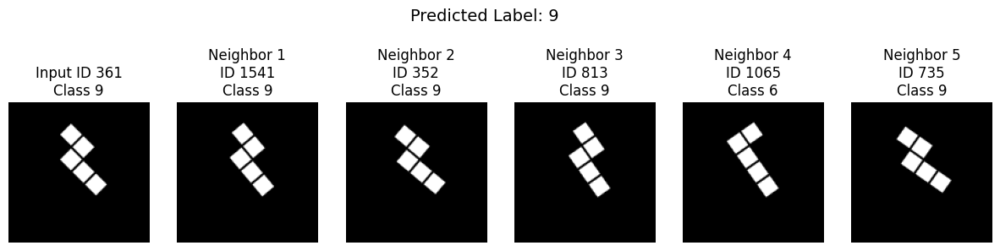

Test Sample 215:
  Image ID: 300
  True Label: 14
  Predicted Label: 20
  Neighbor IDs: [ 743  432 1236  458 1500]
  Neighbor Labels: [14 14 20 20 20]
  Neighbor Distances: [0.0407837  0.05162156 0.12375683 0.12498331 0.13054562]


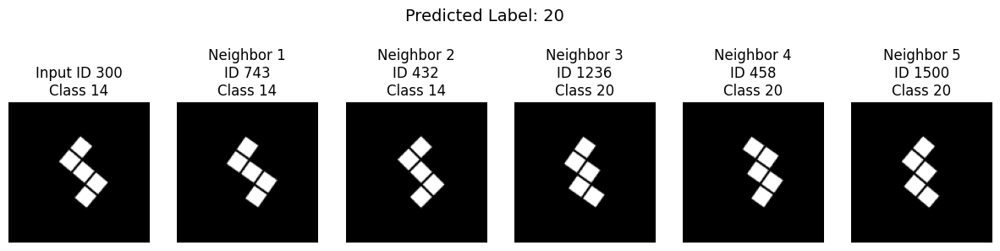

Test Sample 216:
  Image ID: 74
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [1710  510  344  400 1269]
  Neighbor Labels: [ 4  4  3  4 27]
  Neighbor Distances: [0.03926468 0.04186094 0.14510047 0.14635468 0.15424901]


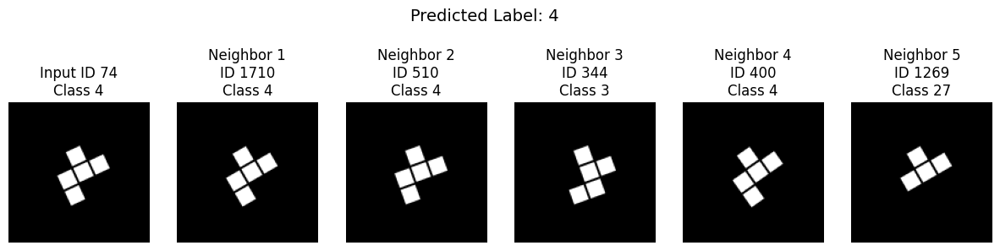

Test Sample 217:
  Image ID: 637
  True Label: 26
  Predicted Label: 26
  Neighbor IDs: [1846  572  422 1655 1481]
  Neighbor Labels: [26 26 26 20 26]
  Neighbor Distances: [0.02893806 0.04186237 0.11403221 0.16002727 0.17048323]


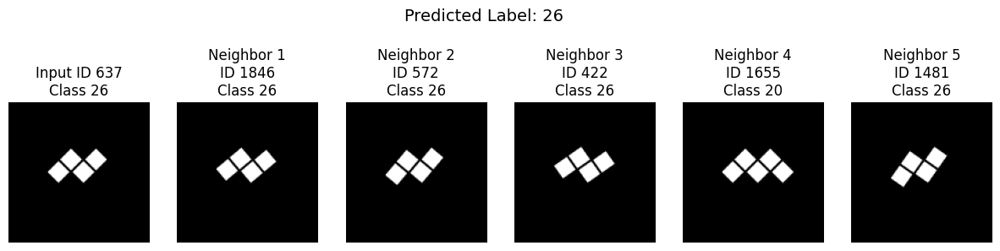

Test Sample 218:
  Image ID: 29
  True Label: 18
  Predicted Label: 18
  Neighbor IDs: [ 206  703  848  210 1249]
  Neighbor Labels: [18 18 18 18  9]
  Neighbor Distances: [0.03294206 0.0499233  0.12675071 0.16595137 0.20978737]


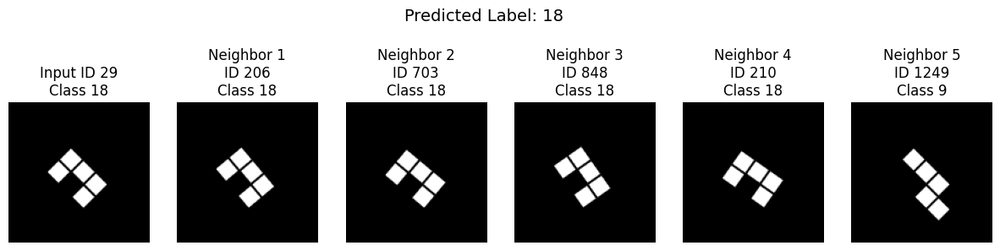

Test Sample 219:
  Image ID: 774
  True Label: 7
  Predicted Label: 7
  Neighbor IDs: [1085  237 1058 1733  948]
  Neighbor Labels: [7 7 7 7 1]
  Neighbor Distances: [0.02885586 0.04049259 0.12290156 0.14503133 0.16210008]


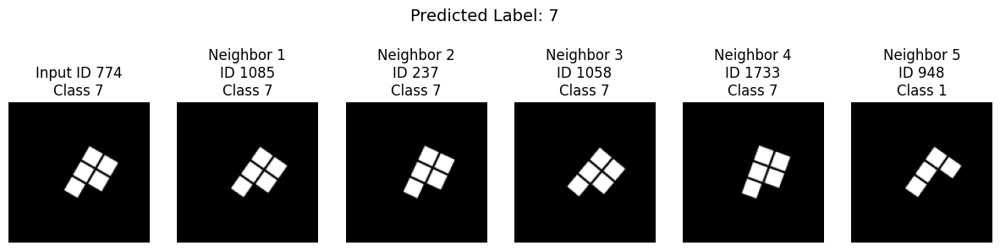

Test Sample 220:
  Image ID: 1347
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [1498  962 1461  318 1453]
  Neighbor Labels: [9 9 9 9 6]
  Neighbor Distances: [0.02451032 0.03292096 0.09409797 0.11126399 0.12103617]


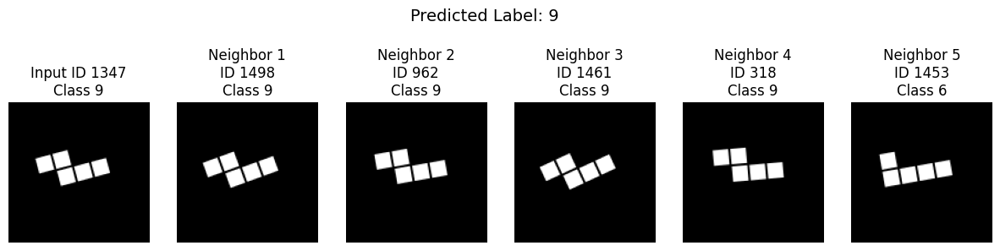

Test Sample 221:
  Image ID: 525
  True Label: 11
  Predicted Label: 11
  Neighbor IDs: [1838  100 1741  220  451]
  Neighbor Labels: [11 11 11 11 11]
  Neighbor Distances: [0.00987887 0.01231849 0.04447007 0.04717243 0.11849833]


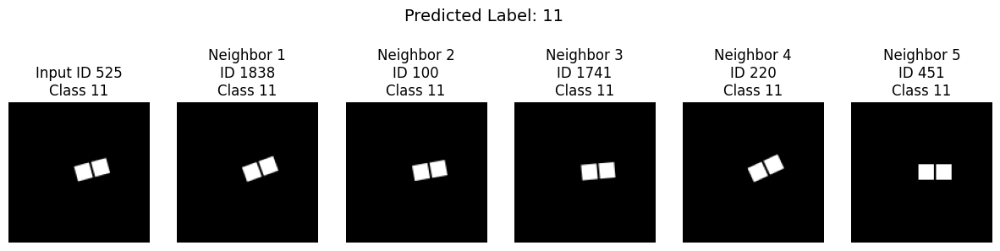

Test Sample 222:
  Image ID: 481
  True Label: 20
  Predicted Label: 20
  Neighbor IDs: [ 458 1884 1789  592  309]
  Neighbor Labels: [20 20 25 26 25]
  Neighbor Distances: [0.03210634 0.12085962 0.13771725 0.14143622 0.15192783]


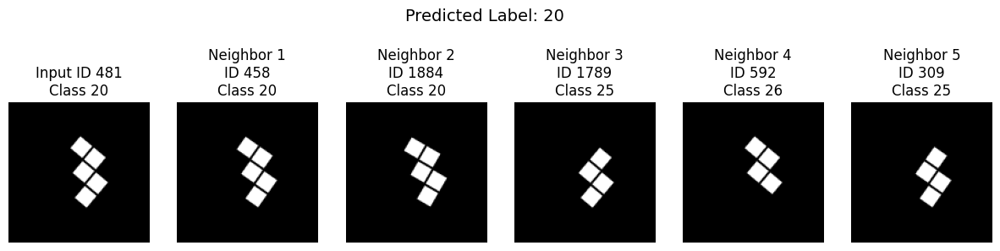

Test Sample 223:
  Image ID: 1646
  True Label: 26
  Predicted Label: 26
  Neighbor IDs: [1727  422  222  817  447]
  Neighbor Labels: [26 26 26 20  7]
  Neighbor Distances: [0.02744389 0.08017993 0.11531591 0.17666614 0.1912229 ]


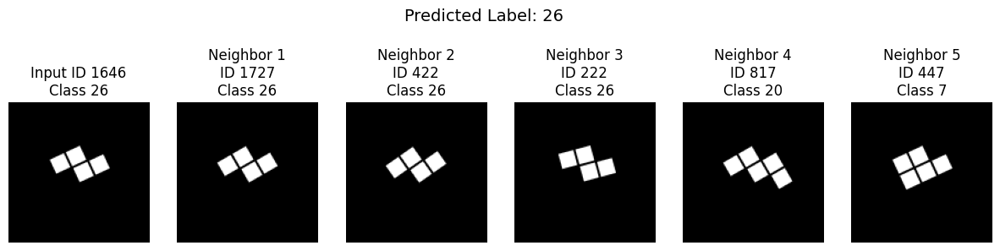

Test Sample 224:
  Image ID: 701
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [ 304  139  301 1597 1762]
  Neighbor Labels: [ 4  4  4 10  3]
  Neighbor Distances: [0.03734875 0.04239905 0.14474499 0.25685203 0.25966394]


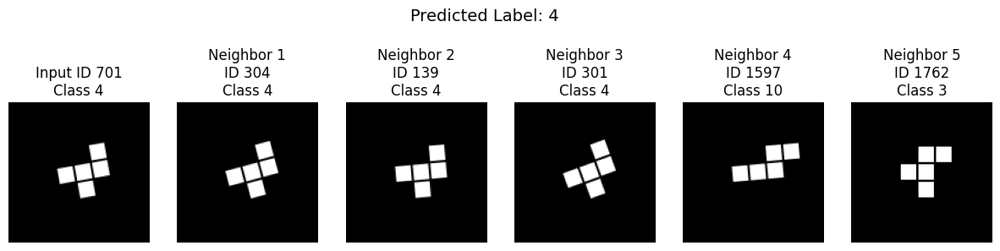

Test Sample 225:
  Image ID: 287
  True Label: 10
  Predicted Label: 10
  Neighbor IDs: [491 663 448 461 665]
  Neighbor Labels: [10 10  5  5 10]
  Neighbor Distances: [0.0268743  0.03169131 0.08254647 0.09780735 0.10637927]


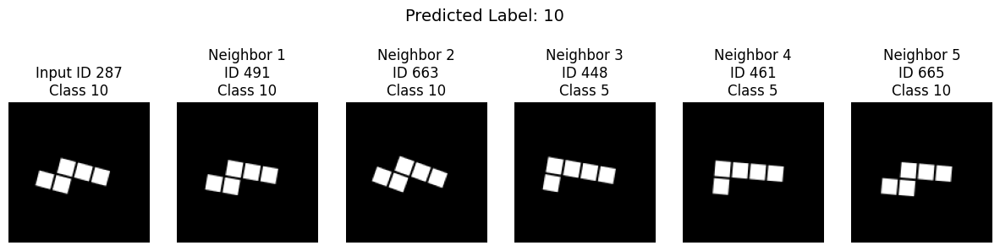

Test Sample 226:
  Image ID: 194
  True Label: 12
  Predicted Label: 12
  Neighbor IDs: [ 656 1102 1266 1614  248]
  Neighbor Labels: [12 12 12 27  3]
  Neighbor Distances: [0.03073502 0.03457797 0.14006507 0.18389446 0.2318024 ]


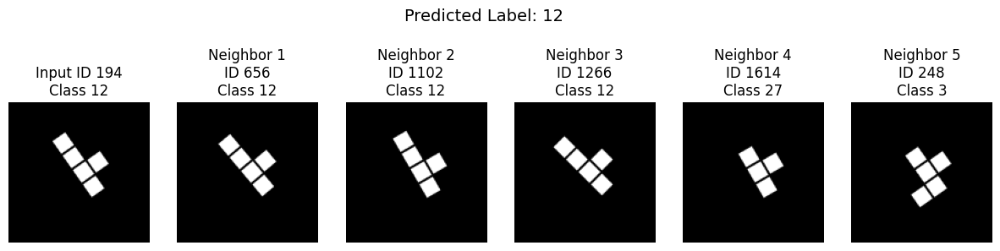

Test Sample 227:
  Image ID: 1713
  True Label: 8
  Predicted Label: 8
  Neighbor IDs: [ 717  744 1775 1441 1057]
  Neighbor Labels: [8 8 8 8 2]
  Neighbor Distances: [0.03063357 0.03685451 0.13275313 0.15533364 0.19675666]


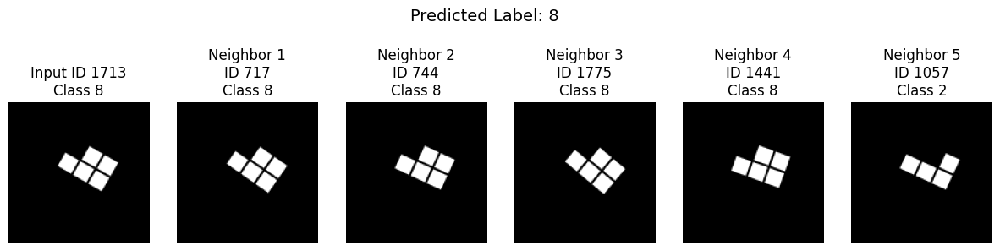

Test Sample 228:
  Image ID: 189
  True Label: 24
  Predicted Label: 24
  Neighbor IDs: [ 414 1585  716  998 1419]
  Neighbor Labels: [24 24 24 24 25]
  Neighbor Distances: [0.02903235 0.03437674 0.12145406 0.13206702 0.19955754]


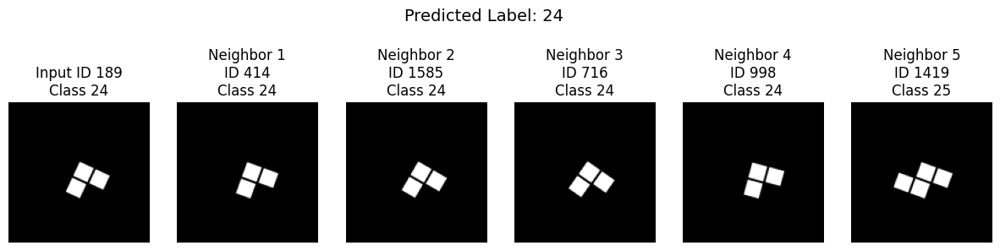

Test Sample 229:
  Image ID: 1836
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [ 141  778 1379  339  467]
  Neighbor Labels: [ 5  5  5  6 10]
  Neighbor Distances: [0.02234483 0.07897162 0.10705721 0.16090828 0.1768676 ]


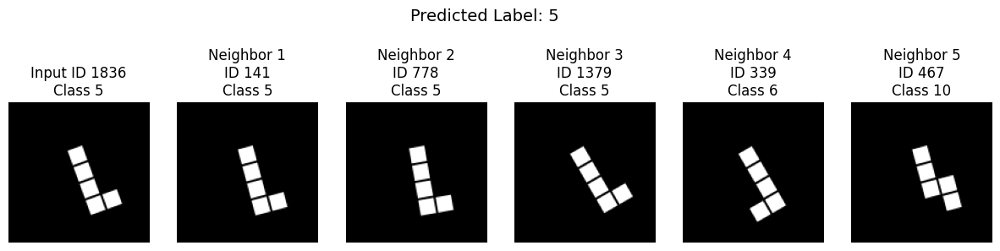

Test Sample 230:
  Image ID: 208
  True Label: 17
  Predicted Label: 17
  Neighbor IDs: [1752  204  177 1601  841]
  Neighbor Labels: [17 17 17 17  2]
  Neighbor Distances: [0.04340518 0.06386429 0.1179769  0.1519121  0.15952837]


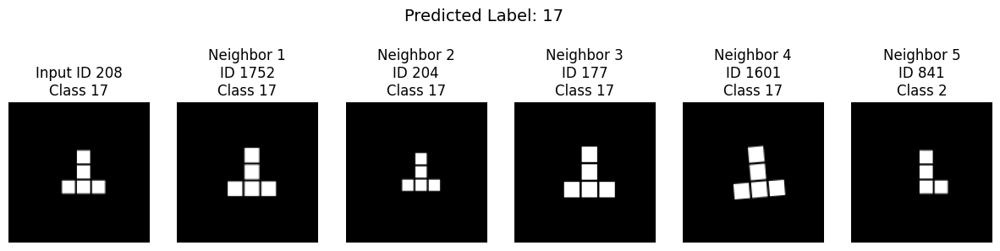

Test Sample 231:
  Image ID: 1526
  True Label: 27
  Predicted Label: 27
  Neighbor IDs: [1704 1737 1507 1881  227]
  Neighbor Labels: [27 27  8  8 27]
  Neighbor Distances: [0.04797322 0.05968213 0.132851   0.14783275 0.16332924]


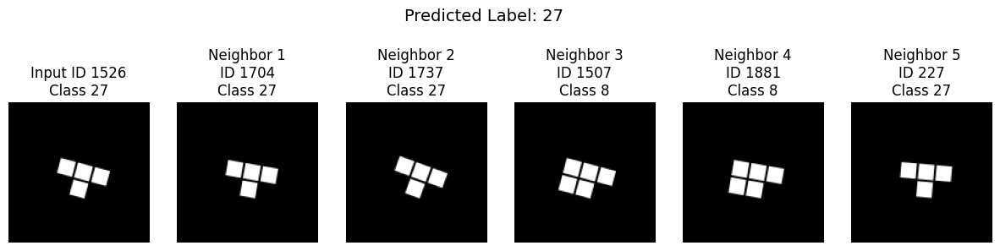

Test Sample 232:
  Image ID: 1293
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [ 909  929 1226 1718 1299]
  Neighbor Labels: [ 5  5  5 10 10]
  Neighbor Distances: [0.02356499 0.09938538 0.11757898 0.14279729 0.1556179 ]


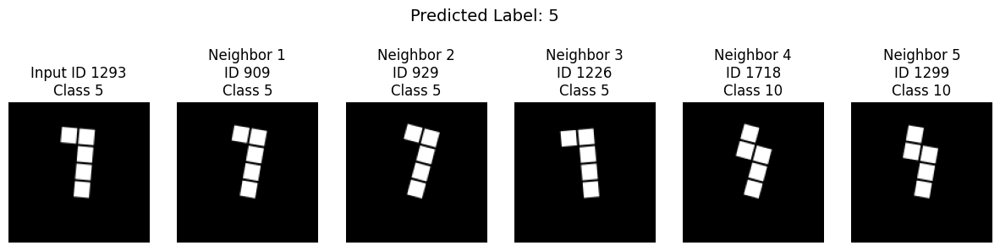

Test Sample 233:
  Image ID: 1504
  True Label: 2
  Predicted Label: 2
  Neighbor IDs: [ 445 1301 1708  315 1363]
  Neighbor Labels: [ 2  2  2  2 10]
  Neighbor Distances: [0.02266395 0.03048944 0.11152118 0.12126517 0.13015705]


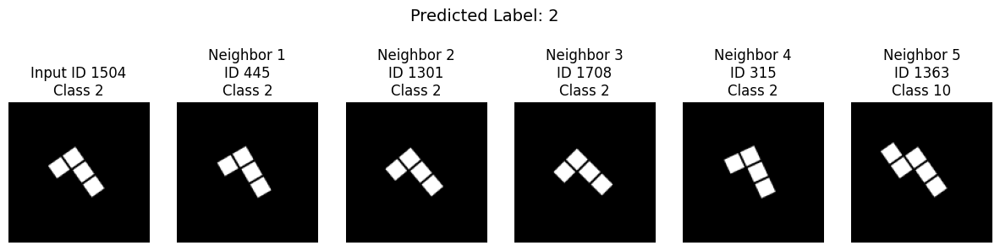

Test Sample 234:
  Image ID: 914
  True Label: 6
  Predicted Label: 6
  Neighbor IDs: [ 567 1351  915  321  930]
  Neighbor Labels: [6 6 6 5 5]
  Neighbor Distances: [0.02052319 0.02239299 0.0833295  0.13955194 0.14600146]


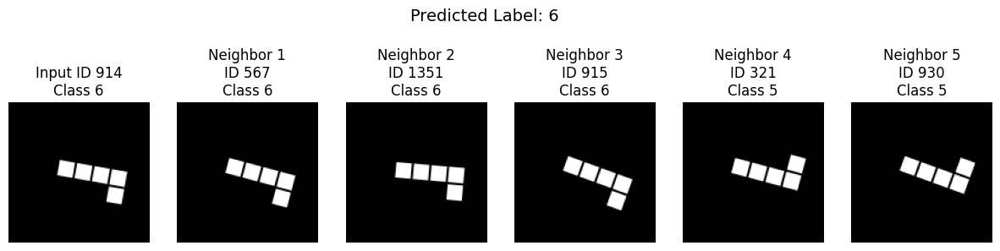

Test Sample 235:
  Image ID: 1538
  True Label: 20
  Predicted Label: 20
  Neighbor IDs: [1880  324  341 1592  736]
  Neighbor Labels: [20 20 20 14 25]
  Neighbor Distances: [0.02848995 0.0357424  0.13006276 0.18749458 0.19665235]


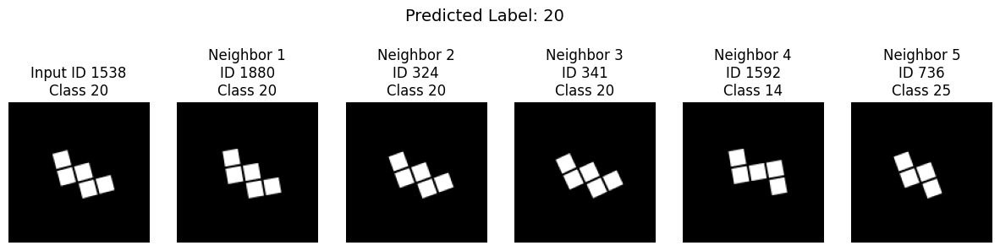

Test Sample 236:
  Image ID: 1267
  True Label: 0
  Predicted Label: 0
  Neighbor IDs: [ 440  945 1564 1297 1818]
  Neighbor Labels: [0 0 0 0 0]
  Neighbor Distances: [0.00662792 0.01369578 0.0179739  0.02745098 0.03380817]


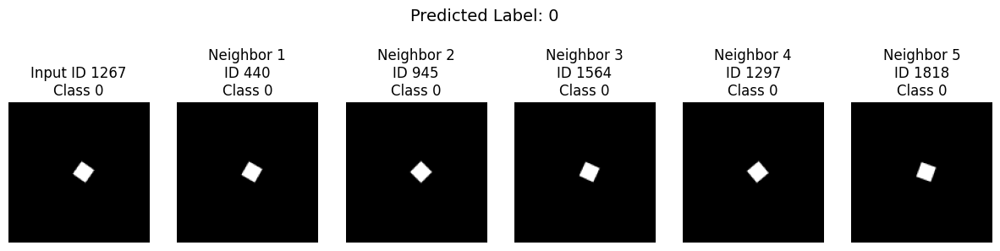

Test Sample 237:
  Image ID: 1091
  True Label: 6
  Predicted Label: 6
  Neighbor IDs: [1844 1182  598 1527  473]
  Neighbor Labels: [6 6 6 6 9]
  Neighbor Distances: [0.01789951 0.01802742 0.06851387 0.08792084 0.10799855]


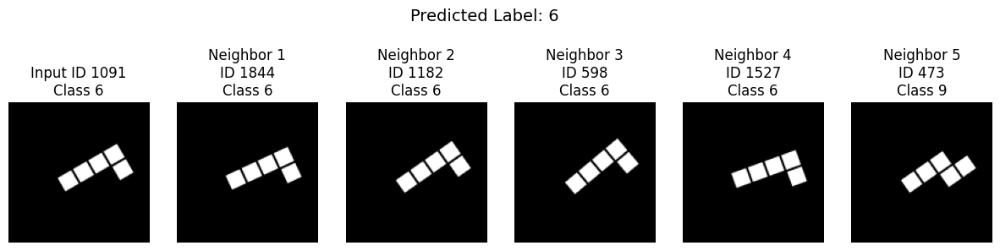

Test Sample 238:
  Image ID: 1108
  True Label: 8
  Predicted Label: 8
  Neighbor IDs: [ 514  636 1294 1330 1256]
  Neighbor Labels: [ 8  8 25 25  8]
  Neighbor Distances: [0.00436682 0.03302842 0.11789882 0.13562858 0.1598506 ]


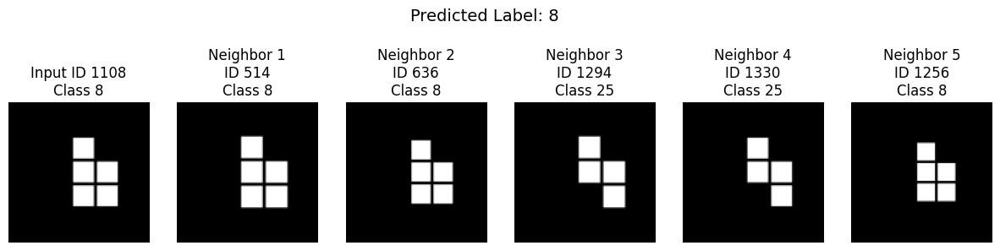

Test Sample 239:
  Image ID: 1272
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [1380  474   10  712 1361]
  Neighbor Labels: [4 4 3 4 3]
  Neighbor Distances: [0.03923118 0.0478512  0.14984077 0.158023   0.18329656]


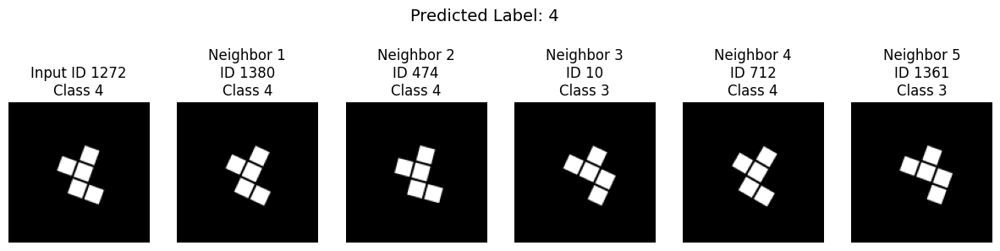

Test Sample 240:
  Image ID: 1602
  True Label: 28
  Predicted Label: 26
  Neighbor IDs: [ 403 1673 1629 1096 1855]
  Neighbor Labels: [28 26 28 26 11]
  Neighbor Distances: [0.02667052 0.12605172 0.13571882 0.15037632 0.16780722]


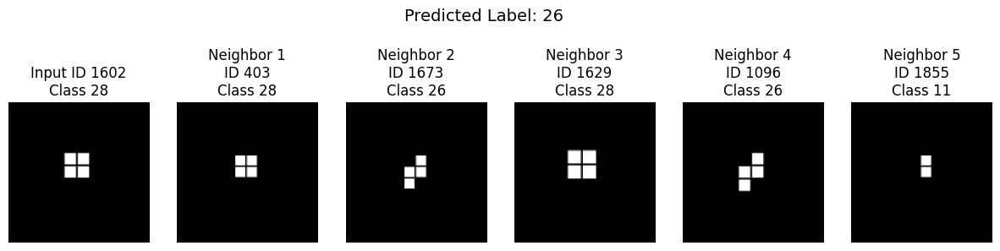

Test Sample 241:
  Image ID: 634
  True Label: 14
  Predicted Label: 14
  Neighbor IDs: [1665  363  743 1028 1618]
  Neighbor Labels: [14 14 14 20 14]
  Neighbor Distances: [0.03617054 0.05107379 0.1233747  0.17693222 0.18442017]


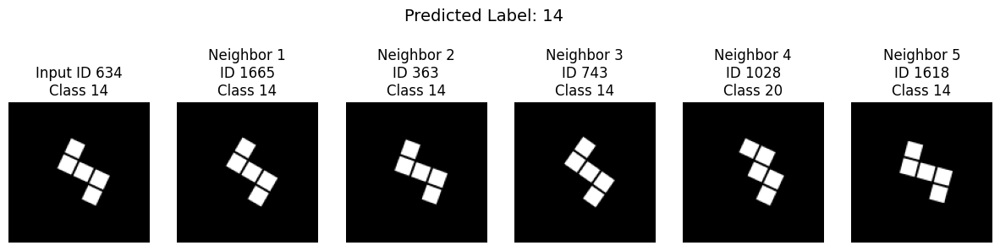

Test Sample 242:
  Image ID: 142
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [1395  101 1622  375 1343]
  Neighbor Labels: [ 5  5  5  5 29]
  Neighbor Distances: [0.02233446 0.03167903 0.08629668 0.09521055 0.12507391]


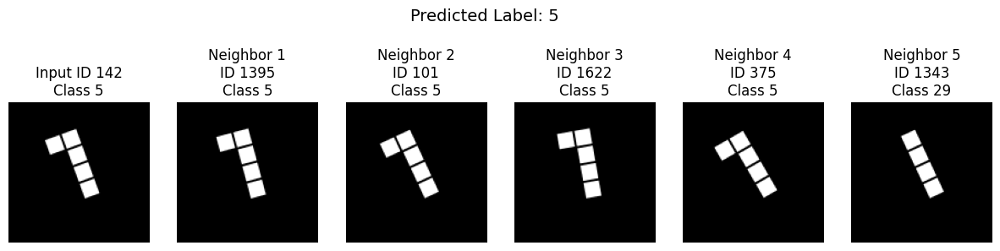

Test Sample 243:
  Image ID: 1148
  True Label: 13
  Predicted Label: 13
  Neighbor IDs: [ 482 1250  166  320 1193]
  Neighbor Labels: [13 29 13 29  8]
  Neighbor Distances: [0.03171146 0.17166352 0.17568052 0.17689443 0.20969611]


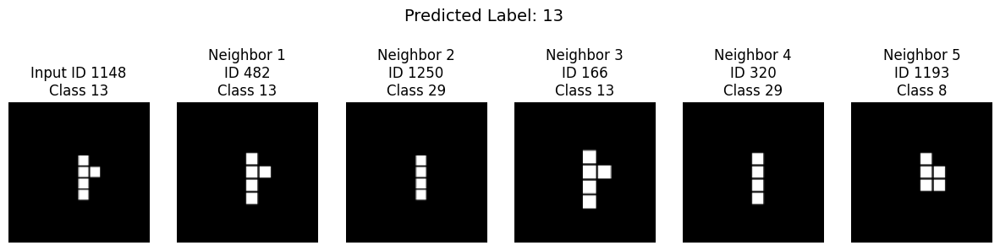

Test Sample 244:
  Image ID: 47
  True Label: 1
  Predicted Label: 1
  Neighbor IDs: [ 767 1445   26  343  323]
  Neighbor Labels: [ 1  1  1 19  9]
  Neighbor Distances: [0.03179073 0.05384487 0.12572432 0.14098763 0.14395356]


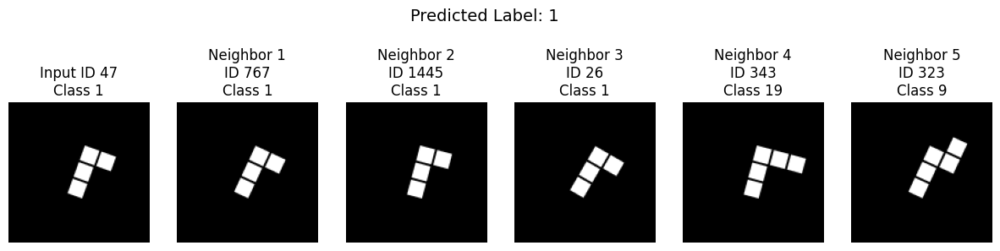

Test Sample 245:
  Image ID: 1238
  True Label: 1
  Predicted Label: 1
  Neighbor IDs: [1839 1224  582  134 1083]
  Neighbor Labels: [ 1  1 19 19  1]
  Neighbor Distances: [0.03646082 0.04247463 0.13100529 0.13933241 0.15959883]


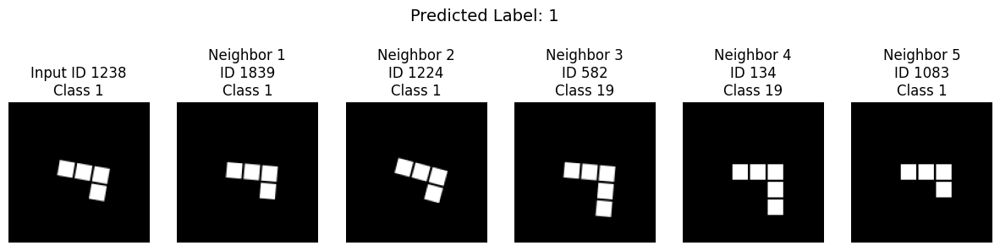

Test Sample 246:
  Image ID: 207
  True Label: 18
  Predicted Label: 18
  Neighbor IDs: [1132 1448   79 1021 1499]
  Neighbor Labels: [18 18 18 18 17]
  Neighbor Distances: [0.02732694 0.0340026  0.11786139 0.13510048 0.23684615]


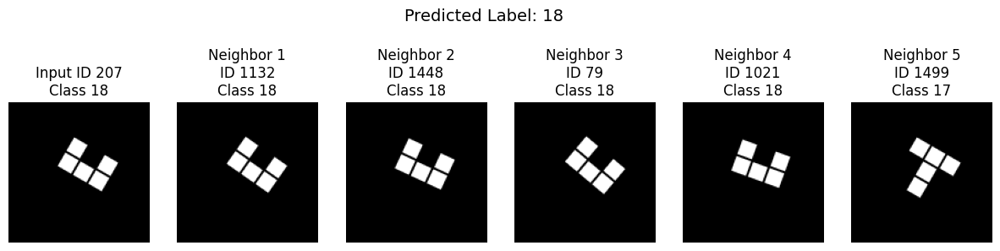

Test Sample 247:
  Image ID: 1850
  True Label: 20
  Predicted Label: 20
  Neighbor IDs: [1774 1634  531  131  190]
  Neighbor Labels: [20 20 20 20 20]
  Neighbor Distances: [0.04553843 0.11352587 0.14239967 0.20464993 0.20642233]


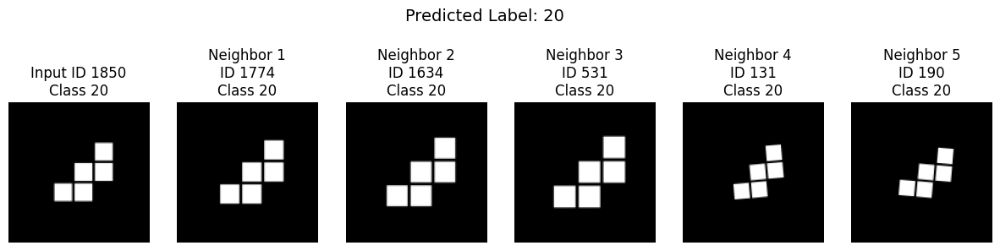

Test Sample 248:
  Image ID: 791
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [1726  331 1669  139 1140]
  Neighbor Labels: [4 4 3 4 3]
  Neighbor Distances: [0.02923924 0.14267159 0.19976848 0.20884705 0.2178703 ]


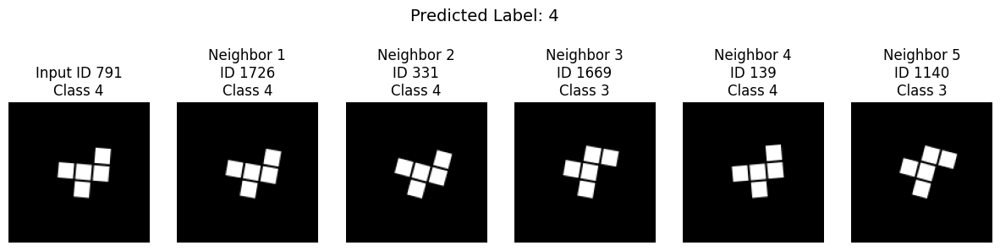

Test Sample 249:
  Image ID: 1834
  True Label: 19
  Predicted Label: 19
  Neighbor IDs: [ 521  877 1350 1130  883]
  Neighbor Labels: [19 19 19  1  1]
  Neighbor Distances: [0.02687901 0.03385711 0.11736268 0.14439237 0.14564854]


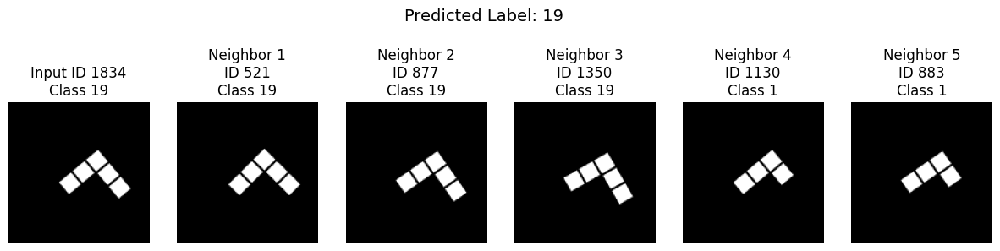

Test Sample 250:
  Image ID: 953
  True Label: 25
  Predicted Label: 25
  Neighbor IDs: [ 357 1515 1587   62 1702]
  Neighbor Labels: [25 25 25 25 20]
  Neighbor Distances: [0.02129686 0.02671003 0.11092597 0.11211944 0.13959283]


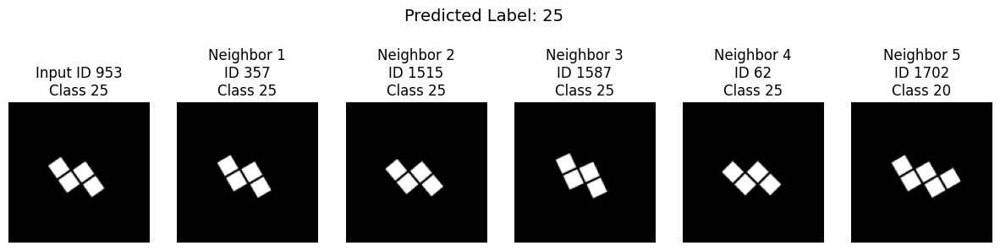

Test Sample 251:
  Image ID: 1616
  True Label: 25
  Predicted Label: 25
  Neighbor IDs: [ 488  779 1768 1060 1371]
  Neighbor Labels: [25 25 25 20 24]
  Neighbor Distances: [0.02524745 0.03665936 0.1573379  0.20955771 0.21550655]


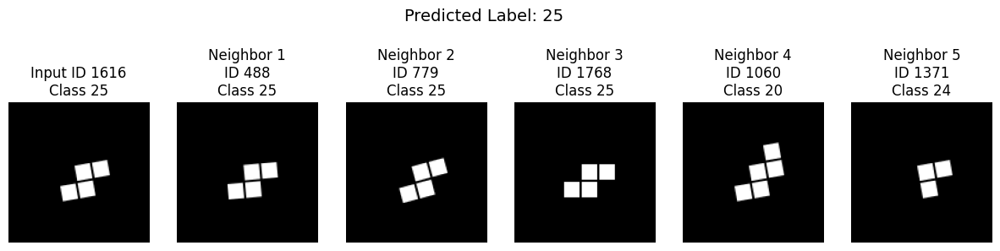

Test Sample 252:
  Image ID: 1377
  True Label: 24
  Predicted Label: 24
  Neighbor IDs: [ 159  144 1873 1666 1200]
  Neighbor Labels: [24 24 24 24  7]
  Neighbor Distances: [0.05308914 0.05384952 0.1370846  0.15902603 0.17531061]


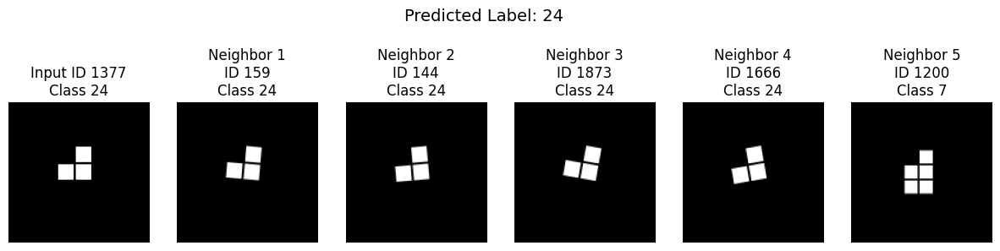

Test Sample 253:
  Image ID: 1712
  True Label: 29
  Predicted Label: 16
  Neighbor IDs: [1336 1812  371  203 1024]
  Neighbor Labels: [29 16 16 16 16]
  Neighbor Distances: [0.02619672 0.13371325 0.13630223 0.1439454  0.1445806 ]


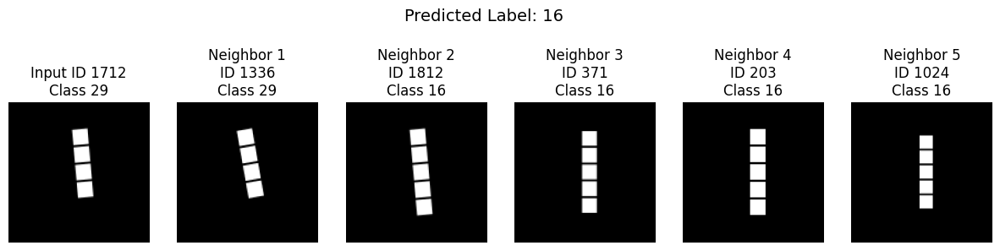

Test Sample 254:
  Image ID: 245
  True Label: 19
  Predicted Label: 19
  Neighbor IDs: [ 860 1145 1280 1776 1094]
  Neighbor Labels: [19 19  1  1 19]
  Neighbor Distances: [0.00474513 0.03658158 0.0733974  0.07560891 0.09627408]


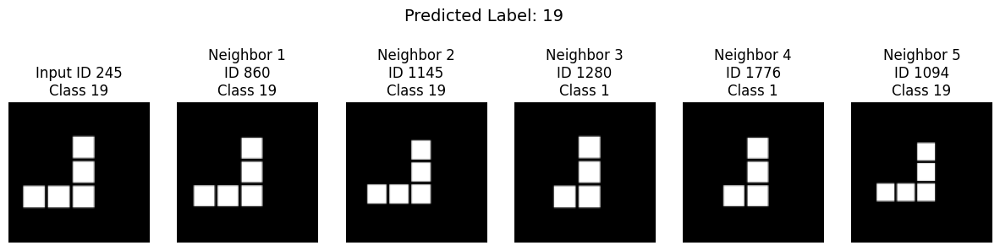

Test Sample 255:
  Image ID: 1674
  True Label: 19
  Predicted Label: 19
  Neighbor IDs: [1043  353  666  325 1570]
  Neighbor Labels: [19 19  1 19  1]
  Neighbor Distances: [0.03431404 0.03737515 0.15577048 0.1650089  0.17887318]


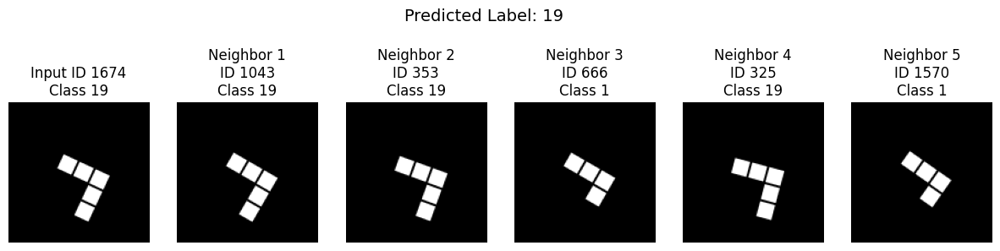

Test Sample 256:
  Image ID: 1705
  True Label: 25
  Predicted Label: 25
  Neighbor IDs: [ 779  161 1052  509  992]
  Neighbor Labels: [25 25 25 24  8]
  Neighbor Distances: [0.03325176 0.03730196 0.14658499 0.20547533 0.20723283]


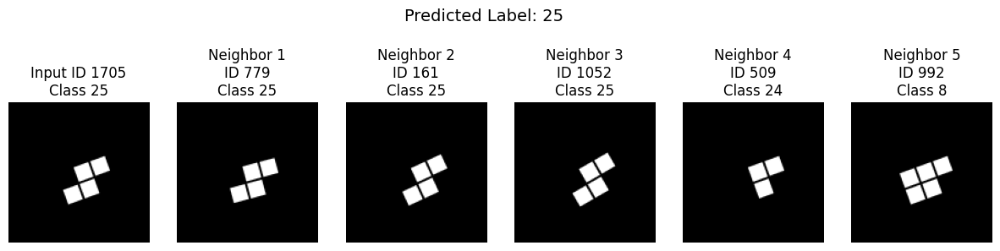

Test Sample 257:
  Image ID: 625
  True Label: 8
  Predicted Label: 8
  Neighbor IDs: [ 154 1871  490   52 1389]
  Neighbor Labels: [ 8  8  8 27 27]
  Neighbor Distances: [0.03115952 0.06729376 0.14604336 0.16766793 0.18622619]


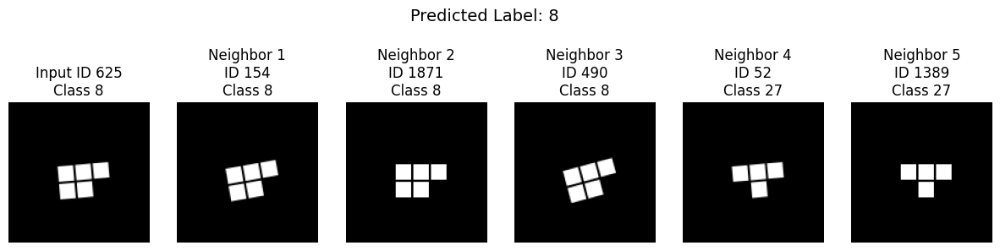

Test Sample 258:
  Image ID: 251
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [ 565   91   66 1593  845]
  Neighbor Labels: [9 9 9 9 6]
  Neighbor Distances: [0.03525949 0.03777874 0.12607455 0.12956166 0.14860207]


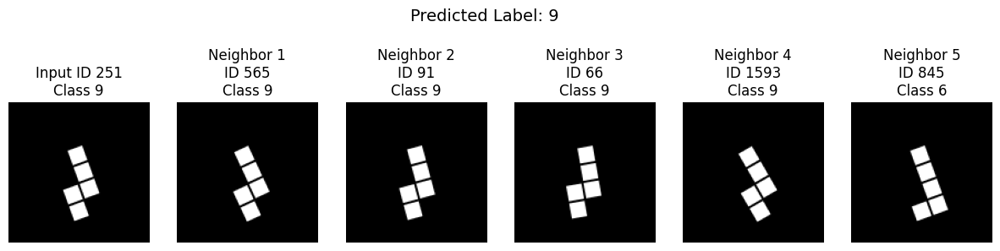

Test Sample 259:
  Image ID: 1636
  True Label: 21
  Predicted Label: 21
  Neighbor IDs: [1632 1494 1678  532 1794]
  Neighbor Labels: [21 21 21 13  3]
  Neighbor Distances: [0.00325084 0.02892882 0.13241613 0.20127326 0.21579164]


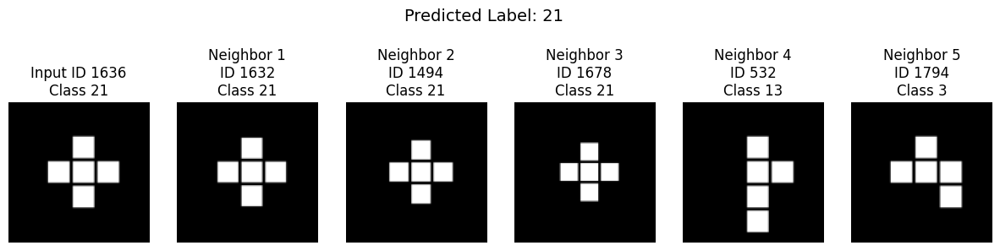

Test Sample 260:
  Image ID: 337
  True Label: 3
  Predicted Label: 3
  Neighbor IDs: [ 908 1245 1794  758 1609]
  Neighbor Labels: [3 3 3 3 3]
  Neighbor Distances: [0.03113747 0.09407061 0.11941433 0.14500695 0.16619486]


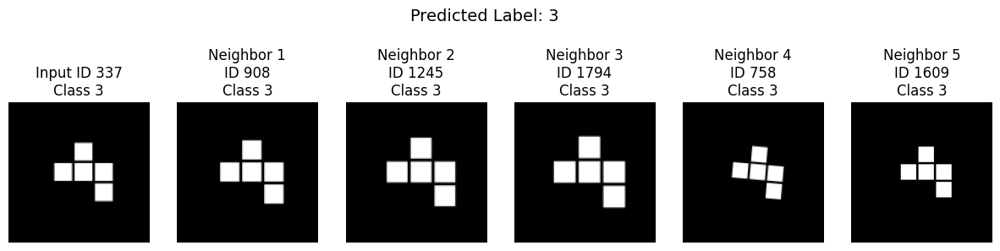

Test Sample 261:
  Image ID: 1754
  True Label: 11
  Predicted Label: 11
  Neighbor IDs: [ 768  217 1683 1429  882]
  Neighbor Labels: [11 11 11 11  0]
  Neighbor Distances: [0.01591933 0.01748216 0.05743039 0.13695711 0.15095234]


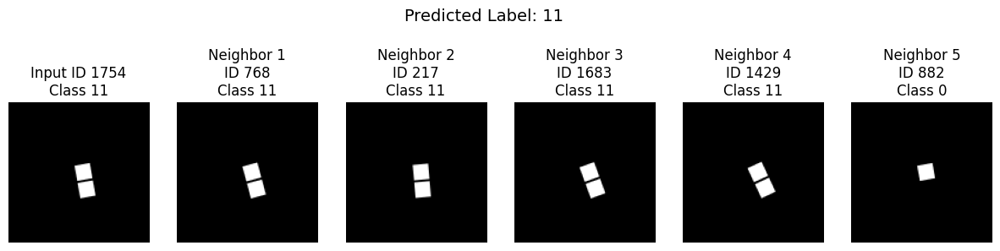

Test Sample 262:
  Image ID: 1615
  True Label: 19
  Predicted Label: 7
  Neighbor IDs: [1163 1466  470 1373 1019]
  Neighbor Labels: [ 1  7  7 19 17]
  Neighbor Distances: [0.07544982 0.07756138 0.09012365 0.10535496 0.14296168]


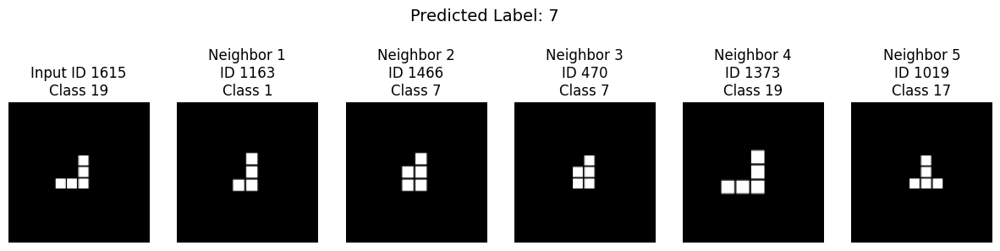

Test Sample 263:
  Image ID: 1853
  True Label: 17
  Predicted Label: 17
  Neighbor IDs: [864  15 622 384 666]
  Neighbor Labels: [17 17 17  2  1]
  Neighbor Distances: [0.031528   0.04507625 0.16686398 0.18220454 0.19295776]


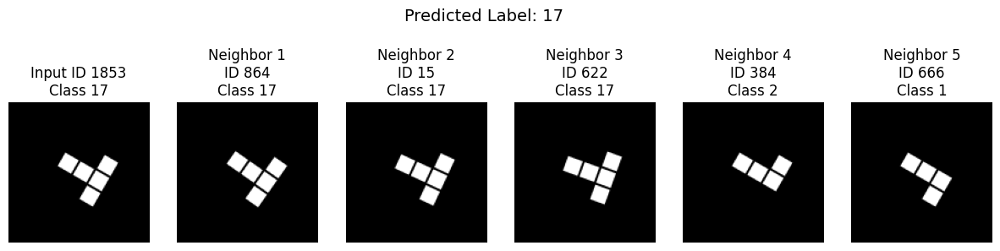

Test Sample 264:
  Image ID: 968
  True Label: 20
  Predicted Label: 20
  Neighbor IDs: [1028 1648 1884  196 1554]
  Neighbor Labels: [20 20 20 25 26]
  Neighbor Distances: [0.04735059 0.12043858 0.15675408 0.16955942 0.1810481 ]


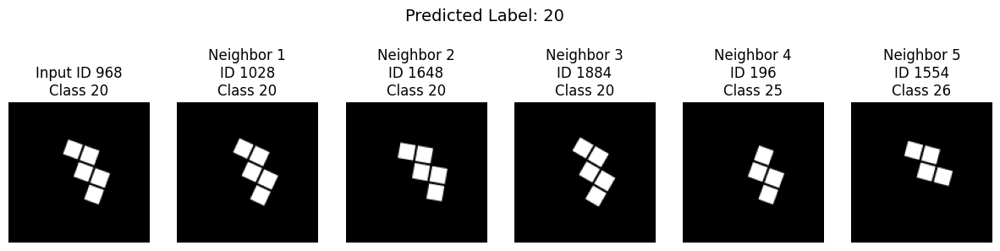

Test Sample 265:
  Image ID: 546
  True Label: 27
  Predicted Label: 3
  Neighbor IDs: [849  56 493 932  94]
  Neighbor Labels: [27 13 13  3  3]
  Neighbor Distances: [0.04781151 0.15035474 0.1603421  0.17017901 0.1772992 ]


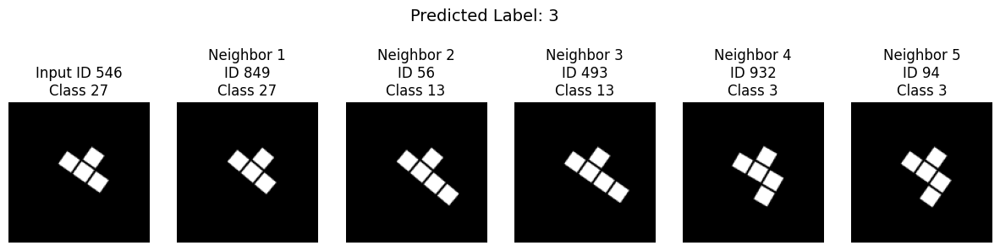

Test Sample 266:
  Image ID: 1154
  True Label: 11
  Predicted Label: 11
  Neighbor IDs: [1204  871   55 1202 1642]
  Neighbor Labels: [11 11 11 22 22]
  Neighbor Distances: [0.01501501 0.03950369 0.06531167 0.13730997 0.14634418]


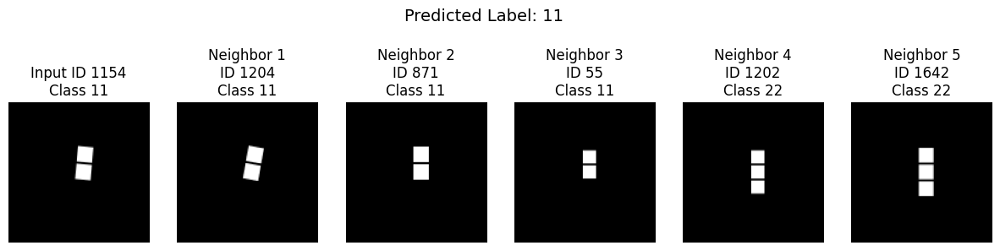

Test Sample 267:
  Image ID: 550
  True Label: 2
  Predicted Label: 10
  Neighbor IDs: [ 942 1528  722  515  276]
  Neighbor Labels: [ 2  2 10 10 10]
  Neighbor Distances: [0.04687005 0.04958606 0.0927434  0.11368275 0.15051341]


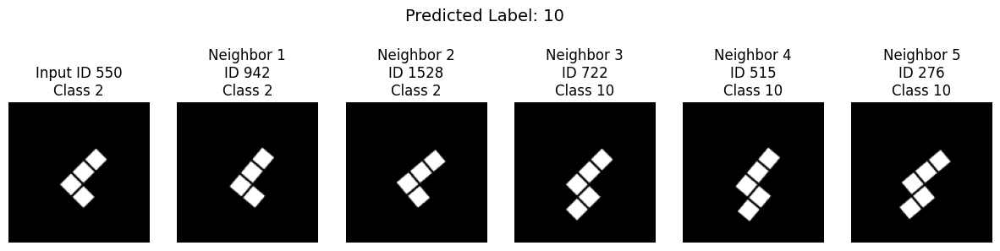

Test Sample 268:
  Image ID: 151
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [  14  475 1089  555  469]
  Neighbor Labels: [ 5  5  5  5 10]
  Neighbor Distances: [0.02585411 0.02854455 0.09553903 0.10422033 0.12258416]


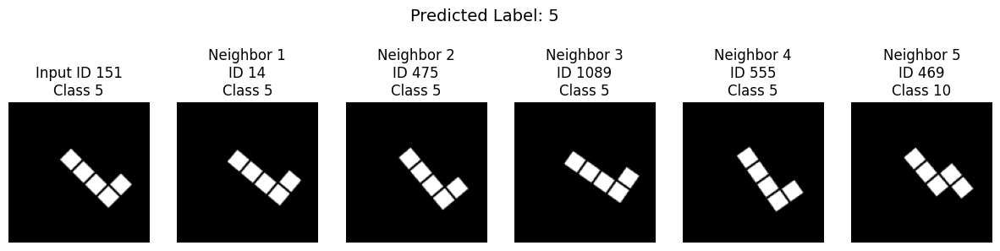

Test Sample 269:
  Image ID: 80
  True Label: 17
  Predicted Label: 17
  Neighbor IDs: [1275 1643 1460  966 1317]
  Neighbor Labels: [17 17 17 17  2]
  Neighbor Distances: [0.03719676 0.06277752 0.15193725 0.18113327 0.2467823 ]


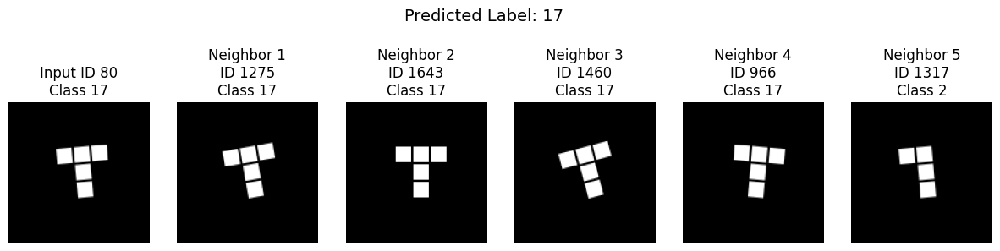

Test Sample 270:
  Image ID: 1318
  True Label: 12
  Predicted Label: 12
  Neighbor IDs: [519 399 835  52 638]
  Neighbor Labels: [12 12 12 27 27]
  Neighbor Distances: [0.03024948 0.03913188 0.13730884 0.22008777 0.22797298]


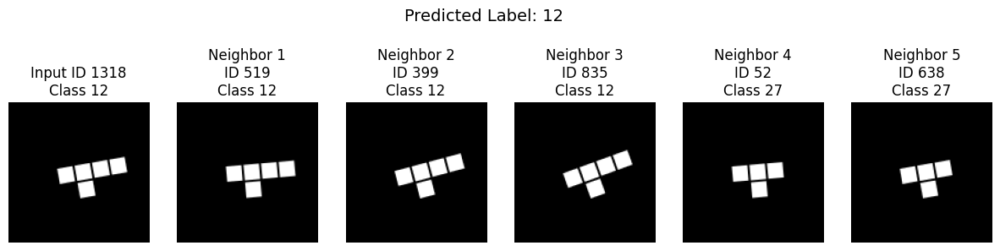

Test Sample 271:
  Image ID: 59
  True Label: 1
  Predicted Label: 1
  Neighbor IDs: [1552  946 1541  163  813]
  Neighbor Labels: [1 1 9 1 9]
  Neighbor Distances: [0.03712893 0.04889566 0.11487138 0.12857902 0.15259552]


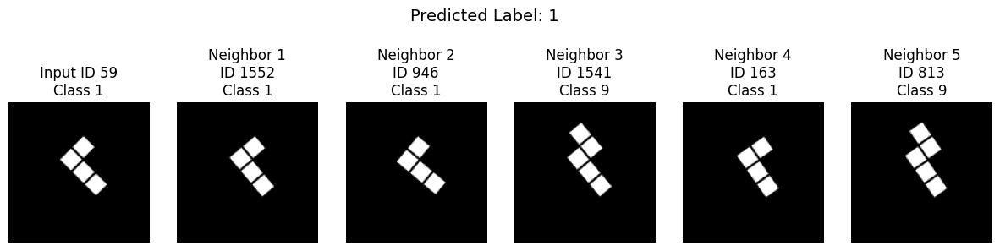

Test Sample 272:
  Image ID: 832
  True Label: 17
  Predicted Label: 17
  Neighbor IDs: [1499  199  145  564 1755]
  Neighbor Labels: [17 17 17  2 17]
  Neighbor Distances: [0.03235579 0.04031861 0.13057864 0.18521023 0.18627656]


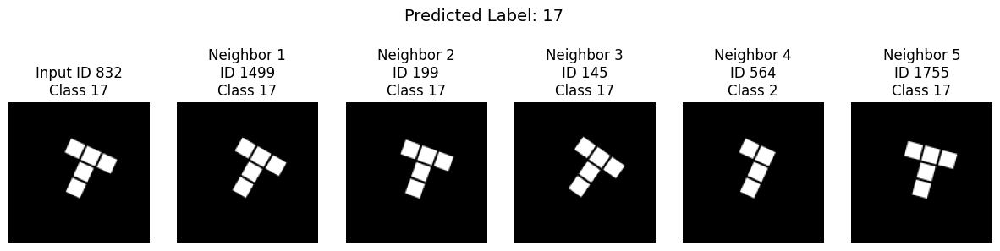

Test Sample 273:
  Image ID: 1777
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [1226  909 1622 1336 1299]
  Neighbor Labels: [ 5  5  5 29 10]
  Neighbor Distances: [0.0473569  0.11075073 0.13046783 0.14740431 0.14836162]


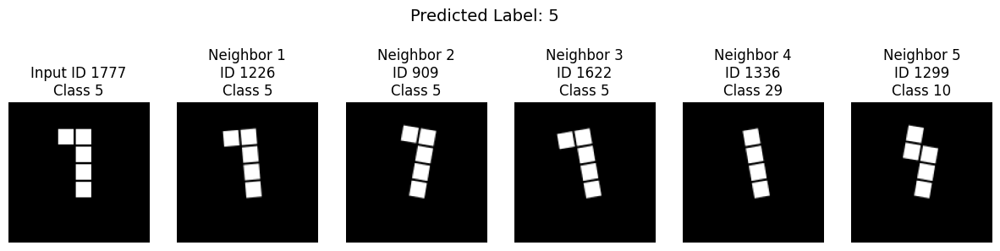

Test Sample 274:
  Image ID: 496
  True Label: 22
  Predicted Label: 22
  Neighbor IDs: [ 799 1325  346  633 1109]
  Neighbor Labels: [22 22 22 11 11]
  Neighbor Distances: [0.02613151 0.03430587 0.14063388 0.17718089 0.19300449]


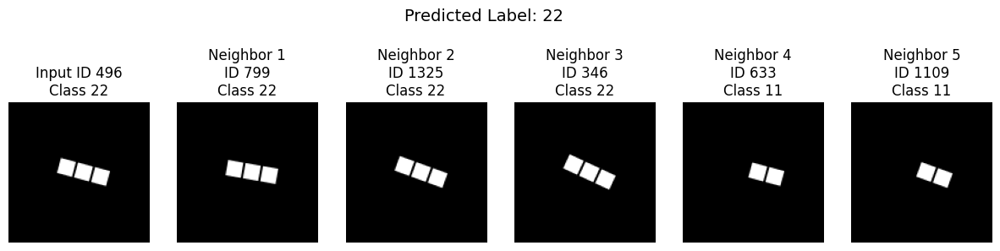

Test Sample 275:
  Image ID: 585
  True Label: 10
  Predicted Label: 10
  Neighbor IDs: [1537  713 1257 1667  935]
  Neighbor Labels: [10 10  5  5 10]
  Neighbor Distances: [0.0216403  0.03026742 0.0792526  0.10092986 0.10147631]


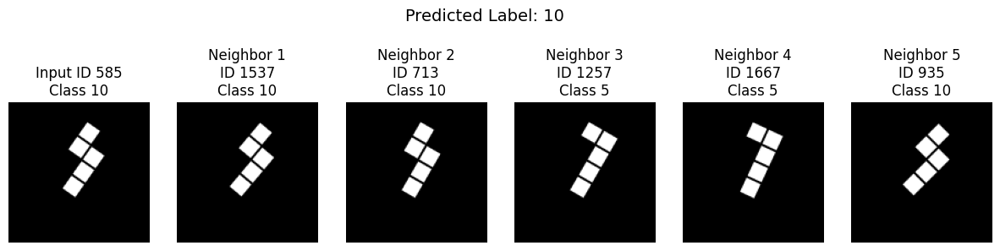

Test Sample 276:
  Image ID: 1471
  True Label: 1
  Predicted Label: 1
  Neighbor IDs: [1378  951  803 1621 1133]
  Neighbor Labels: [ 1  1 19 19  1]
  Neighbor Distances: [0.04281181 0.0502435  0.1341902  0.14844209 0.16118598]


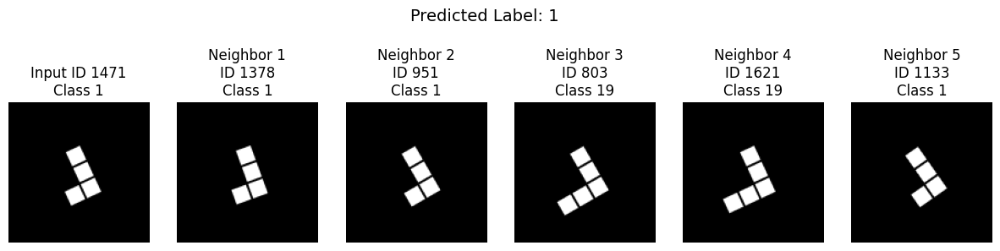

Test Sample 277:
  Image ID: 1535
  True Label: 5
  Predicted Label: 5
  Neighbor IDs: [1731  265 1182 1196  598]
  Neighbor Labels: [ 5  5  6 10  6]
  Neighbor Distances: [0.02271646 0.1009658  0.11823797 0.13653016 0.14273745]


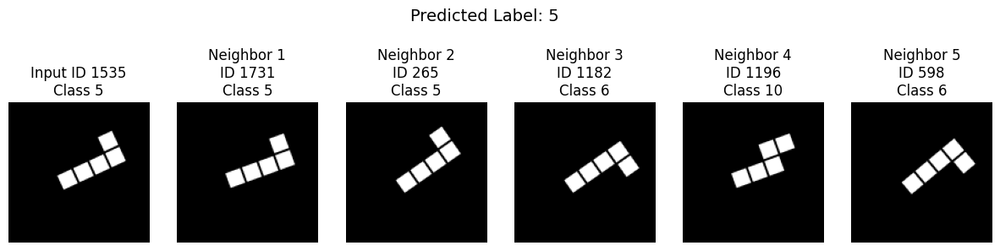

Test Sample 278:
  Image ID: 1676
  True Label: 7
  Predicted Label: 7
  Neighbor IDs: [  71 1340 1596  441  688]
  Neighbor Labels: [ 7  7 27 27  7]
  Neighbor Distances: [0.03162241 0.03223062 0.11068463 0.11588442 0.12481159]


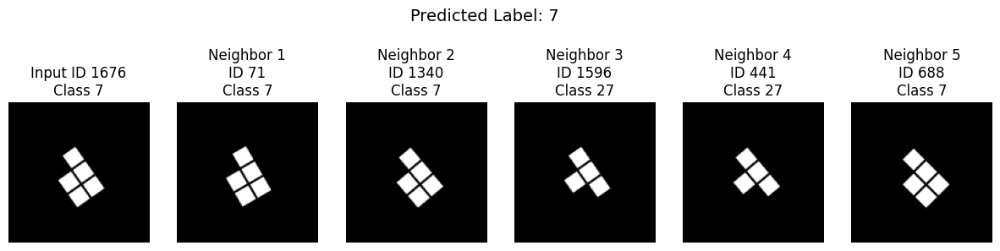

Test Sample 279:
  Image ID: 1279
  True Label: 25
  Predicted Label: 24
  Neighbor IDs: [  22 1728 1802  120 1426]
  Neighbor Labels: [25  8 24  3 24]
  Neighbor Distances: [0.02600706 0.06616402 0.07886744 0.09775424 0.1093936 ]


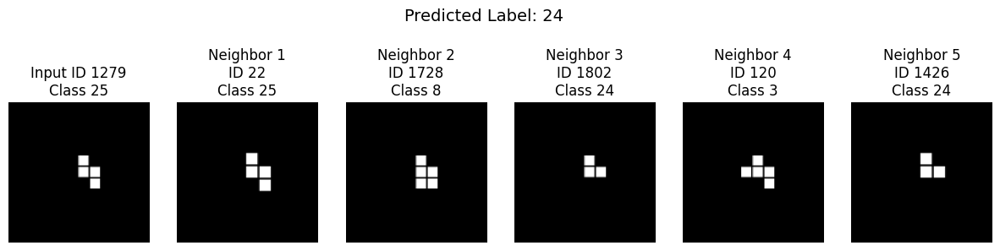

Test Sample 280:
  Image ID: 1623
  True Label: 16
  Predicted Label: 16
  Neighbor IDs: [ 830 1281  350  541 1788]
  Neighbor Labels: [16 16 16 16 29]
  Neighbor Distances: [0.02255768 0.02822953 0.09234095 0.09806919 0.1568327 ]


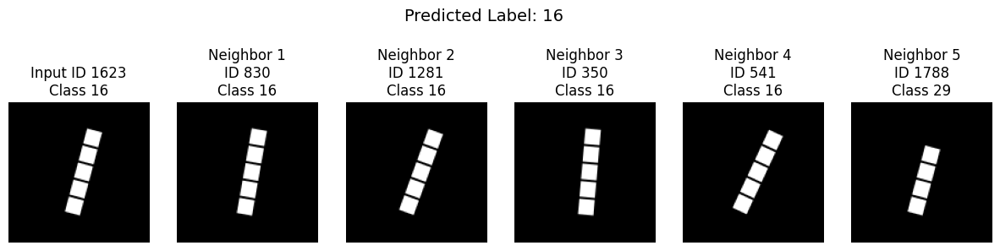

Test Sample 281:
  Image ID: 881
  True Label: 1
  Predicted Label: 1
  Neighbor IDs: [1163  470 1673  904  820]
  Neighbor Labels: [ 1  7 26 22 14]
  Neighbor Distances: [0.02544594 0.03450847 0.07562941 0.09012741 0.09353721]


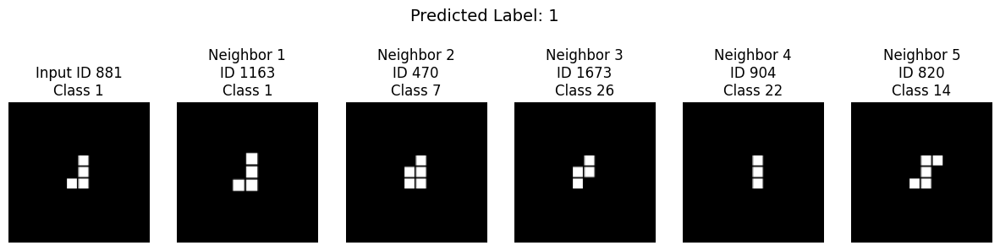

Test Sample 282:
  Image ID: 367
  True Label: 13
  Predicted Label: 13
  Neighbor IDs: [1295  479 1055 1604 1799]
  Neighbor Labels: [13 13 13 13 27]
  Neighbor Distances: [0.0400756  0.04348141 0.16919118 0.19555014 0.22424102]


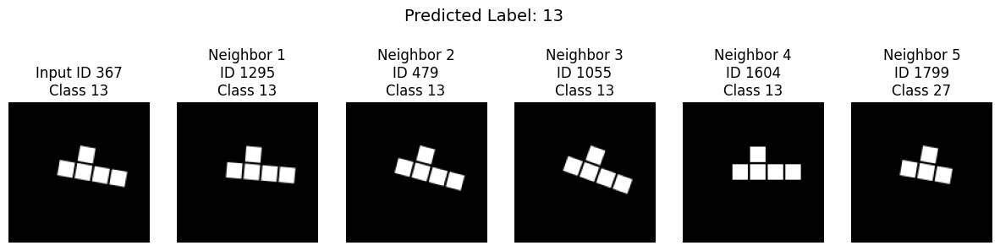

Test Sample 283:
  Image ID: 1222
  True Label: 8
  Predicted Label: 8
  Neighbor IDs: [1282 1344 1562 1827 1054]
  Neighbor Labels: [ 8  8 27  8 27]
  Neighbor Distances: [0.04074275 0.04523194 0.12020832 0.16460371 0.18599123]


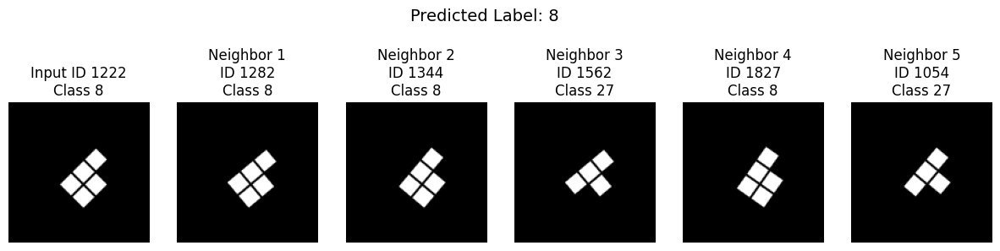

Test Sample 284:
  Image ID: 1798
  True Label: 24
  Predicted Label: 24
  Neighbor IDs: [ 175 1191 1606 1036 1107]
  Neighbor Labels: [24 24 24 24 11]
  Neighbor Distances: [0.03057671 0.03244328 0.10836601 0.11644363 0.17475283]


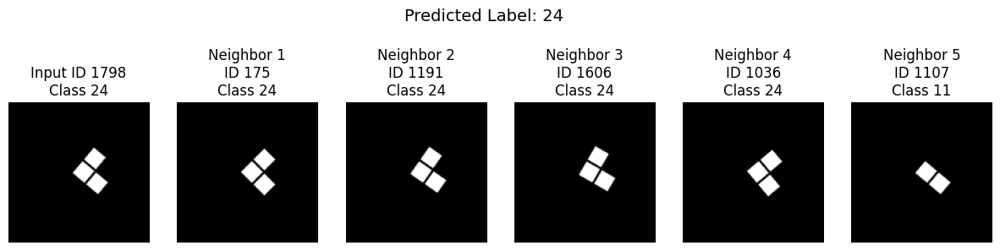

Test Sample 285:
  Image ID: 605
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [ 172 1029  782  426 1641]
  Neighbor Labels: [9 9 6 9 1]
  Neighbor Distances: [0.04465872 0.09069544 0.1422131  0.14358044 0.15428895]


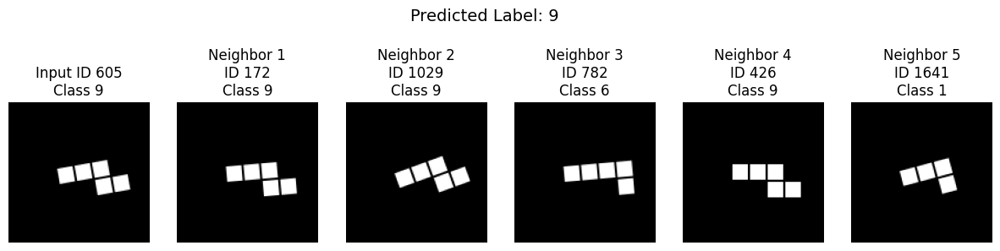

Test Sample 286:
  Image ID: 1165
  True Label: 20
  Predicted Label: 20
  Neighbor IDs: [  75  577 1051 1549  127]
  Neighbor Labels: [20 20 20 14 14]
  Neighbor Distances: [0.02791971 0.05314285 0.11648178 0.2113949  0.21484959]


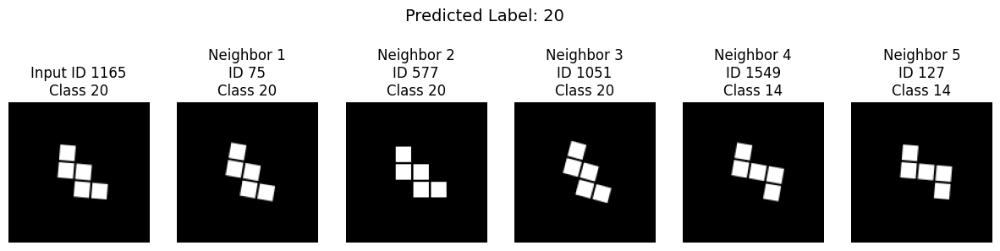

Test Sample 287:
  Image ID: 1259
  True Label: 8
  Predicted Label: 8
  Neighbor IDs: [ 381  890  870  573 1005]
  Neighbor Labels: [8 8 8 8 8]
  Neighbor Distances: [0.03046149 0.05949038 0.08595181 0.11352682 0.13293874]


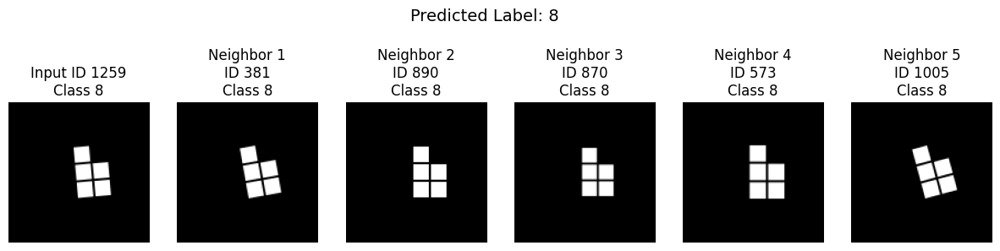

Test Sample 288:
  Image ID: 1442
  True Label: 24
  Predicted Label: 24
  Neighbor IDs: [1521  695  332 1644 1376]
  Neighbor Labels: [24 24 24 24 27]
  Neighbor Distances: [0.02910113 0.03055179 0.10785806 0.11243671 0.22929847]


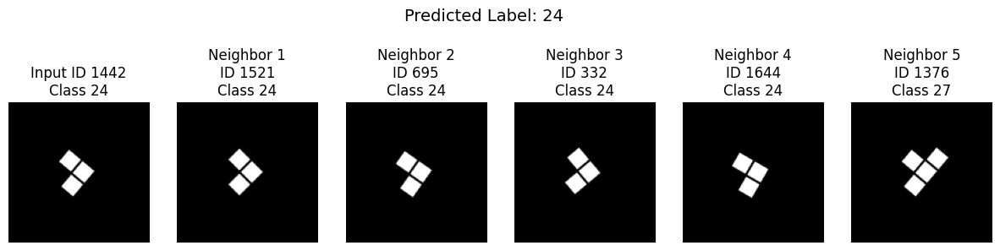

Test Sample 289:
  Image ID: 831
  True Label: 20
  Predicted Label: 20
  Neighbor IDs: [1047  190  131 1292 1774]
  Neighbor Labels: [20 20 20 20 20]
  Neighbor Distances: [0.07885611 0.09568679 0.10230577 0.11404139 0.16671073]


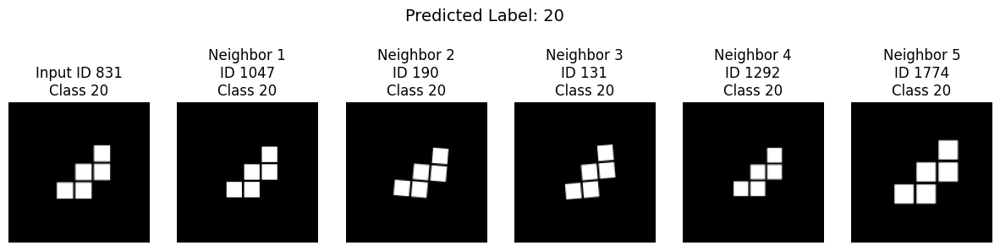

Test Sample 290:
  Image ID: 1234
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [1680  805  351   81 1596]
  Neighbor Labels: [ 4  4  4  3 27]
  Neighbor Distances: [0.03282976 0.14257365 0.14858401 0.1564076  0.17003918]


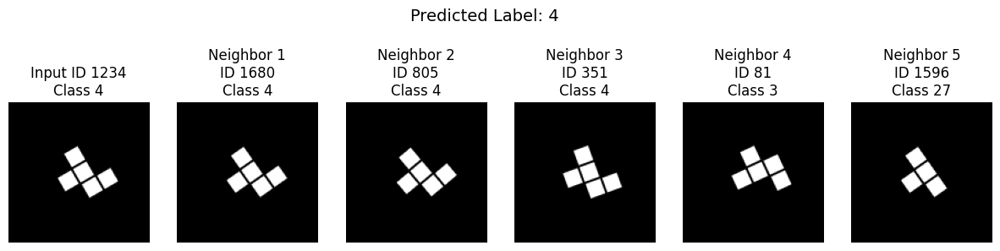

Test Sample 291:
  Image ID: 1848
  True Label: 4
  Predicted Label: 4
  Neighbor IDs: [ 995 1025 1289  229  187]
  Neighbor Labels: [4 4 4 3 4]
  Neighbor Distances: [0.03088856 0.03828692 0.1216585  0.13391614 0.16673863]


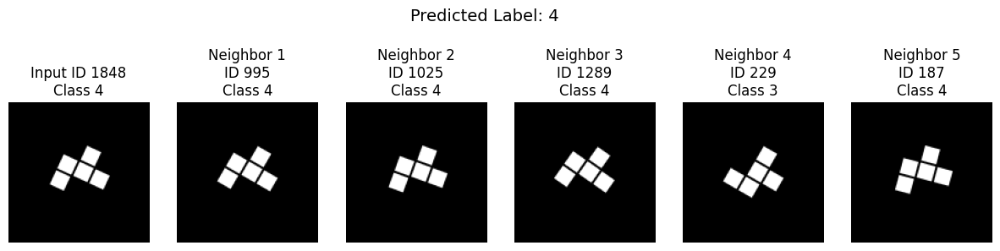

Test Sample 292:
  Image ID: 1591
  True Label: 2
  Predicted Label: 2
  Neighbor IDs: [1890  290  268 1155  641]
  Neighbor Labels: [ 2  2 10 17  2]
  Neighbor Distances: [0.03692091 0.04058135 0.10281301 0.14737368 0.14945251]


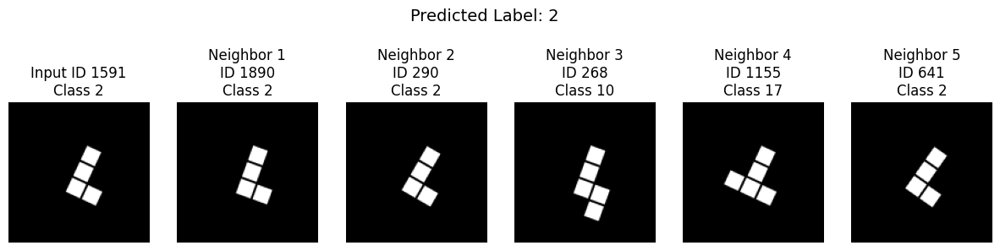

Test Sample 293:
  Image ID: 61
  True Label: 18
  Predicted Label: 18
  Neighbor IDs: [1007 1876 1409  663  491]
  Neighbor Labels: [18 18 18 10 10]
  Neighbor Distances: [0.05166137 0.17075992 0.18737173 0.23935223 0.26371562]


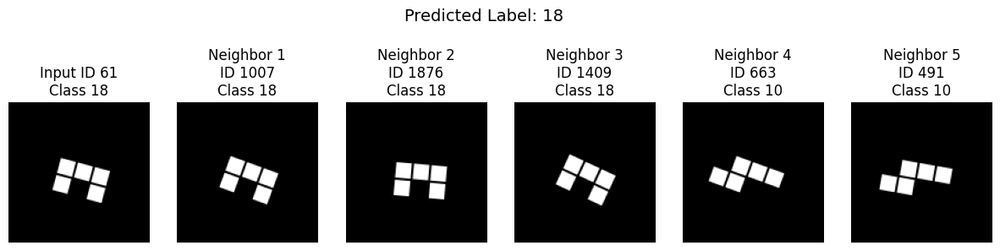

Test Sample 294:
  Image ID: 680
  True Label: 13
  Predicted Label: 27
  Neighbor IDs: [1287 1467 1369  793 1384]
  Neighbor Labels: [13 27 27 27 13]
  Neighbor Distances: [0.13812637 0.21345711 0.216784   0.2671891  0.27295232]


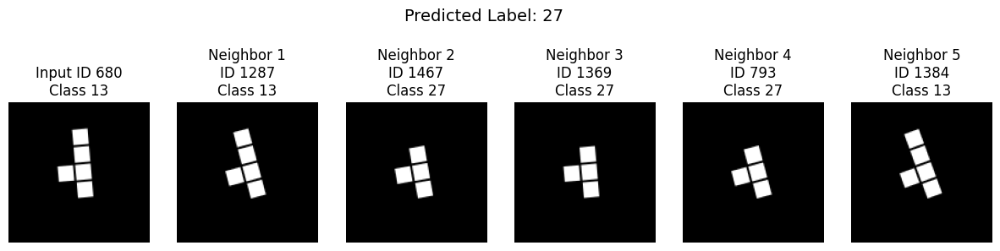

Test Sample 295:
  Image ID: 446
  True Label: 19
  Predicted Label: 19
  Neighbor IDs: [ 477 1086 1045 1332  104]
  Neighbor Labels: [19 19 19 19  1]
  Neighbor Distances: [0.03201199 0.03512323 0.13908273 0.15909433 0.17958248]


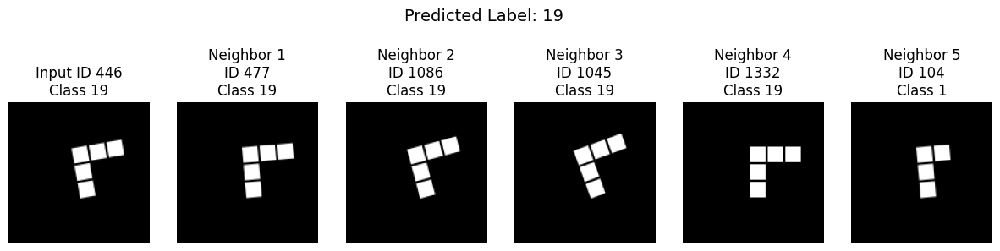

Test Sample 296:
  Image ID: 1479
  True Label: 24
  Predicted Label: 24
  Neighbor IDs: [  54 1153  332 1400 1438]
  Neighbor Labels: [24 24 24 24 27]
  Neighbor Distances: [0.02955329 0.03650993 0.12039983 0.13761139 0.19588304]


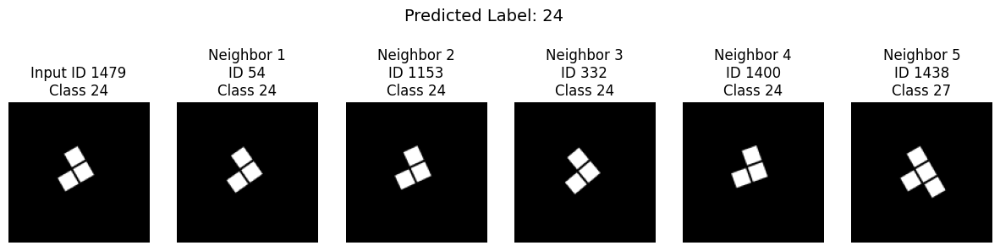

Test Sample 297:
  Image ID: 1803
  True Label: 9
  Predicted Label: 9
  Neighbor IDs: [1399  473 1029   96  883]
  Neighbor Labels: [9 9 9 9 1]
  Neighbor Distances: [0.02055311 0.02708817 0.09296095 0.09528458 0.10640937]


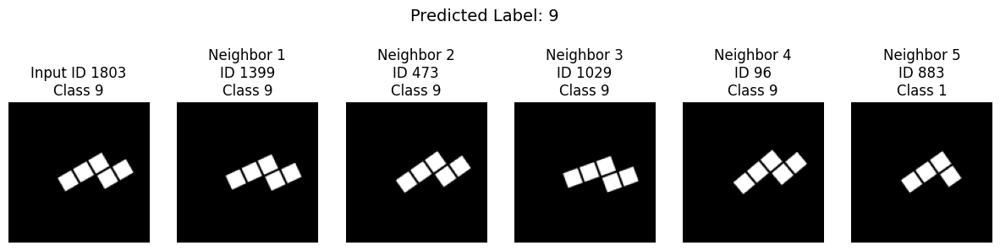

Test Sample 298:
  Image ID: 993
  True Label: 29
  Predicted Label: 6
  Neighbor IDs: [1639 1274  444 1056 1411]
  Neighbor Labels: [29 29  6  6  5]
  Neighbor Distances: [0.02811801 0.09985793 0.11292702 0.12525451 0.12682742]


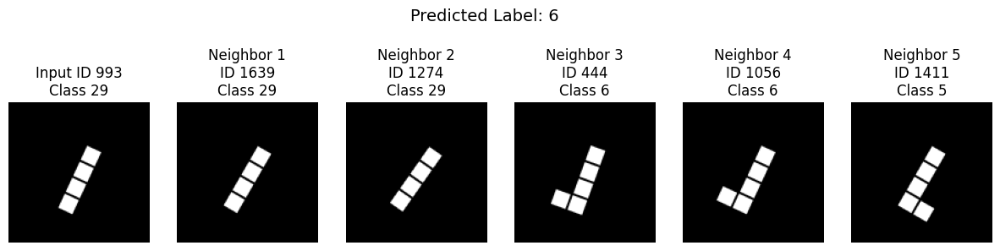

Test Sample 299:
  Image ID: 520
  True Label: 11
  Predicted Label: 11
  Neighbor IDs: [1204 1040 1306   55  250]
  Neighbor Labels: [11 11 11 11 22]
  Neighbor Distances: [0.01900685 0.02199602 0.0683645  0.15600026 0.17892236]


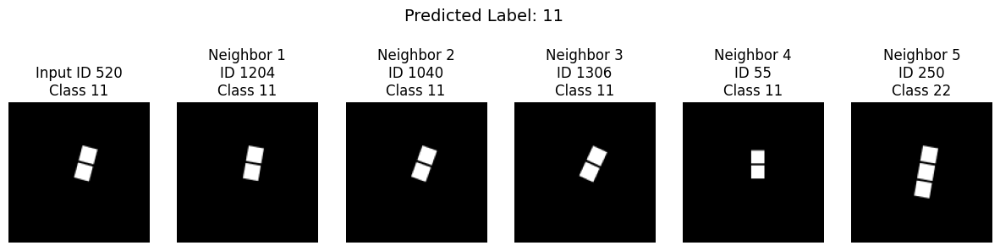

In [35]:
all_mu_list = []
all_labels_list = []
all_images_list = []

for batch_images, batch_labels in images:
    mu, _, _, _ = model.encode(batch_images)
    all_mu_list.append(mu.numpy())
    all_labels_list.append(batch_labels.numpy())
    all_images_list.append(batch_images.numpy())

all_mu = np.concatenate(all_mu_list, axis=0)
all_labels = np.concatenate(all_labels_list, axis=0)
all_images = np.concatenate(all_images_list, axis=0)
all_latents = all_mu

all_classes = np.unique(all_labels)

num_test_samples = 300
indices = np.random.choice(len(all_latents), size=num_test_samples, replace=False)
test_latents = all_latents[indices]
test_labels = all_labels[indices]
test_images = all_images[indices]

mask = np.ones(len(all_latents), dtype=bool)
mask[indices] = False
train_latents = all_latents[mask]
train_labels = all_labels[mask]
train_images = all_images[mask]

knn = KNeighborsClassifier(n_neighbors=5, metric='cosine')
knn.fit(train_latents, train_labels)

pred_labels = knn.predict(test_latents)

cm = confusion_matrix(test_labels, pred_labels, labels=all_classes)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix: Actual vs Predicted (KNN in Latent Space)')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

accuracy = np.mean(pred_labels == test_labels)
print(f'Accuracy: {accuracy:.4f}')

NUMS = len(test_latents)

for i in range(NUMS):
    latent = test_latents[i]
    true_label = test_labels[i]
    predicted_label = pred_labels[i]
    image_id = indices[i]

    distances, neighbor_indices = knn.kneighbors([latent], n_neighbors=5, return_distance=True)
    neighbor_labels = train_labels[neighbor_indices[0]]
    neighbor_images = train_images[neighbor_indices[0]]
    neighbor_ids = np.arange(len(all_latents))[mask][neighbor_indices[0]]

    print(f'Test Sample {i}:')
    print(f'  Image ID: {image_id}')
    print(f'  True Label: {true_label}')
    print(f'  Predicted Label: {predicted_label}')
    print(f'  Neighbor IDs: {neighbor_ids}')
    print(f'  Neighbor Labels: {neighbor_labels}')
    print(f'  Neighbor Distances: {distances[0]}')

    fig, axs = plt.subplots(1, 6, figsize=(15, 4))
    axs[0].imshow(test_images[i].squeeze(), cmap='gray')
    axs[0].set_title(f'Input ID {image_id}\nClass {true_label}')
    axs[0].axis('off')

    for j in range(5):
        axs[j + 1].imshow(neighbor_images[j].squeeze(), cmap='gray')
        axs[j + 1].set_title(f'Neighbor {j+1}\nID {neighbor_ids[j]}\nClass {neighbor_labels[j]}')
        axs[j + 1].axis('off')

    plt.suptitle(f'Predicted Label: {predicted_label}', fontsize=14)
    plt.show()




SAMPLE 1/10 - Image ID: 235
Query Image - ID: 235, Label: 18
Most Similar Scores: [0.9426513  0.8699918  0.8342321  0.81426847 0.79651564 0.7596736
 0.75908    0.70427424 0.690122   0.68442357]
Most Dissimilar Scores: [-2.         -0.6376087  -0.6365421  -0.61462903 -0.6094712  -0.60879993
 -0.6062359  -0.6053926  -0.60242194 -0.5736674 ]


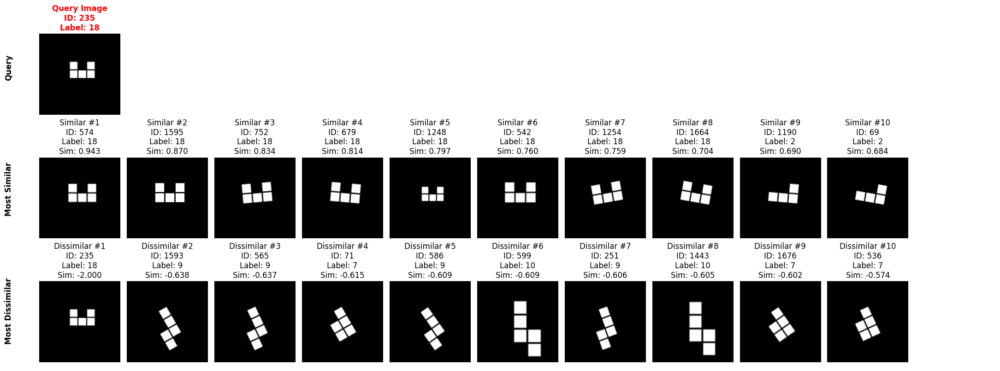


Similarity Statistics:
  Most Similar - Mean: 0.7855, Std: 0.0790
  Most Dissimilar - Mean: -0.7495, Std: 0.4172

Class Distribution:
  Query class: 18
  Most similar classes: [18 18 18 18 18 18 18 18  2  2]
  Most dissimilar classes: [18  9  9  7  9 10  9 10  7  7]
  Same class in most similar: 8/10 (80.0%)
  Same class in most dissimilar: 1/10 (10.0%)

SAMPLE 2/10 - Image ID: 735
Query Image - ID: 735, Label: 9
Most Similar Scores: [0.9750195  0.9685662  0.88817227 0.8750644  0.8745298  0.8659629
 0.85588014 0.85554445 0.8390242  0.838199  ]
Most Dissimilar Scores: [-2.         -0.81524134 -0.80329853 -0.7974106  -0.7899382  -0.78530437
 -0.78515506 -0.783084   -0.78097886 -0.7739265 ]


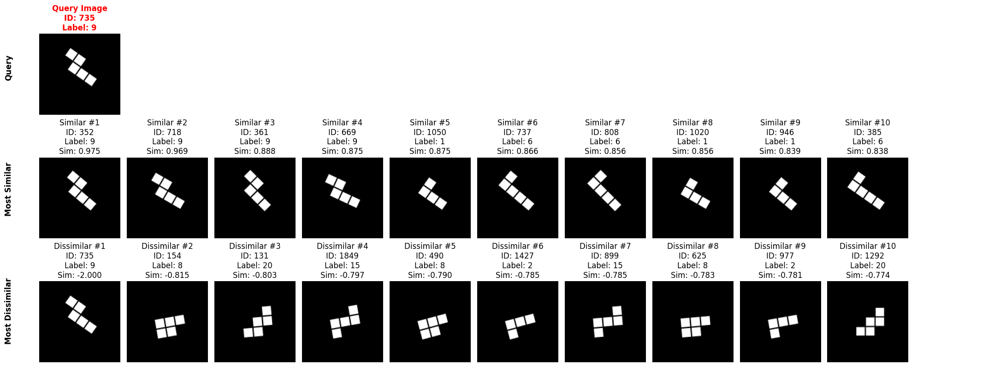


Similarity Statistics:
  Most Similar - Mean: 0.8836, Std: 0.0465
  Most Dissimilar - Mean: -0.9114, Std: 0.3630

Class Distribution:
  Query class: 9
  Most similar classes: [9 9 9 9 1 6 6 1 1 6]
  Most dissimilar classes: [ 9  8 20 15  8  2 15  8  2 20]
  Same class in most similar: 4/10 (40.0%)
  Same class in most dissimilar: 1/10 (10.0%)

SAMPLE 3/10 - Image ID: 1507
Query Image - ID: 1507, Label: 8
Most Similar Scores: [0.96353245 0.95179856 0.88099194 0.867149   0.8238112  0.8210981
 0.82053566 0.81942064 0.81787544 0.811267  ]
Most Dissimilar Scores: [-2.         -0.9627619  -0.95923895 -0.8959861  -0.8593825  -0.850001
 -0.8495888  -0.8246706  -0.81361973 -0.8125608 ]


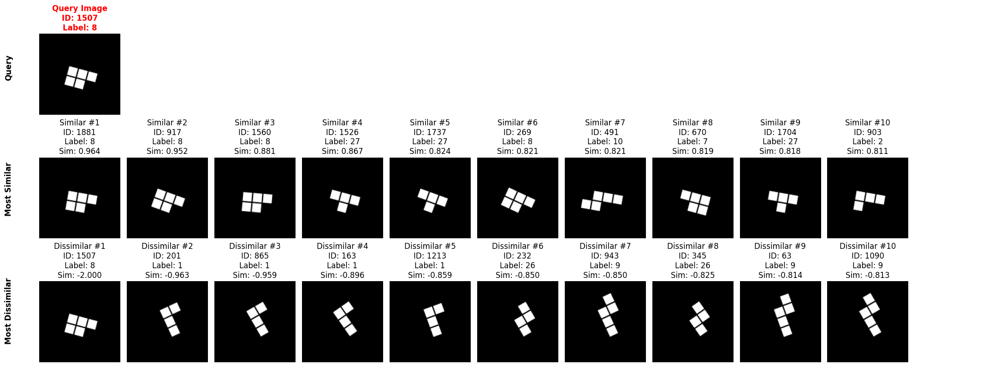


Similarity Statistics:
  Most Similar - Mean: 0.8577, Std: 0.0546
  Most Dissimilar - Mean: -0.9828, Std: 0.3430

Class Distribution:
  Query class: 8
  Most similar classes: [ 8  8  8 27 27  8 10  7 27  2]
  Most dissimilar classes: [ 8  1  1  1  1 26  9 26  9  9]
  Same class in most similar: 4/10 (40.0%)
  Same class in most dissimilar: 1/10 (10.0%)

SAMPLE 4/10 - Image ID: 1126
Query Image - ID: 1126, Label: 1
Most Similar Scores: [0.97655886 0.96480435 0.8804263  0.8617045  0.8610516  0.853387
 0.83958405 0.81551695 0.8092975  0.807707  ]
Most Dissimilar Scores: [-2.         -0.90362287 -0.9007813  -0.8417249  -0.833646   -0.82178587
 -0.7991273  -0.7934952  -0.7885243  -0.78667676]


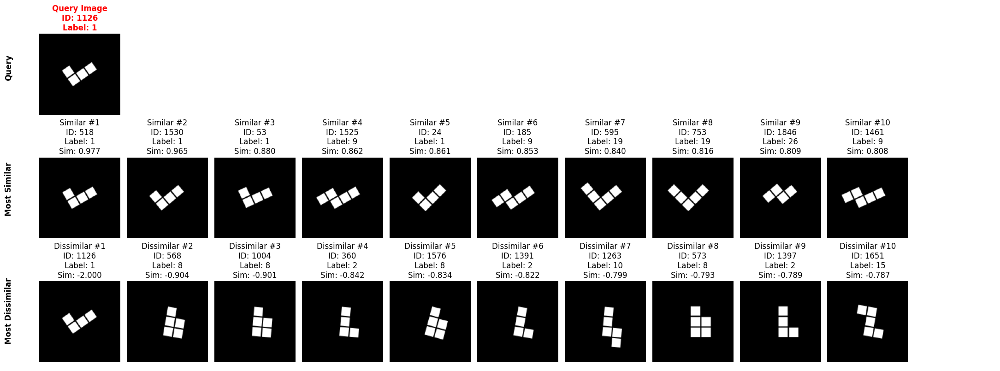


Similarity Statistics:
  Most Similar - Mean: 0.8670, Std: 0.0568
  Most Dissimilar - Mean: -0.9469, Std: 0.3534

Class Distribution:
  Query class: 1
  Most similar classes: [ 1  1  1  9  1  9 19 19 26  9]
  Most dissimilar classes: [ 1  8  8  2  8  2 10  8  2 15]
  Same class in most similar: 4/10 (40.0%)
  Same class in most dissimilar: 1/10 (10.0%)

SAMPLE 5/10 - Image ID: 942
Query Image - ID: 942, Label: 2
Most Similar Scores: [0.9573611  0.95312995 0.89821255 0.8885288  0.85081655 0.8477756
 0.8475461  0.8365313  0.8327501  0.82459474]
Most Dissimilar Scores: [-2.         -0.92340314 -0.90320104 -0.8321693  -0.7769257  -0.76640636
 -0.7563477  -0.75537604 -0.75049865 -0.7259679 ]


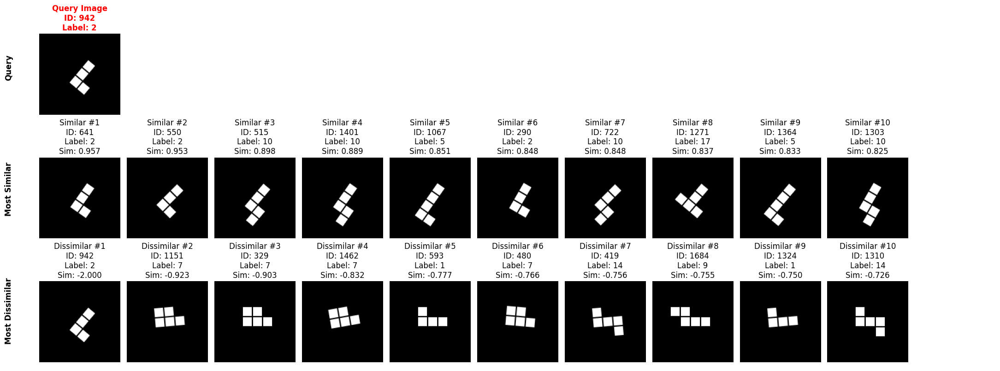


Similarity Statistics:
  Most Similar - Mean: 0.8737, Std: 0.0463
  Most Dissimilar - Mean: -0.9190, Std: 0.3659

Class Distribution:
  Query class: 2
  Most similar classes: [ 2  2 10 10  5  2 10 17  5 10]
  Most dissimilar classes: [ 2  7  7  7  1  7 14  9  1 14]
  Same class in most similar: 3/10 (30.0%)
  Same class in most dissimilar: 1/10 (10.0%)

SAMPLE 6/10 - Image ID: 595
Query Image - ID: 595, Label: 19
Most Similar Scores: [0.97224736 0.9716739  0.90671444 0.89279854 0.83958405 0.8375062
 0.82594013 0.81389314 0.8042322  0.8014404 ]
Most Dissimilar Scores: [-2.         -0.85718596 -0.8534386  -0.83768415 -0.83688974 -0.8362399
 -0.8284253  -0.8127661  -0.80836457 -0.8006197 ]


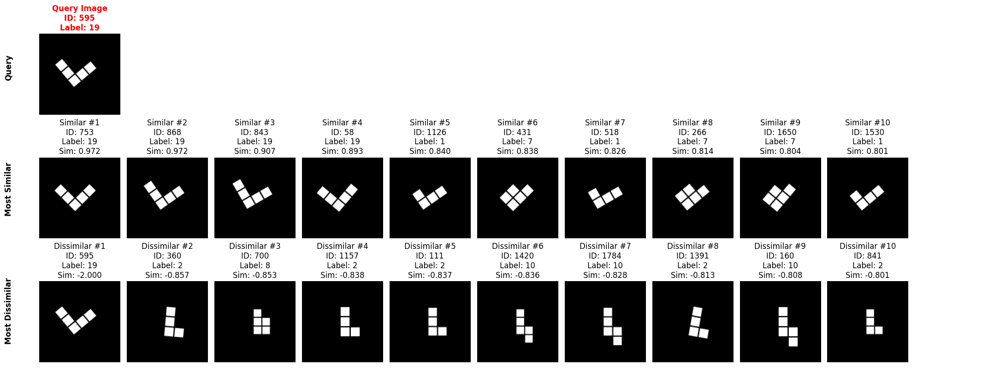


Similarity Statistics:
  Most Similar - Mean: 0.8666, Std: 0.0622
  Most Dissimilar - Mean: -0.9472, Std: 0.3514

Class Distribution:
  Query class: 19
  Most similar classes: [19 19 19 19  1  7  1  7  7  1]
  Most dissimilar classes: [19  2  8  2  2 10 10  2 10  2]
  Same class in most similar: 4/10 (40.0%)
  Same class in most dissimilar: 1/10 (10.0%)

SAMPLE 7/10 - Image ID: 341
Query Image - ID: 341, Label: 20
Most Similar Scores: [0.973066   0.96549934 0.91054285 0.86993724 0.8587155  0.8526383
 0.8482982  0.84540963 0.84459424 0.83733183]
Most Dissimilar Scores: [-2.         -0.9039049  -0.8941282  -0.8933064  -0.8704158  -0.86854106
 -0.86447406 -0.85339123 -0.84610033 -0.8454045 ]


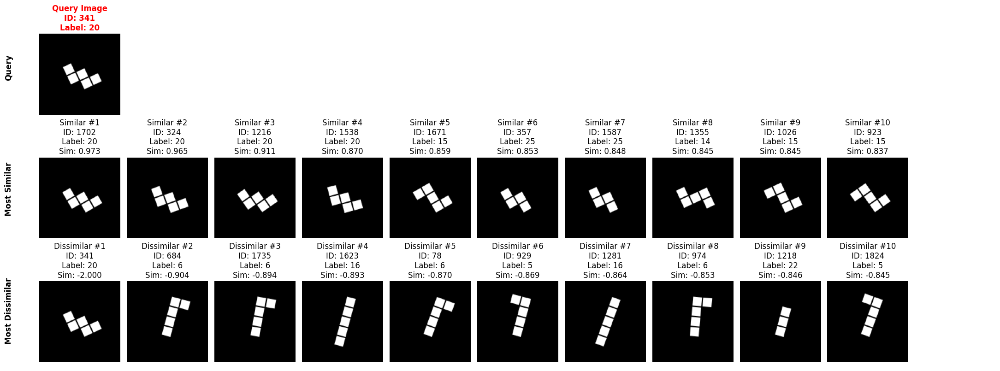


Similarity Statistics:
  Most Similar - Mean: 0.8806, Std: 0.0485
  Most Dissimilar - Mean: -0.9840, Std: 0.3392

Class Distribution:
  Query class: 20
  Most similar classes: [20 20 20 20 15 25 25 14 15 15]
  Most dissimilar classes: [20  6  6 16  6  5 16  6 22  5]
  Same class in most similar: 4/10 (40.0%)
  Same class in most dissimilar: 1/10 (10.0%)

SAMPLE 8/10 - Image ID: 1021
Query Image - ID: 1021, Label: 18
Most Similar Scores: [0.9637929  0.9509493  0.8648995  0.8237778  0.7390634  0.732872
 0.7185898  0.7169446  0.71097386 0.71044046]
Most Dissimilar Scores: [-2.         -0.73499405 -0.73300207 -0.7186706  -0.69788563 -0.69229037
 -0.6913548  -0.69071305 -0.68769145 -0.682788  ]


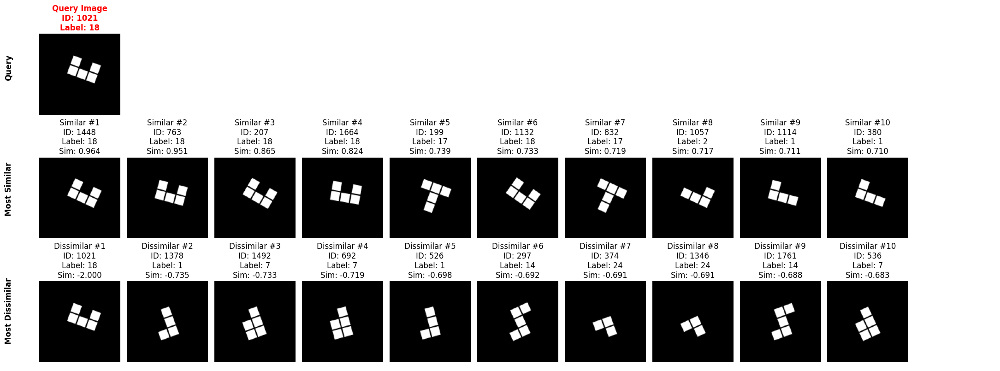


Similarity Statistics:
  Most Similar - Mean: 0.7932, Std: 0.0957
  Most Dissimilar - Mean: -0.8329, Std: 0.3894

Class Distribution:
  Query class: 18
  Most similar classes: [18 18 18 18 17 18 17  2  1  1]
  Most dissimilar classes: [18  1  7  7  1 14 24 24 14  7]
  Same class in most similar: 5/10 (50.0%)
  Same class in most dissimilar: 1/10 (10.0%)

SAMPLE 9/10 - Image ID: 396
Query Image - ID: 396, Label: 29
Most Similar Scores: [0.9762925  0.9736839  0.9077324  0.8969906  0.87106454 0.8699197
 0.8631967  0.85195434 0.84746355 0.8470887 ]
Most Dissimilar Scores: [-2.         -0.9250914  -0.9200367  -0.88270783 -0.84262013 -0.7893946
 -0.781518   -0.7644607  -0.7531507  -0.7463706 ]


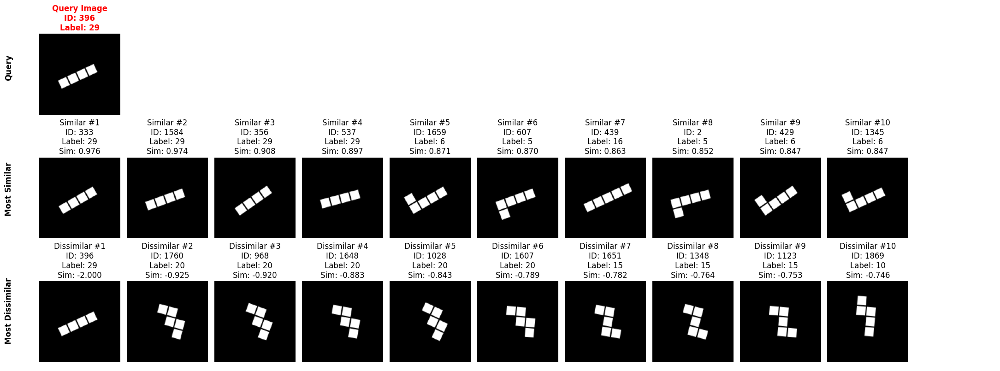


Similarity Statistics:
  Most Similar - Mean: 0.8905, Std: 0.0462
  Most Dissimilar - Mean: -0.9405, Std: 0.3589

Class Distribution:
  Query class: 29
  Most similar classes: [29 29 29 29  6  5 16  5  6  6]
  Most dissimilar classes: [29 20 20 20 20 20 15 15 15 10]
  Same class in most similar: 4/10 (40.0%)
  Same class in most dissimilar: 1/10 (10.0%)

SAMPLE 10/10 - Image ID: 1895
Query Image - ID: 1895, Label: 18
Most Similar Scores: [0.9740639  0.9646828  0.8727782  0.86602163 0.80123436 0.78802717
 0.7856499  0.77623653 0.77397627 0.77149177]
Most Dissimilar Scores: [-2.         -0.8150099  -0.8106327  -0.7543932  -0.7446441  -0.74216574
 -0.73837554 -0.7353196  -0.7349736  -0.7237534 ]


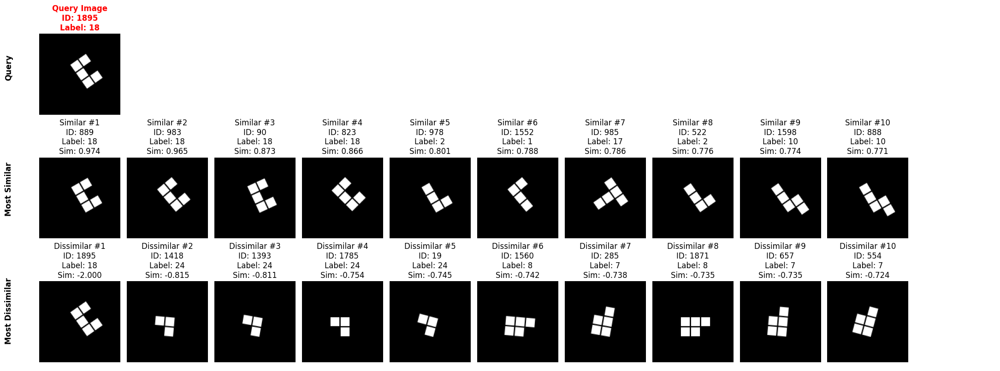


Similarity Statistics:
  Most Similar - Mean: 0.8374, Std: 0.0745
  Most Dissimilar - Mean: -0.8799, Std: 0.3746

Class Distribution:
  Query class: 18
  Most similar classes: [18 18 18 18  2  1 17  2 10 10]
  Most dissimilar classes: [18 24 24 24 24  8  7  8  7  7]
  Same class in most similar: 4/10 (40.0%)
  Same class in most dissimilar: 1/10 (10.0%)


In [38]:
def find_similar_dissimilar_images(all_latents, all_images, all_labels, num_samples=5, 
                                   num_similar=10, num_dissimilar=10):
    # Randomly sample images
    sample_indices = np.random.choice(len(all_latents), size=num_samples, replace=False)
    
    for sample_idx, query_idx in enumerate(sample_indices):
        print(f"\n{'='*60}")
        print(f"SAMPLE {sample_idx + 1}/{num_samples} - Image ID: {query_idx}")
        print(f"{'='*60}")
        
        # Get query image and its latent representation
        query_latent = all_latents[query_idx:query_idx+1]  # Keep 2D shape for cosine_similarity
        query_image = all_images[query_idx]
        query_label = all_labels[query_idx]
        
        # Compute cosine similarities with all other images
        similarities = cosine_similarity(query_latent, all_latents)[0]
        
        # Remove self-similarity (similarity with itself)
        similarities[query_idx] = -2  # Set to very low value to exclude it
        
        # Find most similar images
        most_similar_indices = np.argsort(similarities)[-num_similar:][::-1]  # Descending order
        most_similar_scores = similarities[most_similar_indices]
        
        # Find most dissimilar images
        most_dissimilar_indices = np.argsort(similarities)[:num_dissimilar]  # Ascending order
        most_dissimilar_scores = similarities[most_dissimilar_indices]
        
        print(f"Query Image - ID: {query_idx}, Label: {query_label}")
        print(f"Most Similar Scores: {most_similar_scores}")
        print(f"Most Dissimilar Scores: {most_dissimilar_scores}")
        
        # Plot results
        fig, axes = plt.subplots(3, max(num_similar, num_dissimilar) + 1, 
                                figsize=(2 * (max(num_similar, num_dissimilar) + 1), 8))
        
        # Ensure axes is 2D even if we have only one row
        if len(axes.shape) == 1:
            axes = axes.reshape(1, -1)
        
        # Plot query image in first column of first row
        axes[0, 0].imshow(query_image.squeeze(), cmap='gray')
        axes[0, 0].set_title(f'Query Image\nID: {query_idx}\nLabel: {query_label}', 
                            fontweight='bold', color='red')
        axes[0, 0].axis('off')
        
        # Hide unused cells in first row
        for j in range(1, axes.shape[1]):
            axes[0, j].axis('off')
        
        # Plot most similar images in second row
        for i, (idx, score) in enumerate(zip(most_similar_indices, most_similar_scores)):
            if i < axes.shape[1]:
                axes[1, i].imshow(all_images[idx].squeeze(), cmap='gray')
                axes[1, i].set_title(f'Similar #{i+1}\nID: {idx}\nLabel: {all_labels[idx]}\nSim: {score:.3f}')
                axes[1, i].axis('off')
        
        # Hide unused cells in second row
        for j in range(len(most_similar_indices), axes.shape[1]):
            axes[1, j].axis('off')
        
        # Plot most dissimilar images in third row
        for i, (idx, score) in enumerate(zip(most_dissimilar_indices, most_dissimilar_scores)):
            if i < axes.shape[1]:
                axes[2, i].imshow(all_images[idx].squeeze(), cmap='gray')
                axes[2, i].set_title(f'Dissimilar #{i+1}\nID: {idx}\nLabel: {all_labels[idx]}\nSim: {score:.3f}')
                axes[2, i].axis('off')
        
        # Hide unused cells in third row
        for j in range(len(most_dissimilar_indices), axes.shape[1]):
            axes[2, j].axis('off')
        
        # Add row labels
        fig.text(0.02, 0.83, 'Query', rotation=90, fontsize=12, fontweight='bold', 
                va='center', ha='center')
        fig.text(0.02, 0.5, 'Most Similar', rotation=90, fontsize=12, fontweight='bold', 
                va='center', ha='center')
        fig.text(0.02, 0.17, 'Most Dissimilar', rotation=90, fontsize=12, fontweight='bold', 
                va='center', ha='center')
        
        plt.tight_layout()
        plt.subplots_adjust(left=0.05)
        plt.show()
        
        # Print detailed statistics
        print(f"\nSimilarity Statistics:")
        print(f"  Most Similar - Mean: {np.mean(most_similar_scores):.4f}, "
              f"Std: {np.std(most_similar_scores):.4f}")
        print(f"  Most Dissimilar - Mean: {np.mean(most_dissimilar_scores):.4f}, "
              f"Std: {np.std(most_dissimilar_scores):.4f}")
        
        # Analyze class distribution
        similar_labels = all_labels[most_similar_indices]
        dissimilar_labels = all_labels[most_dissimilar_indices]
        
        print(f"\nClass Distribution:")
        print(f"  Query class: {query_label}")
        print(f"  Most similar classes: {similar_labels}")
        print(f"  Most dissimilar classes: {dissimilar_labels}")
        
        # Count same-class similarities
        same_class_similar = np.sum(similar_labels == query_label)
        same_class_dissimilar = np.sum(dissimilar_labels == query_label)
        
        print(f"  Same class in most similar: {same_class_similar}/{num_similar} "
              f"({100*same_class_similar/num_similar:.1f}%)")
        print(f"  Same class in most dissimilar: {same_class_dissimilar}/{num_dissimilar} "
              f"({100*same_class_dissimilar/num_dissimilar:.1f}%)")


find_similar_dissimilar_images(all_latents, all_images, all_labels, num_samples=10, num_similar=10, num_dissimilar=10)